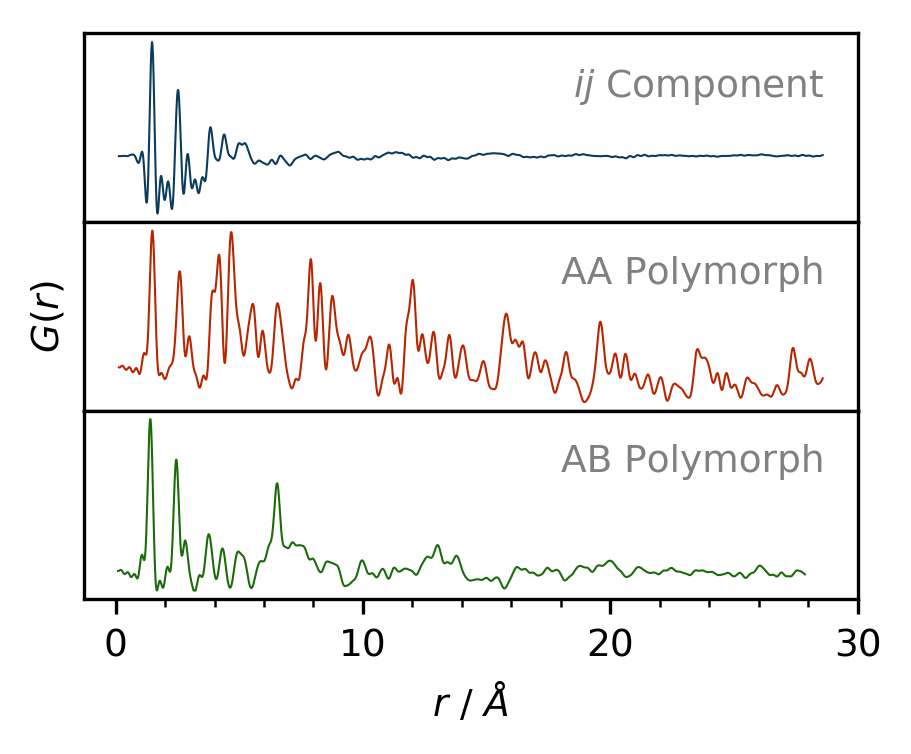

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\NMF_PDF_0.99\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=0)
A = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=1) 
R1 = np.genfromtxt('1_NMF_PDF.gr', delimiter=' ', usecols=0)
B = np.genfromtxt('1_NMF_PDF.gr', delimiter=' ', usecols=1)
R2 = np.genfromtxt('2_NMF_PDF.gr', delimiter=' ', usecols=0)
C = np.genfromtxt('2_NMF_PDF.gr', delimiter=' ', usecols=1)

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,A, linewidth=0.5, color='#0B3C5D', label='A')
ax0.set_yticks(())
ax0.set_xticks(())
ax1 = plt.subplot(G00[1,0])
ax1.plot(R1,B, linewidth=0.5, color='#B82601', label='B')
ax1.set_yticks(())
ax1.set_xticks(())
ax2 = plt.subplot(G00[2,0])
ax2.plot(R2,C, linewidth=0.5, color='#1C6B0A', label='C')
ax2.set_yticks(())
ax2.set_xticks((0,10,20,30))
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax2.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

ax0.add_artist(AnchoredText("$\it{ij}$ Component", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText("AA Polymorph", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText("AB Polymorph", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
f.tight_layout
plt.savefig('20200311_Dan_PDF-NMF_COFs.tif')
plt.show()

C:\Users\donolan\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide
C:\Users\donolan\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:61: RuntimeWarning: divide by zero encountered in log


0.10000000221634056


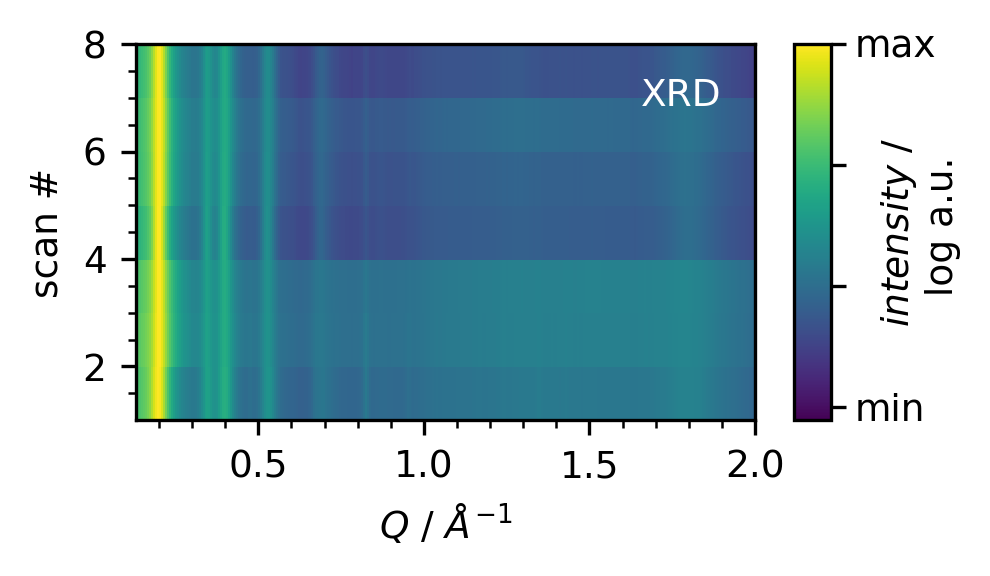

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.offsetbox import AnchoredText
import matplotlib.gridspec as gridspec
import pandas as pd
import os, sys, glob

#Set file path
path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201907_11-ID-B_TPB-DMTP-COF\_0_processing\\'
os.chdir(path)

##############################
# Raw PDF and XRD ImagePlots #
##############################

XRD_files = glob.glob(path + "/*.chi")
list0 = []
for filename in XRD_files:
    df = np.genfromtxt(filename, usecols=1, delimiter='   ', skip_header=int(4))
    kapton = np.genfromtxt('d1200-SC1_MOFmono_kapton-000000_tif_A0.chi', usecols=1, delimiter='   ', skip_header=int(4))
    norm0 = np.subtract(df, kapton)
    norm1 = (norm0-norm0.min())/(norm0.max()-norm0.min())
    list0.append(norm1)
XRD = pd.DataFrame(np.array(list0).T, index=['R{}'.format(i) for i in range(len(norm1))])
XRD = XRD.drop([8],axis=1)

'''
PDF_files = glob.glob(path + "/*A0.gr")
list1 = []
for filename in PDF_files:
    df = np.genfromtxt(filename, usecols=1, delimiter=' ', skip_header=int(26))
    ndf = (df-df.min())/(df.max()-df.min())
    list1.append(ndf)
PDF = pd.DataFrame(np.array(list1).T, index=['R{}'.format(i) for i in range(len(ndf))])
'''
tt = np.genfromtxt('d1200-SC1_MOFmono_kapton-000000_tif_A0.chi', delimiter='   ', usecols=0, skip_header=4)
Q = ((4*((np.pi))*(np.sin(np.deg2rad(tt/2))))/0.2113)
r = np.arange(0,30.01,0.01)
Y = np.arange(1,9,1)
print(Q.min())

f = plt.figure(figsize=(3.33, 1.66), dpi=300)
gs0 = gridspec.GridSpec(1,1, figure=f, hspace=0.5)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
'''
ax0 = plt.subplot(G00[0,0])
c=ax0.pcolor(r, Y, PDF.T, vmax=1, cmap='bwr')
cbar = plt.colorbar(c, ax=ax0, aspect=10, spacing='proportional')
cbar.set_label('$\it{G(r)}$', fontsize=9)
ax0.set_xlim(0,30)
ax0.tick_params(axis='x', labelsize=9)
ax0.tick_params(axis='y', labelsize=9)
ax0.minorticks_on()
ax0.set_ylabel('scan #', fontsize=9)
ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)

G01 = gs0[1].subgridspec(1, 1, hspace=0)
'''
ax1 = plt.subplot(G00[0,0])
d=ax1.pcolor(Q, Y, np.log(XRD.T))#, vmax=1)
cbar1 = plt.colorbar(d, ax=ax1, aspect=10, spacing='proportional', format='')
cbar1.set_label('$\it{intensity}$ / \n log a.u.', fontsize=9)
ax1.set_xlim(0.13,2)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.set_ylabel('scan #', fontsize=9)
ax1.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)

'''ax0.add_artist(AnchoredText("PDF", loc=1, frameon=False, prop=dict(color='#ffffff', fontsize=9)))'''
ax1.add_artist(AnchoredText("XRD", loc=1, frameon=False, prop=dict(color='#ffffff', fontsize=9)))
ax1.text(2.3,1,'min', fontsize=9)
ax1.text(2.3,7.75,'max', fontsize=9)

plt.savefig('20200311_Dan_PDF_COFs.tif')
plt.show()

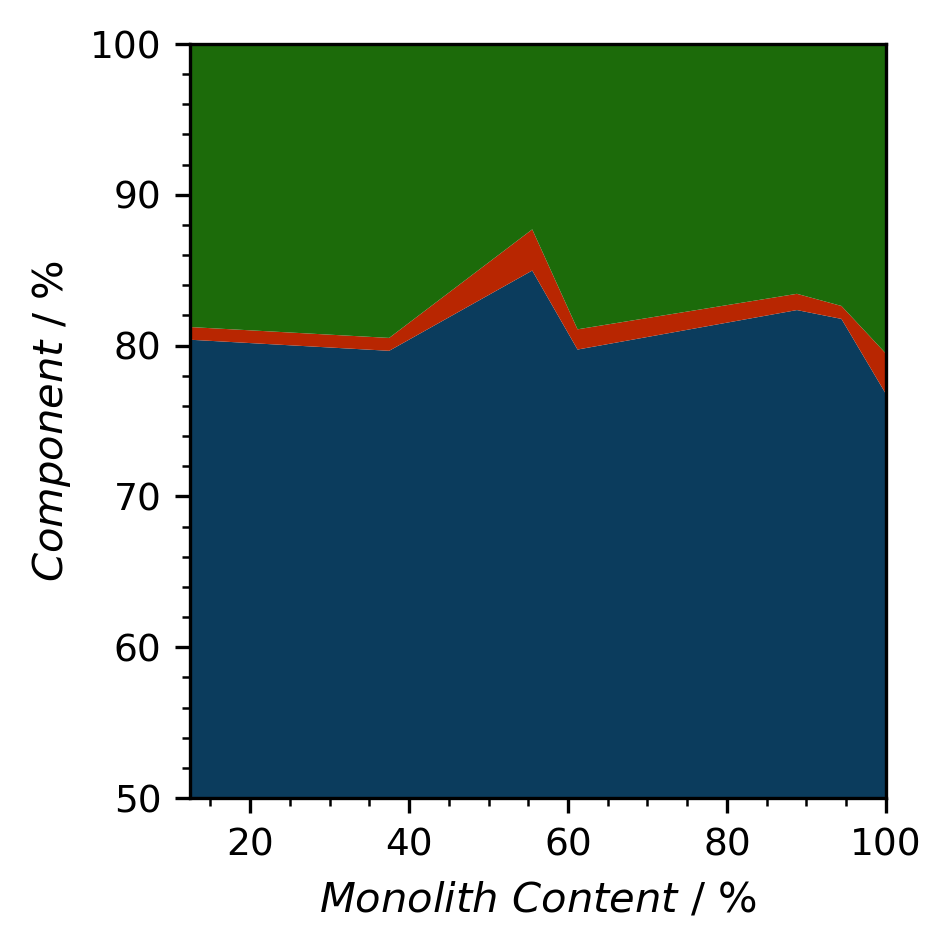

In [151]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\NMF_PDF_0.99\\'
os.chdir(path)

H_ind = np.genfromtxt('HT.csv', delimiter=',',usecols=0, skip_header=1)

HA = np.genfromtxt('HT.csv', delimiter=',',usecols=1, skip_header=1)
HB = np.genfromtxt('HT.csv', delimiter=',',usecols=2, skip_header=1)
HC = np.genfromtxt('HT.csv', delimiter=',',usecols=3, skip_header=1)

f = plt.figure(figsize=(3.33, 3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 10, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,1:])

ax0.stackplot(H_ind, HA,HB,HC, colors=('#0B3C5D','#B82601','#1C6B0A'))
ax0.set_ylim(50,100)
ax0.set_xlim(12.5,100)
ax0.tick_params(axis='x', labelsize=9)
ax0.tick_params(axis='y', labelsize=9)
plt.minorticks_on()

ax0.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %')
ax0.set_ylabel(r'$\it{Component}$ / %')

plt.savefig('20200311_Dan_COF-Components.tif')
plt.show()

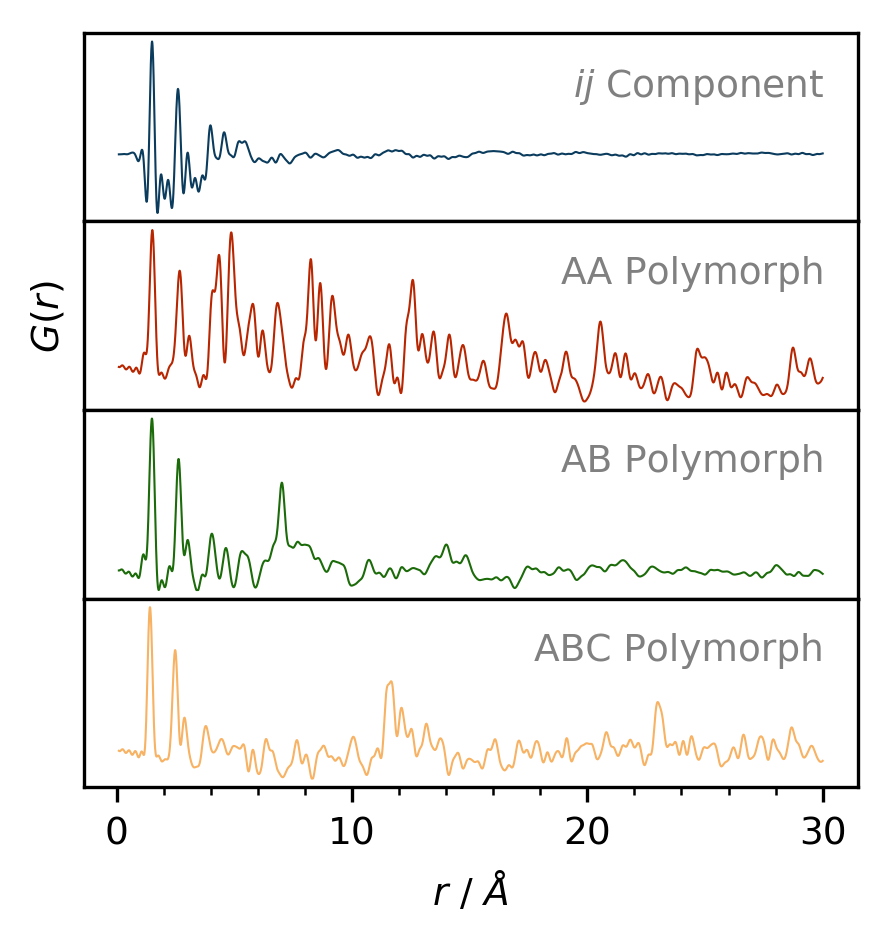

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\NMF_PDF_0.99_ABC\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=0)
A = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=1) 
R1 = np.genfromtxt('1_NMF_PDF.gr', delimiter=' ', usecols=0)
B = np.genfromtxt('1_NMF_PDF.gr', delimiter=' ', usecols=1)
R2 = np.genfromtxt('2_NMF_PDF.gr', delimiter=' ', usecols=0)
C = np.genfromtxt('2_NMF_PDF.gr', delimiter=' ', usecols=1)
R3 = np.genfromtxt('3_NMF_PDF.gr', delimiter=' ', usecols=0)
D = np.genfromtxt('3_NMF_PDF.gr', delimiter=' ', usecols=1)

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,A, linewidth=0.5, color='#0B3C5D', label='A')
ax0.set_yticks(())
ax0.set_xticks(())
ax1 = plt.subplot(G00[1,0])
ax1.plot(R1,B, linewidth=0.5, color='#B82601', label='B')
ax1.set_yticks(())
ax1.set_xticks(())
ax2 = plt.subplot(G00[2,0])
ax2.plot(R2,C, linewidth=0.5, color='#1C6B0A', label='C')
ax2.set_yticks(())
ax2.set_xticks(())
ax3 = plt.subplot(G00[3,0])
ax3.plot(R3,D, linewidth=0.5, color='#f7b263', label='D')
ax3.set_yticks(())
ax3.set_xticks((0,10,20,30))
ax3.tick_params(axis='x', labelsize=9)
ax3.minorticks_on()

ax3.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

ax0.add_artist(AnchoredText("$\it{ij}$ Component", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText("AA Polymorph", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText("AB Polymorph", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax3.add_artist(AnchoredText("ABC Polymorph", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
f.tight_layout
plt.savefig('20200311_Dan_PDF-NMF_COFs.tif')
plt.show()

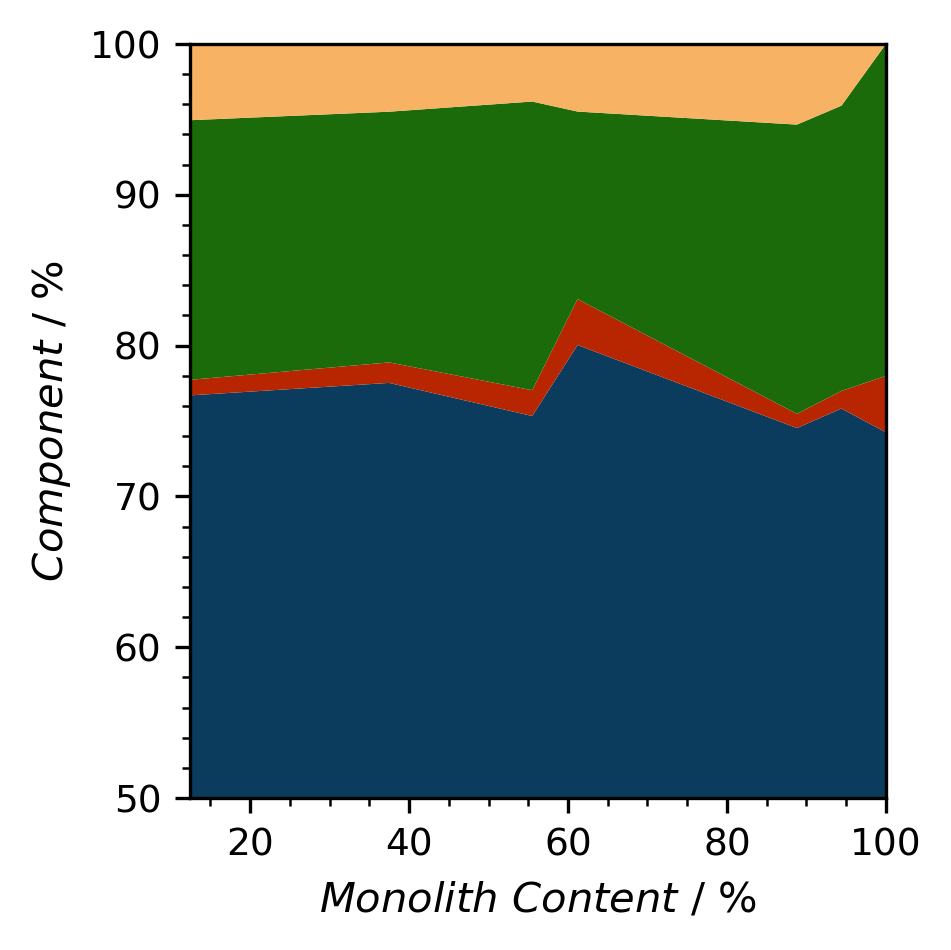

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\NMF_PDF_0.99_ABC\\'
os.chdir(path)

H_ind = np.genfromtxt('HT.csv', delimiter=',',usecols=0, skip_header=1)

HA = np.genfromtxt('HT.csv', delimiter=',',usecols=1, skip_header=1)
HB = np.genfromtxt('HT.csv', delimiter=',',usecols=2, skip_header=1)
HC = np.genfromtxt('HT.csv', delimiter=',',usecols=3, skip_header=1)
HD = np.genfromtxt('HT.csv', delimiter=',',usecols=4, skip_header=1)

f = plt.figure(figsize=(3.33, 3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 10, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,1:])

ax0.stackplot(H_ind, HA,HB,HC,HD, colors=('#0B3C5D','#B82601','#1C6B0A','#f7b263'))
ax0.set_ylim(50,100)
ax0.set_xlim(12.5,100)
ax0.tick_params(axis='x', labelsize=9)
ax0.tick_params(axis='y', labelsize=9)
plt.minorticks_on()

ax0.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %')
ax0.set_ylabel(r'$\it{Component}$ / %')

plt.savefig('20200311_Dan_COF-Components.tif')
plt.show()

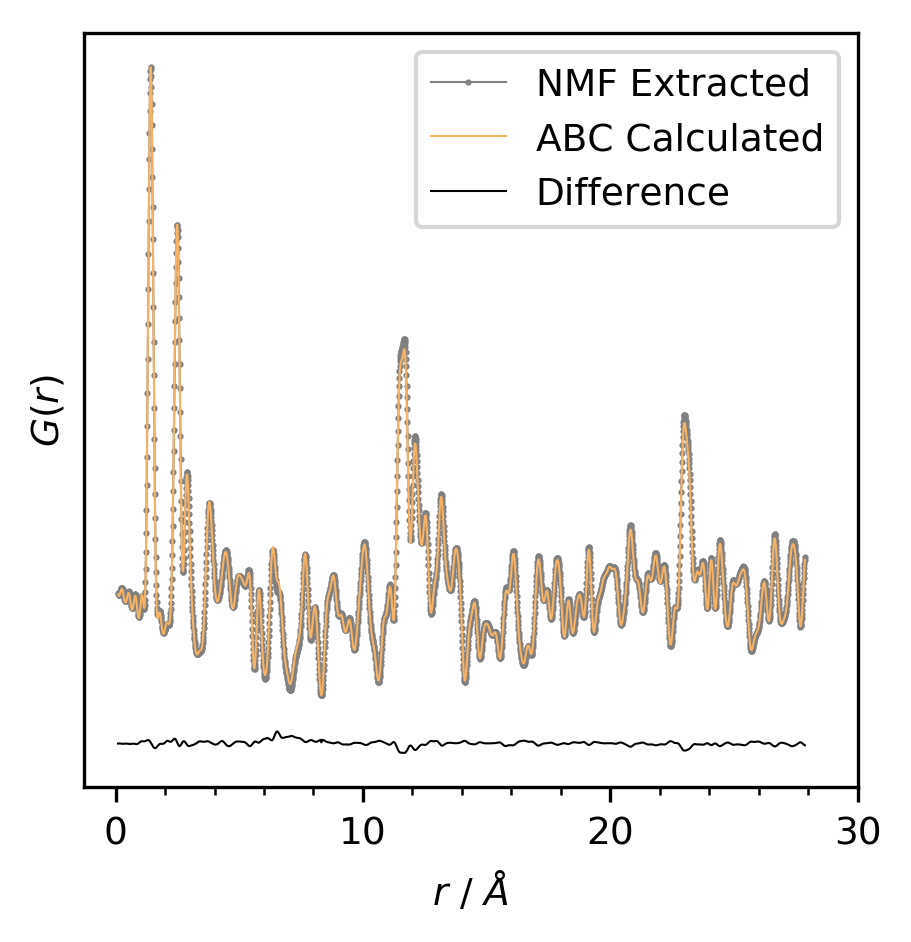

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\NMF_PDF_0.99_ABC\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('3_NMF_PDF.gr', delimiter=' ', usecols=0, skip_footer=int(214))
A = np.genfromtxt('3_NMF_PDF.gr', delimiter=' ', usecols=1, skip_footer=int(214)) 
A1 = (A-A.min())/(A.max()-A.min())
R1 = np.genfromtxt('ABC.gr', delimiter=' ', usecols=0, skip_header=int(36), skip_footer=int(214))
B = np.genfromtxt('ABC.gr', delimiter=' ', usecols=1, skip_header=int(36), skip_footer=int(214))
B1 = (B-B.min())/(B.max()-B.min())

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,A1, linewidth=0.5, color='#808080', marker='o', markersize=0.5, label='NMF Extracted')
ax0.plot(R1,B1, linewidth=0.5, color='#f7b263', label='ABC Calculated')
ax0.plot(R1,B1-A1-0.075, linewidth=0.5, color='k', label='Difference')
ax0.set_yticks(())
ax0.set_xticks((0,10,20,30))
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=9)
f.tight_layout
plt.savefig('20200312_Dan_ABC_PDF_COFs.tif')
plt.show()

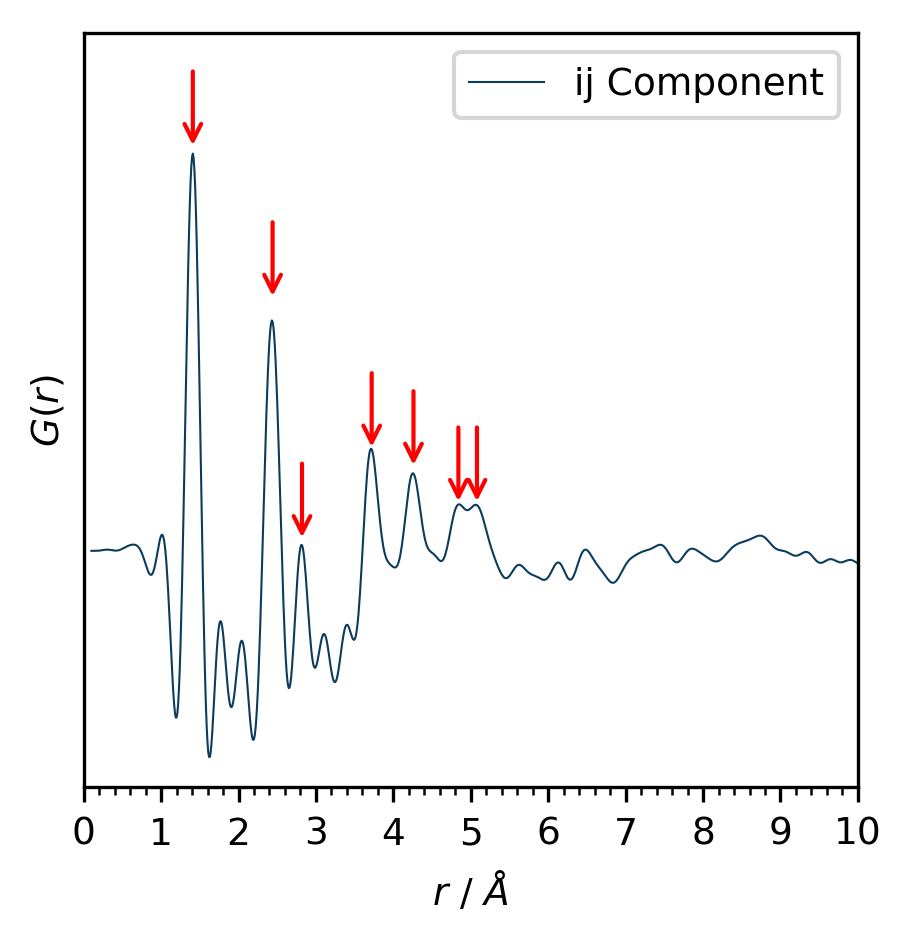

In [89]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\NMF_PDF_0.99_ABC\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=0, skip_footer=int(214))
A = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=1, skip_footer=int(214)) 
A1 = (A-A.min())/(A.max()-A.min())

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,A1, linewidth=0.5, color='#0B3C5D', label='ij Component')
ax0.set_yticks(())
ax0.set_xticks((0,1,2,3,4,5,6,7,8,9,10))
ax0.set_ylim(-0.05,1.2)
ax0.set_xlim(0,10)
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=9)
f.tight_layout

ax0.annotate('', xy=(1.41,1), xytext=(1.41,1.15),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))
ax0.annotate('', xy=(2.44,0.75), xytext=(2.44,0.9),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))
ax0.annotate('', xy=(2.82,0.35), xytext=(2.82,0.5),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))
ax0.annotate('', xy=(3.72,0.5), xytext=(3.72,0.65),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))
ax0.annotate('', xy=(4.26,0.47), xytext=(4.26,0.62),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))
ax0.annotate('', xy=(4.84,0.41), xytext=(4.84,0.56),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))
ax0.annotate('', xy=(5.08,0.41), xytext=(5.08,0.56),arrowprops=dict(arrowstyle="->",color='r',connectionstyle="arc3"))

plt.savefig('20200312_Dan_ij_PDF_COFs.tif')
plt.show()

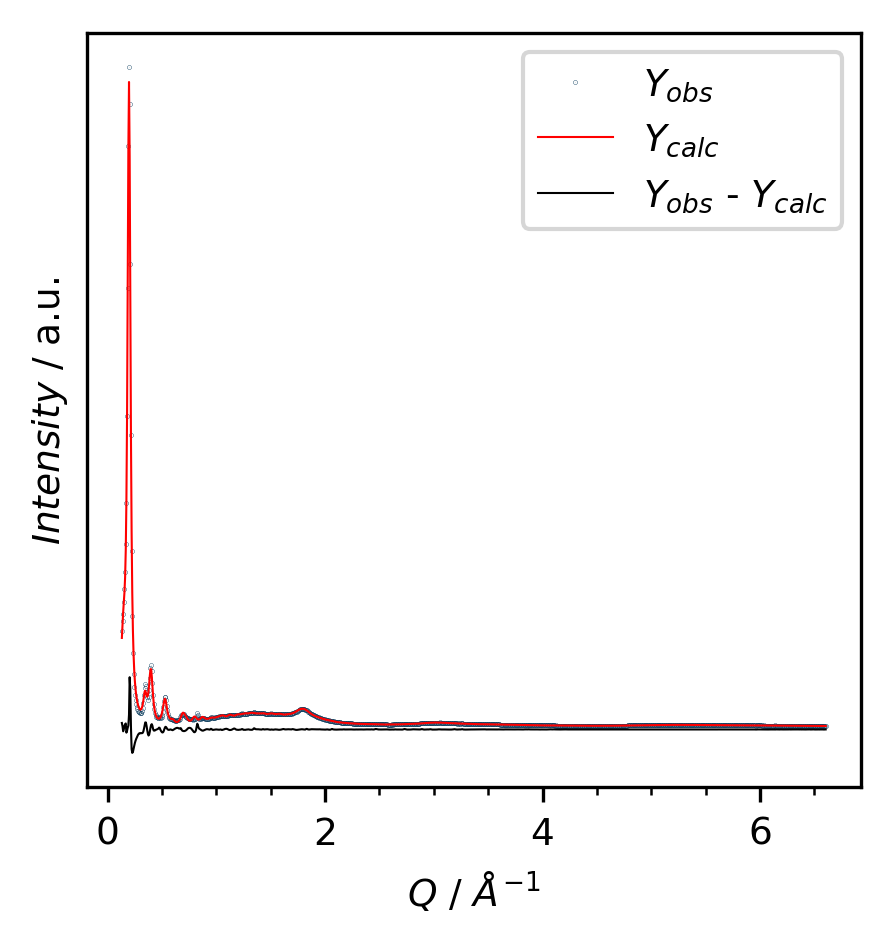

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201907_11-ID-B_TPB-DMTP-COF\_1_analysis\kaptonsubtracted\lebail\AB_LeBail\input2\\'
os.chdir(path)

##XRD##
X = np.genfromtxt('15AB_output.xy',delimiter='   ', usecols=0)
Yobs = np.genfromtxt('15AB_output.xy',delimiter='   ', usecols=1)
Ycalc = np.genfromtxt('15AB_output.xy',delimiter='   ', usecols=2)
Ydiff = Yobs - Ycalc

wavelength=0.2113
Q=((4*((np.pi))*(np.sin(np.deg2rad(X/2))))/wavelength)

##HKL##

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(Q,Yobs, linewidth=0, color='#0B3C5D', marker='o', markersize=0.1, label='$Y_{obs}$')
ax0.plot(Q,Ycalc, linewidth=0.5, color='r', label='$Y_{calc}$')
ax0.plot(Q,Ydiff, linewidth=0.5, color='k', label='$Y_{obs}$ - $Y_{calc}$')
ax0.set_yticks(())
#ax0.set_xticks((0,2.5, 5, 7.5, 10, 12.5))
#ax0.set_xlim(0.250302, 12.753718) #0.250302, 12.753718
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{Intensity}$ / a.u.', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=9)
f.tight_layout
#plt.savefig('20200312_Dan_ABC_PDF_COFs.tif')
plt.show()

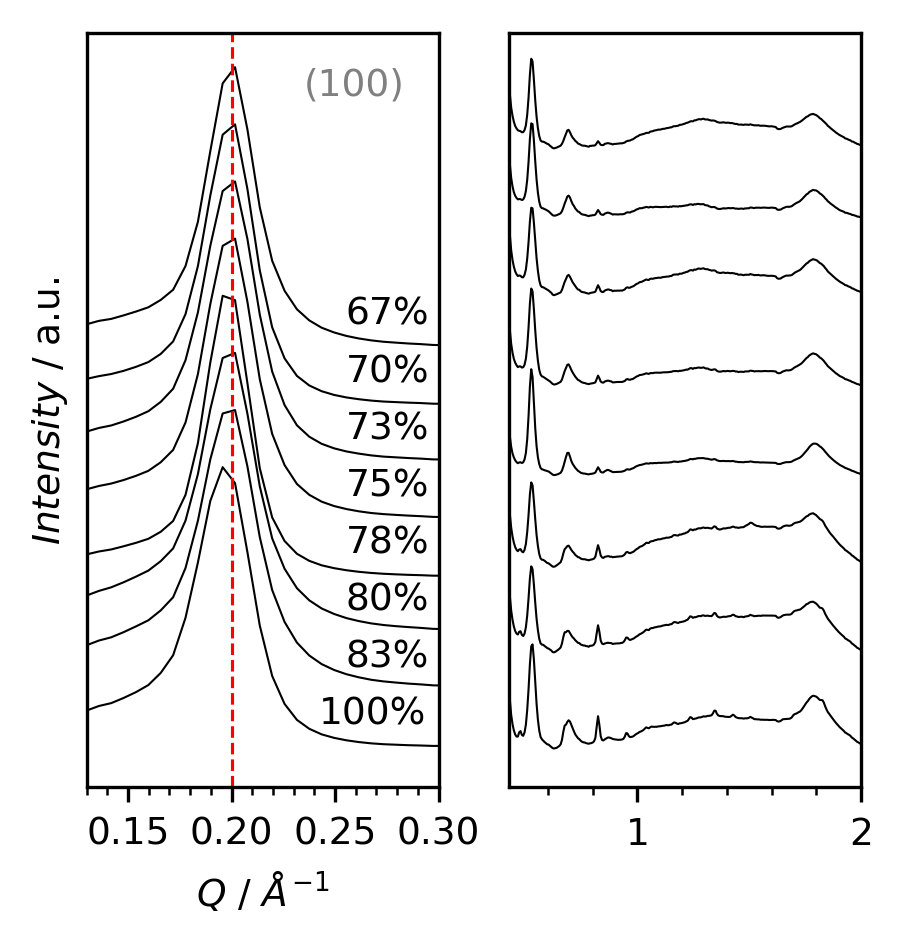

In [104]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201907_11-ID-B_TPB-DMTP-COF\_1_analysis\kaptonsubtracted\lebail\AB_LeBail\input2\\'
os.chdir(path)

##XRD##
X15 = np.genfromtxt('15.xye', delimiter='     ', usecols=0)
Y15 = np.genfromtxt('15.xye', delimiter='     ', usecols=1)
nY15 = (Y15-Y15.min())/(Y15.max()-Y15.min())

X16 = np.genfromtxt('16.xye', delimiter='     ', usecols=0)
Y16 = np.genfromtxt('16.xye', delimiter='     ', usecols=1)
nY16 = (Y16-Y16.min())/(Y16.max()-Y16.min())

X17 = np.genfromtxt('17.xye', delimiter='     ', usecols=0)
Y17 = np.genfromtxt('17.xye', delimiter='     ', usecols=1)
nY17 = (Y17-Y17.min())/(Y17.max()-Y17.min())

X18 = np.genfromtxt('18.xye', delimiter='     ', usecols=0)
Y18 = np.genfromtxt('18.xye', delimiter='     ', usecols=1)
nY18 = (Y18-Y18.min())/(Y18.max()-Y18.min())

X19 = np.genfromtxt('19.xye', delimiter='     ', usecols=0)
Y19 = np.genfromtxt('19.xye', delimiter='     ', usecols=1)
nY19 = (Y19-Y19.min())/(Y19.max()-Y19.min())

X20 = np.genfromtxt('20.xye', delimiter='     ', usecols=0)
Y20 = np.genfromtxt('20.xye', delimiter='     ', usecols=1)
nY20 = (Y20-Y20.min())/(Y20.max()-Y20.min())

X21 = np.genfromtxt('21.xye', delimiter='     ', usecols=0)
Y21 = np.genfromtxt('21.xye', delimiter='     ', usecols=1)
nY21 = (Y21-Y21.min())/(Y21.max()-Y21.min())

X26 = np.genfromtxt('26.xye', delimiter='     ', usecols=0)
Y26 = np.genfromtxt('26.xye', delimiter='     ', usecols=1)
nY26 = (Y26-Y26.min())/(Y26.max()-Y26.min())

wavelength=0.2113
Q15 = ((4*((np.pi))*(np.sin(np.deg2rad(X15/2))))/wavelength)
Q16 = ((4*((np.pi))*(np.sin(np.deg2rad(X16/2))))/wavelength)
Q17 = ((4*((np.pi))*(np.sin(np.deg2rad(X17/2))))/wavelength)
Q18 = ((4*((np.pi))*(np.sin(np.deg2rad(X18/2))))/wavelength)
Q19 = ((4*((np.pi))*(np.sin(np.deg2rad(X19/2))))/wavelength)
Q20 = ((4*((np.pi))*(np.sin(np.deg2rad(X20/2))))/wavelength)
Q21 = ((4*((np.pi))*(np.sin(np.deg2rad(X21/2))))/wavelength)
Q26 = ((4*((np.pi))*(np.sin(np.deg2rad(X26/2))))/wavelength)

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 2, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(Q15,nY15,'k', linewidth=0.5)
ax0.plot(Q16,nY16+0.2,'k', linewidth=0.5)
ax0.plot(Q17,nY17+0.4,'k', linewidth=0.5)
ax0.plot(Q18,nY18+0.6,'k', linewidth=0.5)
ax0.plot(Q19,nY19+0.8,'k', linewidth=0.5)
ax0.plot(Q20,nY20+1.0,'k', linewidth=0.5)
ax0.plot(Q21,nY21+1.2,'k', linewidth=0.5)
ax0.plot(Q26,nY26+1.4,'k', linewidth=0.5)

ax0.set_yticks(())
ax0.set_xlim(0.13,.3) 
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
ax0.axvline(x=0.2,ls='--',color='r', lw=0.75)
ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{Intensity}$ / a.u.', rotation='vertical', fontsize=9)
ax0.add_artist(AnchoredText("(100)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.text(0.242,0.1,'100%', color='k', fontsize=9)
ax0.text(0.255,0.3,'83%', color='k', fontsize=9)
ax0.text(0.255,0.5,'80%', color='k', fontsize=9)
ax0.text(0.255,0.7,'78%', color='k', fontsize=9)
ax0.text(0.255,0.9,'75%', color='k', fontsize=9)
ax0.text(0.255,1.1,'73%', color='k', fontsize=9)
ax0.text(0.255,1.3,'70%', color='k', fontsize=9)
ax0.text(0.255,1.5,'67%', color='k', fontsize=9)

G01 = gs0[1].subgridspec(1, 1, hspace=0, wspace=0.2)
ax1 = plt.subplot(G01[0,0])
ax1.plot(Q15,nY15,'k', linewidth=0.5)
ax1.plot(Q16,nY16+0.03,'k', linewidth=0.5)
ax1.plot(Q17,nY17+0.06,'k', linewidth=0.5)
ax1.plot(Q18,nY18+0.1,'k', linewidth=0.5)
ax1.plot(Q19,nY19+0.13,'k', linewidth=0.5)
ax1.plot(Q20,nY20+0.16,'k', linewidth=0.5)
ax1.plot(Q21,nY21+0.19,'k', linewidth=0.5)
ax1.plot(Q26,nY26+0.21,'k', linewidth=0.5)

ax1.set_yticks(())
ax1.set_ylim(0,0.26)
ax1.set_xlim(0.425,2) 
ax1.tick_params(axis='x', labelsize=9)
ax1.minorticks_on()

f.tight_layout
#plt.savefig('20200312_Dan_ABC_PDF_COFs.tif')
plt.show()

R-value = 0.056529601059531684


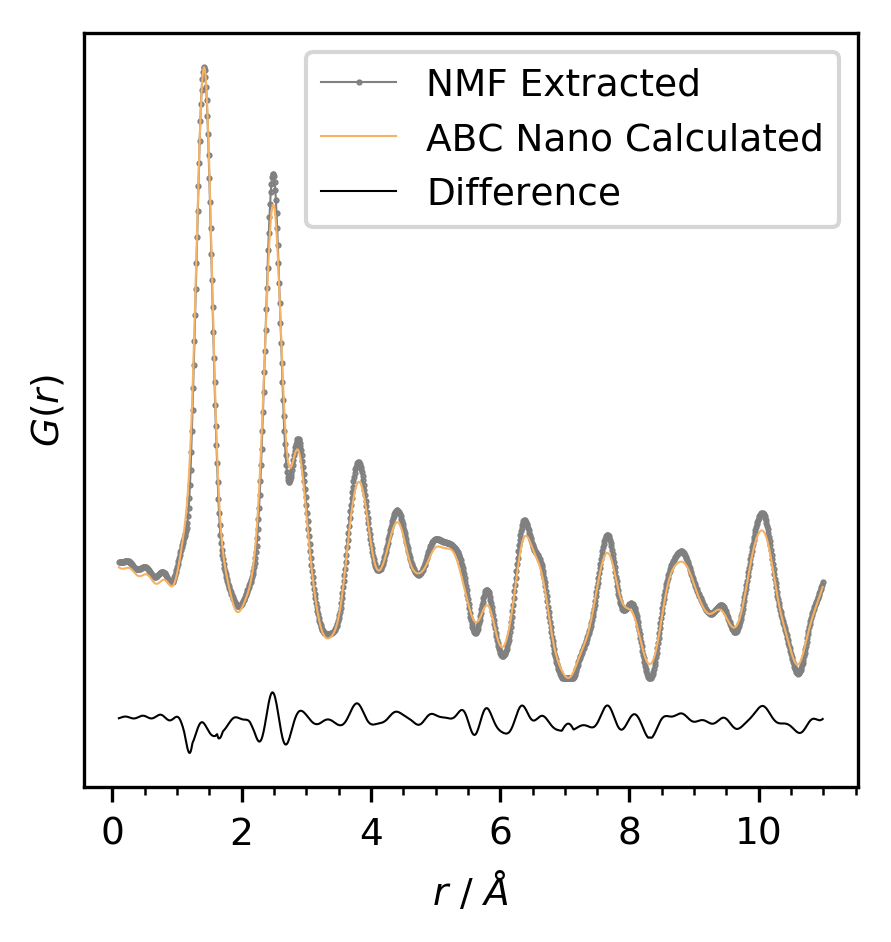

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_0_processing\Input Files\ij\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('2_NMF_PDF.gr', delimiter=' ', usecols=0, skip_footer=int(0))
o = np.genfromtxt('2_NMF_PDF.gr', delimiter=' ', usecols=1, skip_footer=int(0)) 
o1 = (o-o.min())/(o.max()-o.min())

R1 = np.genfromtxt('ABC_Bulk2.gr', delimiter=' ', usecols=0, skip_footer=int(1901))
c = np.genfromtxt('ABC_Bulk2.gr', delimiter=' ', usecols=1, skip_footer=int(1901))
c1 = (c-c.min())/(c.max()-c.min())

Rvalue =np.sqrt((sum((o1-c1)**2))/(sum(np.square(o1))))
print("R-value =", Rvalue)

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,o1, linewidth=0.5, color='#808080', marker='o', markersize=0.5, label='NMF Extracted')
ax0.plot(R1,c1, linewidth=0.5, color='#f7b263', label='ABC Nano Calculated')
ax0.plot(R1,o1-c1-0.075, linewidth=0.5, color='k', label='Difference')
ax0.set_yticks(())
ax0.set_xticks((0,2,4,6,8,10))
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=9)
f.tight_layout
#plt.savefig('20200312_Dan_ABC_PDF_COFs.tif')
plt.show()

R-value = 0.03881884277165007


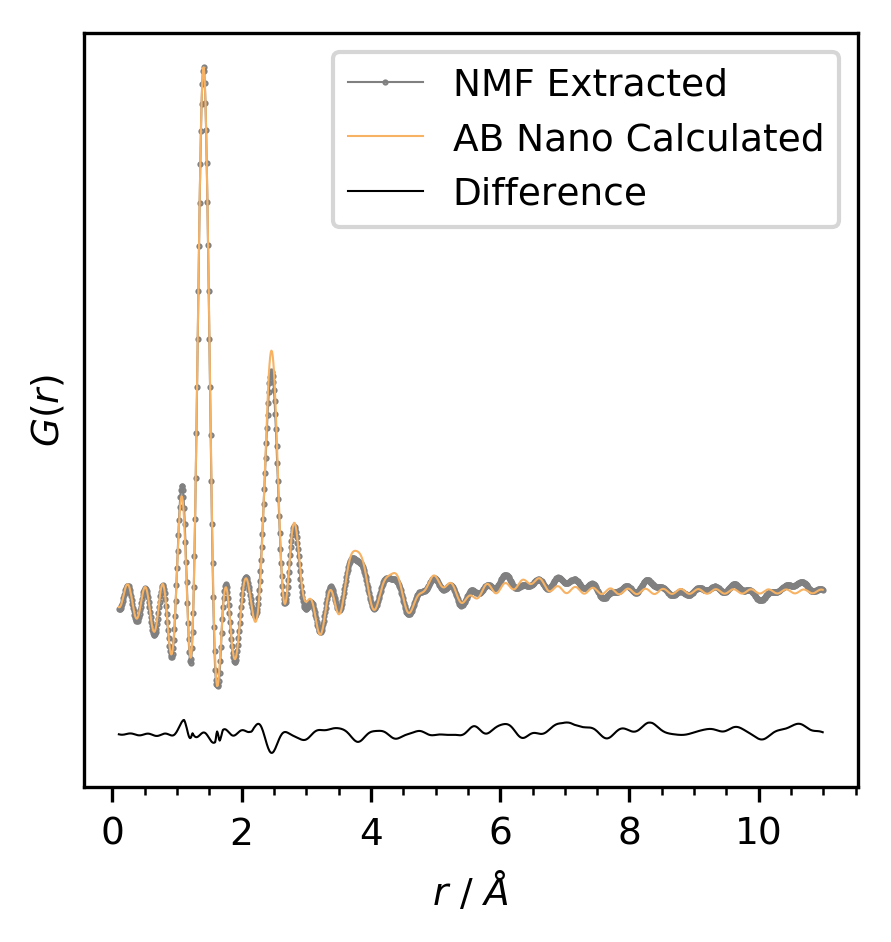

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_0_processing\Input Files\ij\sub_ij\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=0, skip_footer=int(0))
o = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=1, skip_footer=int(0)) 
o1 = (o-o.min())/(o.max()-o.min())

R1 = np.genfromtxt('AB_Nano1.gr', delimiter=' ', usecols=0, skip_footer=int(0))
c = np.genfromtxt('AB_Nano1.gr', delimiter=' ', usecols=1, skip_footer=int(0))
c1 = (c-c.min())/(c.max()-c.min())

Rvalue =np.sqrt((sum((o1-c1)**2))/(sum(np.square(o1))))
print("R-value =", Rvalue)

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,o1, linewidth=0.5, color='#808080', marker='o', markersize=0.5, label='NMF Extracted')
ax0.plot(R1,c1, linewidth=0.5, color='#f7b263', label='AB Nano Calculated')
ax0.plot(R1,o1-c1-0.075, linewidth=0.5, color='k', label='Difference')
ax0.set_yticks(())
ax0.set_xticks((0,2,4,6,8,10))
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=9)
f.tight_layout
#plt.savefig('20200312_Dan_ABC_PDF_COFs.tif')
plt.show()

Rwp = 0.19604822928694055


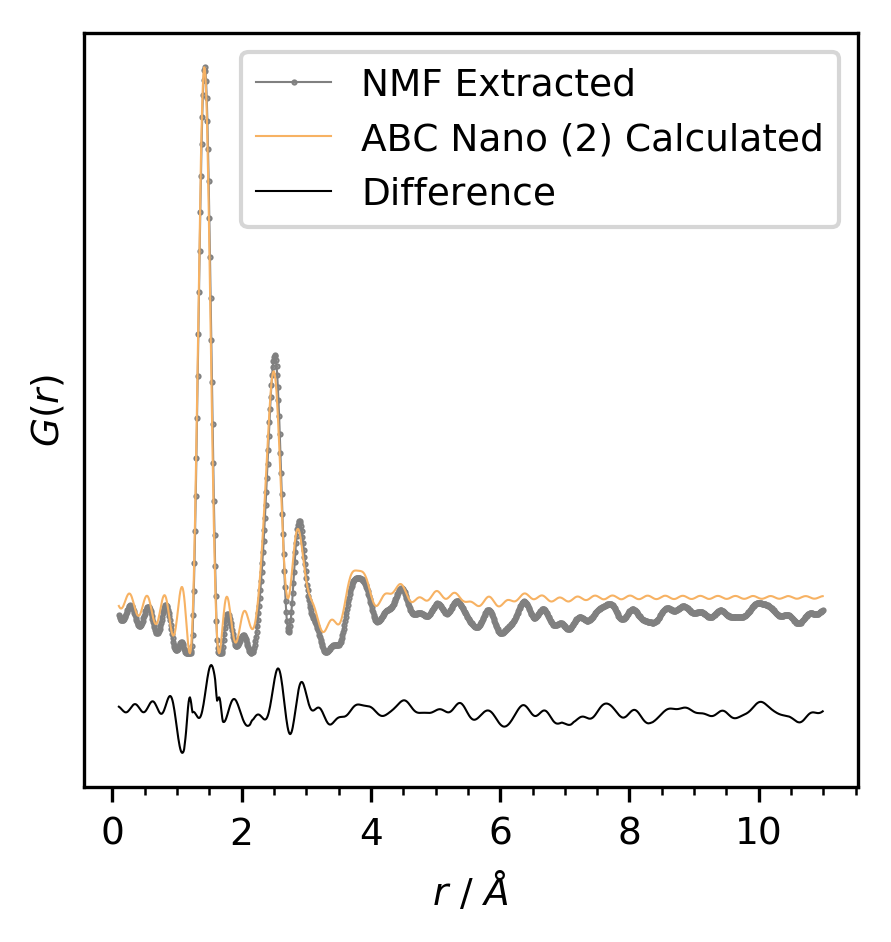

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_0_processing\Input Files\ij\sub1_ij\\'
os.chdir(path)

#############################
# NMF_PDF and NMF_XRD Plots #
#############################
R0 = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=0, skip_footer=int(0))
o = np.genfromtxt('0_NMF_PDF.gr', delimiter=' ', usecols=1, skip_footer=int(0)) 
o1 = (o-o.min())/(o.max()-o.min())

R1 = np.genfromtxt('ABC_Nano2.gr', delimiter=' ', usecols=0, skip_footer=int(0))
c = np.genfromtxt('ABC_Nano2.gr', delimiter=' ', usecols=1, skip_footer=int(0))
c1 = (c-c.min())/(c.max()-c.min())

Rwp =np.sqrt((sum((o1-c1)**2))/(sum(np.square(o1))))
print("Rwp =", Rwp)

f = plt.figure(figsize=(3.33,3.33), dpi=300)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(R0,o1, linewidth=0.5, color='#808080', marker='o', markersize=0.5, label='NMF Extracted')
ax0.plot(R1,c1, linewidth=0.5, color='#f7b263', label='ABC Nano (2) Calculated')
ax0.plot(R1,o1-c1-0.075, linewidth=0.5, color='k', label='Difference')
ax0.set_yticks(())
ax0.set_xticks((0,2,4,6,8,10))
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=9)
f.tight_layout
#plt.savefig('20200312_Dan_ABC_PDF_COFs.tif')
plt.show()

Rwp = 0.19604822928694055


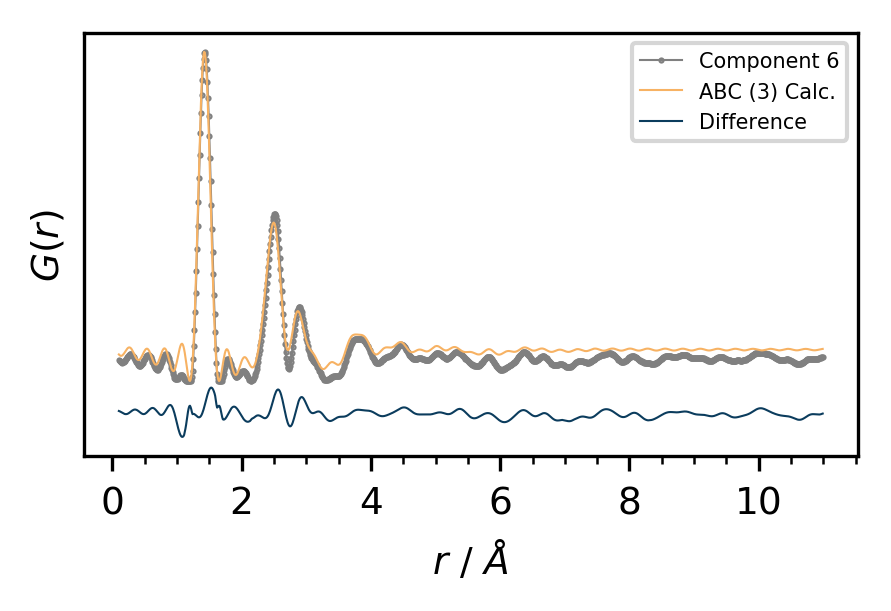

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\PDF\_NMF\\'
os.chdir(path)

NMF_Obs = pd.read_csv('NMF_Components_Obs.csv', header=0, sep=',')
NMF_Calc = pd.read_csv('NMF_Components_Calc.csv', header=0, sep=',')
NMF_Weighting_Overall = pd.read_csv('NMF_Weighting_Overall.csv', header=0, sep=',')
RawData = pd.read_csv('Mail-In_Data.csv', header=0, sep=',')

r = NMF_Obs['r']
o = NMF_Obs['sub1ij_0_NMF']
o1 = (o-o.min())/(o.max()-o.min())
c = NMF_Calc['ABC_Nano2']
c1 = (c-c.min())/(c.max()-c.min())

Rwp =np.sqrt((sum((o1-c1)**2))/(sum(np.square(o1))))
print("Rwp =", Rwp)

f = plt.figure(dpi=300)
f.set_figheight(1.87)
f.set_figwidth(3.33)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])

ax0.plot(r,o1, linewidth=0.5, color='#808080', marker='o', markersize=0.5, label='Component 6')
ax0.plot(r,c1, linewidth=0.5, color='#f7b263', label='ABC (3) Calc.')
ax0.plot(r,o1-c1-0.075, linewidth=0.5, color='#0B3C5D', label='Difference')

ax0.set_yticks(())
ax0.set_xticks((0,2,4,6,8,10))
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)

#ax0.add_artist(AnchoredText("AA", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax0.legend(loc=1, fontsize=5)
f.tight_layout
plt.savefig('20200406_Dan_NMF_6_PDF_COFs.tif')
plt.show()

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\PDF\_NMF\\'
os.chdir(path)

NMF_Obs = pd.read_csv('NMF_Components_Obs.csv', header=0, sep=',')
NMF_Calc = pd.read_csv('NMF_Components_Calc.csv', header=0, sep=',')
NMF_Weighting_Overall = pd.read_csv('NMF_Weighting_Overall.csv', header=0, sep=',')
RawData = pd.read_csv('Mail-In_Data.csv', header=0, sep=',')


for i in NMF_Obs:
    o = NMF_Obs[i]
    o1 = (o-o.min())/(o.max()-o.min())
    for j in NMF_Calc:
        c = NMF_Calc[j]
        c1 = (c-c.min())/(c.max()-c.min())
        Rwp =np.sqrt((sum((o1-c1)**2))/(sum(np.square(o1))))
        print("i =", i, "j =", j, "Rwp =", Rwp)

i = r j = r Rwp = 0.0
i = r j = AA_Bulk1 Rwp = 0.7094790819506127
i = r j = AB_Bulk1 Rwp = 0.815529350552996
i = r j = ABC_Bulk1 Rwp = 0.8540179979975132
i = r j = ABC_Bulk2 Rwp = 0.861235537034307
i = r j = AB_Nano1 Rwp = 0.8013644647346715
i = r j = ABC_Nano2 Rwp = 0.8803660500817512
i = 1_NMF j = r Rwp = 1.0431759069344164
i = 1_NMF j = AA_Bulk1 Rwp = 0.006566253200554865
i = 1_NMF j = AB_Bulk1 Rwp = 0.630861748619347
i = 1_NMF j = ABC_Bulk1 Rwp = 0.5970327913906083
i = 1_NMF j = ABC_Bulk2 Rwp = 0.5899718466898877
i = 1_NMF j = AB_Nano1 Rwp = 0.6307637783294141
i = 1_NMF j = ABC_Nano2 Rwp = 0.7220122579353557
i = 2_NMF j = r Rwp = 1.93987809020014
i = 2_NMF j = AA_Bulk1 Rwp = 1.0152743355358052
i = 2_NMF j = AB_Bulk1 Rwp = 0.04296767943772222
i = 2_NMF j = ABC_Bulk1 Rwp = 0.4352312224410561
i = 2_NMF j = ABC_Bulk2 Rwp = 0.48511804289886395
i = 2_NMF j = AB_Nano1 Rwp = 0.4039910228714553
i = 2_NMF j = ABC_Nano2 Rwp = 0.5033006121685002
i = 3_NMF j = r Rwp = 2.204291812088806
i = 3_NM

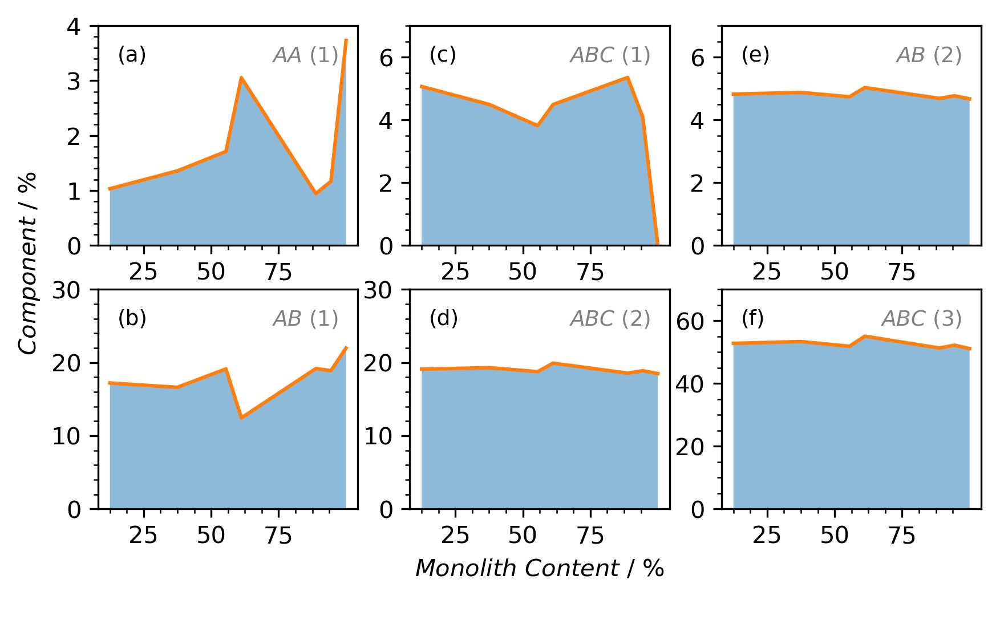

In [126]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\PDF\_NMF\\'
os.chdir(path)

H_ind = [12.5,37.5,55.5,61.2,88.8,94.4,100]

HA=[0.7227*10,	0.6849*10,	0.2882*10,	0.3079*10,	0.3175*10,	0.4268*10,	0.1054*10]
HB=[0.1527*10,	0.1068*10,	0.0601*10,	0.2074*10,	0.1531*10,	0.1106*10,	0.0770*10]
HC=[0.1246*10,	0.2082*10,	0.6516*10,	0.4847*10,	0.5294*10,	0.4626*10,	0.8176*10]

f = plt.figure(dpi=300)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs0[0], hspace=0.2, wspace=0.2)

ax0 = plt.subplot(G00[0:1,0:1])
ax1 = plt.subplot(G00[0:1,1:2])
ax2 = plt.subplot(G00[0:1,2:3])
ax3 = plt.subplot(G00[1:2,0:1])
ax4 = plt.subplot(G00[1:2,1:2])
ax5 = plt.subplot(G00[1:2,2:3])
ax0.stackplot(H_ind, HA, alpha=0.5, labels=('AA (1)'))
ax0.plot(H_ind, HA)
ax1.stackplot(H_ind, HC, alpha=0.5, labels=('ABC (1)'))
ax1.plot(H_ind, HC)
ax2.stackplot(H_ind, HE, alpha=0.5, labels=('AB (2)'))
ax2.plot(H_ind, HE)
ax3.stackplot(H_ind, HB, alpha=0.5, labels=('AB (1)'))
ax3.plot(H_ind, HB)
ax4.stackplot(H_ind, HD, alpha=0.5, labels=('ABC (2)'))
ax4.plot(H_ind, HD)
ax5.stackplot(H_ind, HF, alpha=0.5, labels=('ABC (3)'))
ax5.plot(H_ind, HF)
ax0.minorticks_on()
ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()
ax4.minorticks_on()
ax5.minorticks_on()
ax0.set_ylim(0,4)
ax1.set_ylim(0,7)
ax2.set_ylim(0,7)
ax3.set_ylim(0,30)
ax4.set_ylim(0,30)
ax5.set_ylim(0,70)
ax0.set_xticks((25,50,75))
ax1.set_xticks((25,50,75))
ax2.set_xticks((25,50,75))
ax3.set_xticks((25,50,75))
ax4.set_xticks((25,50,75))
ax5.set_xticks((25,50,75))

ax4.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %')
ax3.set_ylabel(r'                                    $\it{Component}$ / %')

ax0.add_artist(AnchoredText("$\it{AA}$ (1)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText("$\it{ABC}$ (1)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText("$\it{AB}$ (2)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax3.add_artist(AnchoredText("$\it{AB}$ (1)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax4.add_artist(AnchoredText("$\it{ABC}$ (2)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax5.add_artist(AnchoredText("$\it{ABC}$ (3)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(e)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax3.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax4.add_artist(AnchoredText("(d)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax5.add_artist(AnchoredText("(f)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))

plt.savefig('20200406_Dan_COF_Component_Weightings.tif')
plt.show()

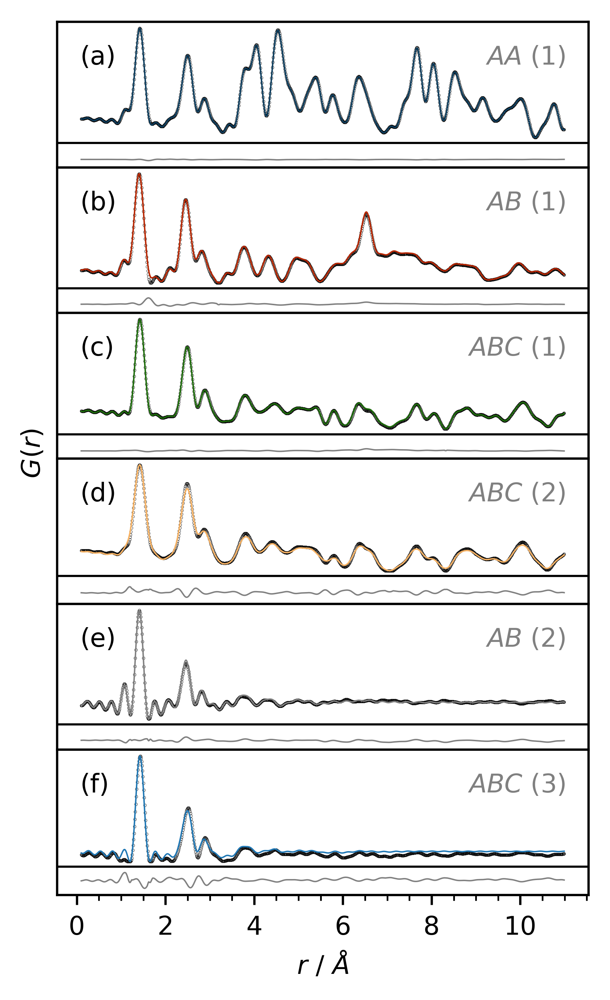

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\201912_11-ID-B_mail-in_TPB-DMTP-COF\_1_analysis\PDF\_NMF\\'
os.chdir(path)

NMF_Obs = pd.read_csv('NMF_Components_Obs.csv', header=0, sep=',')
NMF_Calc = pd.read_csv('NMF_Components_Calc.csv', header=0, sep=',')
NMF_Weighting_Overall = pd.read_csv('NMF_Weighting_Overall.csv', header=0, sep=',')
RawData = pd.read_csv('Mail-In_Data.csv', header=0, sep=',')

r = NMF_Calc['r']
a = NMF_Calc['AA_Bulk1']
b = NMF_Calc['AB_Bulk1']
c = NMF_Calc['ABC_Bulk1']
d = NMF_Calc['ABC_Bulk2']
e = NMF_Calc['AB_Nano1']
f = NMF_Calc['ABC_Nano2']
A1 = (a-a.min())/(a.max()-a.min())
B1 = (b-b.min())/(b.max()-b.min())
C1 = (c-c.min())/(c.max()-c.min())
D1 = (d-d.min())/(d.max()-d.min())
E1 = (e-e.min())/(e.max()-e.min())
F1 = (f-f.min())/(f.max()-f.min())

r = NMF_Obs['r']
a2 = NMF_Obs['1_NMF']
b2 = NMF_Obs['2_NMF']
c2 = NMF_Obs['3_NMF']
d2 = NMF_Obs['ij_2_NMF']
e2 = NMF_Obs['subij_0_NMF']
f2 = NMF_Obs['sub1ij_0_NMF']
A2 = (a2-a2.min())/(a2.max()-a2.min())
B2 = (b2-b2.min())/(b2.max()-b2.min())
C2 = (c2-c2.min())/(c2.max()-c2.min())
D2 = (d2-d2.min())/(d2.max()-d2.min())
E2 = (e2-e2.min())/(e2.max()-e2.min())
F2 = (f2-f2.min())/(f2.max()-f2.min())


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(6, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(r,A2, linewidth=0, marker='o',markersize=0.1, color='k', label='A')
ax0.plot(r,A1, linewidth=0.5, color='#0B3C5D', label='A')
ax0.plot(r,A1-A2-0.2, linewidth=0.5, color='#808080', label='A')
ax0.set_yticks(())
ax0.set_xticks(())
ax1 = plt.subplot(G00[1,0])
ax1.plot(r,B2, linewidth=0, marker='o',markersize=0.1, color='k', label='A')
ax1.plot(r,B1, linewidth=0.5, color='#B82601', label='B')
ax1.plot(r,B1-B2-0.2, linewidth=0.5, color='#808080', label='A')
ax1.set_yticks(())
ax1.set_xticks(())
ax2 = plt.subplot(G00[2,0])
ax2.plot(r,C2, linewidth=0, marker='o',markersize=0.1, color='k', label='A')
ax2.plot(r,C1, linewidth=0.5, color='#1C6B0A', label='C')
ax2.plot(r,C1-C2-0.2, linewidth=0.5, color='#808080', label='A')
ax2.set_yticks(())
ax2.set_xticks(())
ax3 = plt.subplot(G00[3,0])
ax3.plot(r,D2, linewidth=0, marker='o',markersize=0.1, color='k', label='A')
ax3.plot(r,D1, linewidth=0.5, color='#f7b263', label='D')
ax3.plot(r,D1-D2-0.2, linewidth=0.5, color='#808080', label='A')
ax3.set_yticks(())
ax3.set_xticks(())
ax4 = plt.subplot(G00[4,0])
ax4.plot(r,E2, linewidth=0, marker='o',markersize=0.1, color='k', label='A')
ax4.plot(r,E1, linewidth=0.5, color='#808080', label='E')
ax4.plot(r,E1-E2-0.2, linewidth=0.5, color='#808080', label='A')
ax4.set_yticks(())
ax4.set_xticks(())
ax5 = plt.subplot(G00[5,0])
ax5.plot(r,F2, linewidth=0, marker='o',markersize=0.1, color='k', label='A')
ax5.plot(r,F1, linewidth=0.5, color='tab:blue', label='F')
ax5.plot(r,F1-F2-0.2, linewidth=0.5, color='#808080', label='A')
ax5.set_yticks(())
ax5.tick_params(axis='x', labelsize=9)
ax5.minorticks_on()

ax5.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax3.set_ylabel(r'                   $\it{G(r)}$', rotation='vertical', fontsize=9)

ax0.add_artist(AnchoredText("$\it{AA}$ (1)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText("$\it{AB}$ (1)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText("$\it{ABC}$ (1)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax3.add_artist(AnchoredText("$\it{ABC}$ (2)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax4.add_artist(AnchoredText("$\it{AB}$ (2)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax5.add_artist(AnchoredText("$\it{ABC}$ (3)", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax3.add_artist(AnchoredText("(d)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax4.add_artist(AnchoredText("(e)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax5.add_artist(AnchoredText("(f)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))

ax0.axhline(y=-0.05, color='k', linewidth=0.75)
ax1.axhline(y=-0.05, color='k', linewidth=0.75)
ax2.axhline(y=-0.05, color='k', linewidth=0.75)
ax3.axhline(y=-0.05, color='k', linewidth=0.75)
ax4.axhline(y=-0.05, color='k', linewidth=0.75)
ax5.axhline(y=-0.05, color='k', linewidth=0.75)

f.tight_layout
plt.savefig('20200406_Dan_PDF-NMF_Calc_COFs2.tif')
plt.show()

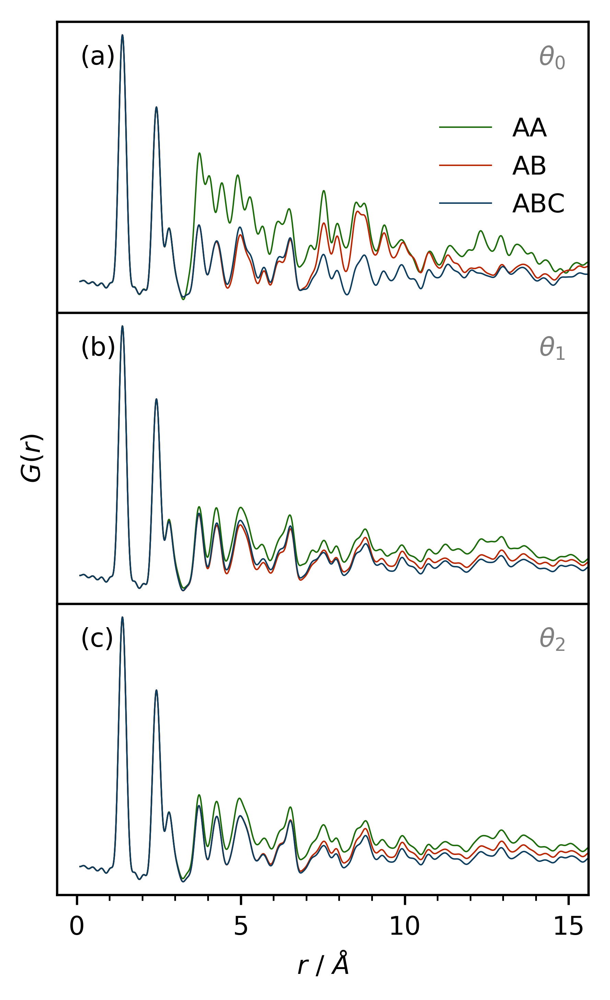

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\Calc CIF\\'
os.chdir(path)

r = np.genfromtxt('AA_theta0_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(0))
AAt0 = np.genfromtxt('AA_theta0_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
AAt1 = np.genfromtxt('AA_theta1_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
AAt2 = np.genfromtxt('AA_theta2_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
ABt0 = np.genfromtxt('AB_theta0_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
ABt1 = np.genfromtxt('AB_theta1_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
ABt2 = np.genfromtxt('AB_theta2_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
ABCt0 = np.genfromtxt('ABC_theta0_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
ABCt1 = np.genfromtxt('ABC_theta1_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))
ABCt2 = np.genfromtxt('ABC_theta2_4Layer.cgr', delimiter=' ', skip_header=int(9), usecols=int(1))

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax0.set_yticks(())
ax0.set_xticks(())
ax1.set_yticks(())
ax1.set_xticks(())
ax2.set_yticks(())
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(r,AAt0,color='#1C6B0A', linewidth=0.5, label='AA')
ax0.plot(r,ABt0,color='#B82601', linewidth=0.5, label='AB')
ax0.plot(r,ABCt0,color='#0B3C5D', linewidth=0.5, label='ABC')

ax1.plot(r,AAt1,color='#1C6B0A', linewidth=0.5)
ax1.plot(r,ABt1,color='#B82601', linewidth=0.5)
ax1.plot(r,ABCt1,color='#0B3C5D', linewidth=0.5)

ax2.plot(r,AAt2,color='#1C6B0A', linewidth=0.5)
ax2.plot(r,ABt2,color='#B82601', linewidth=0.5)
ax2.plot(r,ABCt2,color='#0B3C5D', linewidth=0.5)

ax2.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-0.6,15.6)
ax1.set_xlim(-0.6,15.6)
ax2.set_xlim(-0.6,15.6)
ax0.legend(loc=7, frameon=False, fontsize=9)

ax0.add_artist(AnchoredText(r"$\it{\theta_0}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{\theta_1}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{\theta_2}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))


ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))


f.tight_layout
plt.savefig('20200420_Dan_TurbostraticCOF_Calc.tif')
plt.show()

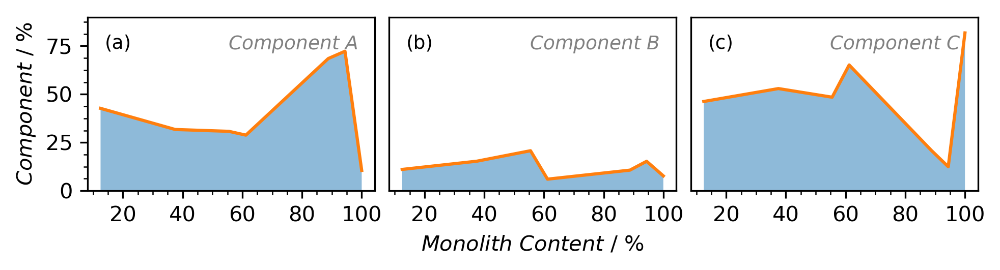

In [214]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\NMF\\'
os.chdir(path)

H_ind = [12.5,37.5,55.5,61.2,88.8,94.4,100]
#HA=[0.7227*100,	0.6849*100,	0.2882*100,	0.3079*100,	0.3175*100,	0.4268*100,	0.1054*100]
#HB=[0.1527*100,	0.1068*100,	0.0601*100,	0.2074*100,	0.1531*100,	0.1106*100,	0.0770*100]
#HC=[0.1246*100,	0.2082*100,	0.6516*100,	0.4847*100,	0.5294*100,	0.4626*100,	0.8176*100]

HA=[42.684,31.747,30.789,28.822,68.494,72.272,10.536]
HB=[11.057,15.315,20.741,6.014,10.682,15.267,7.700]
HC=[46.259,52.938,48.470,65.164,20.823,12.461,81.764]


f = plt.figure(dpi=300)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs0[0], hspace=0.2, wspace=0.05)

ax0 = plt.subplot(G00[0,0:1])
ax1 = plt.subplot(G00[0,1:2])
ax2 = plt.subplot(G00[0,2:3])
ax0.stackplot(H_ind, HA, alpha=0.5, labels=('AA (1)'))
ax0.plot(H_ind, HA)
ax1.stackplot(H_ind, HB, alpha=0.5, labels=('ABC (1)'))
ax1.plot(H_ind, HB)
ax2.stackplot(H_ind, HC, alpha=0.5, labels=('AB (2)'))
ax2.plot(H_ind, HC)

ax0.minorticks_on()
ax1.minorticks_on()
ax2.minorticks_on()

ax0.set_ylim(0,90)
ax1.set_ylim(0,90)
ax1.set_yticks(())
ax2.set_ylim(0,90)
ax2.set_yticks(())

ax0.set_xticks((20,40,60,80,100))
ax1.set_xticks((20,40,60,80,100))
ax2.set_xticks((20,40,60,80,100))


ax1.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %')
ax0.set_ylabel(r'$\it{Component}$ / %')

ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{Component}$ $\it{B}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{Component}$ $\it{C}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))

f.tight_layout()
plt.savefig('20200420_Dan_COF_Component_Weightings.tif')
plt.show()

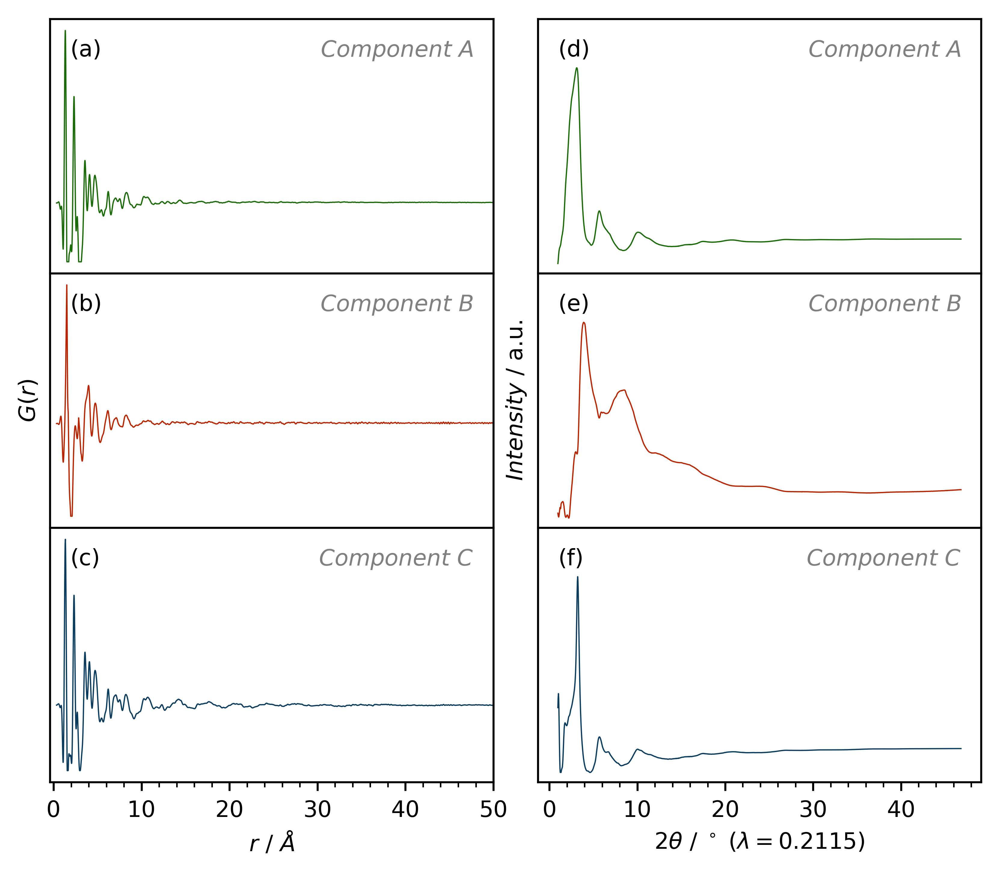

In [102]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\NMF\\'
os.chdir(path)

#PDF
ar = np.genfromtxt('ComponentA.gr', delimiter=' ', usecols=0, skip_header=7)
ag = np.genfromtxt('ComponentA.gr', delimiter=' ', usecols=1, skip_header=7)
br = np.genfromtxt('ComponentB.gr', delimiter=' ', usecols=0, skip_header=7)
bg = np.genfromtxt('ComponentB.gr', delimiter=' ', usecols=1, skip_header=7)
cr = np.genfromtxt('ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
cg = np.genfromtxt('ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)

#XRD

at = np.genfromtxt('ComponentA.xye', delimiter='       ', usecols=0, skip_header=3)
ai = np.genfromtxt('ComponentA.xye', delimiter='       ', usecols=1, skip_header=3)
nai = (ai-ai.min())/(ai.max()-ai.min())
bt = np.genfromtxt('ComponentB.xye', delimiter='       ', usecols=0, skip_header=3)
bi = np.genfromtxt('ComponentB.xye', delimiter='       ', usecols=1, skip_header=3)
nbi = (bi-bi.min())/(bi.max()-bi.min())
ct = np.genfromtxt('ComponentC.xye', delimiter='       ', usecols=0, skip_header=3)
ci = np.genfromtxt('ComponentC.xye', delimiter='       ', usecols=1, skip_header=3)
nci = (ci-ci.min())/(ci.max()-ci.min())

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=3, ncols=2, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])

ax3 = plt.subplot(G00[0,1])
ax4 = plt.subplot(G00[1,1])
ax5 = plt.subplot(G00[2,1])

ax0.set_yticks(())
ax0.set_xticks(())
ax1.set_yticks(())
ax1.set_xticks(())
ax2.set_yticks(())
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax3.set_yticks(())
ax3.set_xticks(())
ax4.set_yticks(())
ax4.set_xticks(())
ax5.set_yticks(())
ax5.tick_params(axis='x', labelsize=9)
ax5.minorticks_on()

ax0.plot(ar,ag,color='#1C6B0A', linewidth=0.5, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(br,bg,color='#B82601', linewidth=0.5, label=r"$\it{Component}$ $\it{B}$")
ax2.plot(cr,cg,color='#0B3C5D', linewidth=0.5, label=r"$\it{Component}$ $\it{C}$")

ax3.plot(at,nai,color='#1C6B0A', linewidth=0.5, label=r"$\it{Component}$ $\it{A}$")
ax4.plot(bt,nbi,color='#B82601', linewidth=0.5, label=r"$\it{Component}$ $\it{B}$")
ax5.plot(ct,nci,color='#0B3C5D', linewidth=0.5, label=r"$\it{Component}$ $\it{C}$")

ax2.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax5.set_xlabel(r'$\it{2\theta}$ / $^\circ$ $(\lambda = 0.2115)$', fontsize=9)
ax4.set_ylabel(r'$\it{Intensity}$ / a.u.', rotation='vertical', fontsize=9)

ax0.set_xlim(-0.4,50)
ax1.set_xlim(-0.4,50)
ax2.set_xlim(-0.4,50)

ax3.set_ylim(-0.05,1.25)
ax4.set_ylim(-0.05,1.25)
ax5.set_ylim(-0.05,1.25)

ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{Component}$ $\it{B}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{Component}$ $\it{C}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax3.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax4.add_artist(AnchoredText(r"$\it{Component}$ $\it{B}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax5.add_artist(AnchoredText(r"$\it{Component}$ $\it{C}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))


ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))

ax3.add_artist(AnchoredText("(d)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax4.add_artist(AnchoredText("(e)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax5.add_artist(AnchoredText("(f)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))


f.tight_layout
plt.savefig('20200420_Dan_COF_Components_NMF.tif')
plt.show()

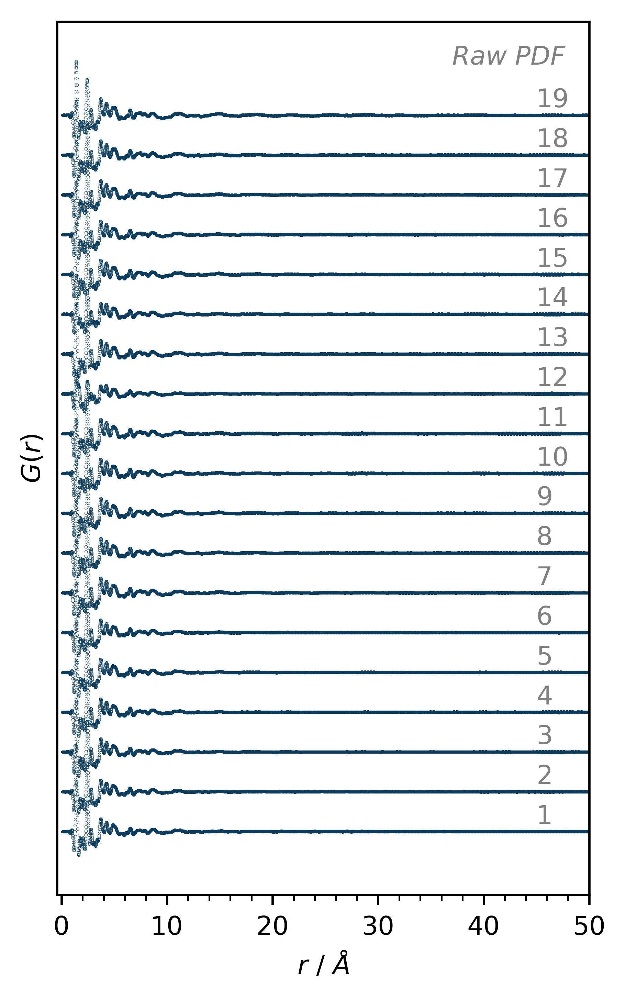

In [131]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\gr\\'
os.chdir(path)

#PDF
r = np.genfromtxt('01.gr', delimiter=' ', usecols=0, skip_header=26)

g01 = np.genfromtxt('01.gr', delimiter=' ', usecols=1, skip_header=26)
g02 = np.genfromtxt('02.gr', delimiter=' ', usecols=1, skip_header=26)
g03 = np.genfromtxt('03.gr', delimiter=' ', usecols=1, skip_header=26)
g04 = np.genfromtxt('04.gr', delimiter=' ', usecols=1, skip_header=26)
g05 = np.genfromtxt('05.gr', delimiter=' ', usecols=1, skip_header=26)
g06 = np.genfromtxt('06.gr', delimiter=' ', usecols=1, skip_header=26)
g07 = np.genfromtxt('07.gr', delimiter=' ', usecols=1, skip_header=26)
g08 = np.genfromtxt('08.gr', delimiter=' ', usecols=1, skip_header=26)
g09 = np.genfromtxt('09.gr', delimiter=' ', usecols=1, skip_header=26)
g10 = np.genfromtxt('10.gr', delimiter=' ', usecols=1, skip_header=26)
g11 = np.genfromtxt('11.gr', delimiter=' ', usecols=1, skip_header=26)
g12 = np.genfromtxt('12.gr', delimiter=' ', usecols=1, skip_header=26)
g13 = np.genfromtxt('13.gr', delimiter=' ', usecols=1, skip_header=26)
g14 = np.genfromtxt('14.gr', delimiter=' ', usecols=1, skip_header=26)
g15 = np.genfromtxt('15.gr', delimiter=' ', usecols=1, skip_header=26)
g16 = np.genfromtxt('16.gr', delimiter=' ', usecols=1, skip_header=26)
g17 = np.genfromtxt('17.gr', delimiter=' ', usecols=1, skip_header=26)
g18 = np.genfromtxt('18.gr', delimiter=' ', usecols=1, skip_header=26)
g19 = np.genfromtxt('19.gr', delimiter=' ', usecols=1, skip_header=26)


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r,g01,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g02+0.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g03+1,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g04+1.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g05+2,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g06+2.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g07+3,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g08+3.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g09+4,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g10+4.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g11+5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g12+5.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g13+6,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g14+6.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g15+7,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g16+7.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g17+8,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g18+8.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g19+9,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-0.4,50)
ax0.add_artist(AnchoredText(r"$\it{Raw}$ $\it{PDF}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(45, 0.1, '1', fontsize=9, color='#808080')
ax0.text(45, 0.6, '2', fontsize=9, color='#808080')
ax0.text(45, 1.1, '3', fontsize=9, color='#808080')
ax0.text(45, 1.6, '4', fontsize=9, color='#808080')
ax0.text(45, 2.1, '5', fontsize=9, color='#808080')
ax0.text(45, 2.6, '6', fontsize=9, color='#808080')
ax0.text(45, 3.1, '7', fontsize=9, color='#808080')
ax0.text(45, 3.6, '8', fontsize=9, color='#808080')
ax0.text(45, 4.1, '9', fontsize=9, color='#808080')
ax0.text(45, 4.6, '10', fontsize=9, color='#808080')
ax0.text(45, 5.1, '11', fontsize=9, color='#808080')
ax0.text(45, 5.6, '12', fontsize=9, color='#808080')
ax0.text(45, 6.1, '13', fontsize=9, color='#808080')
ax0.text(45, 6.6, '14', fontsize=9, color='#808080')
ax0.text(45, 7.1, '15', fontsize=9, color='#808080')
ax0.text(45, 7.6, '16', fontsize=9, color='#808080')
ax0.text(45, 8.1, '17', fontsize=9, color='#808080')
ax0.text(45, 8.6, '18', fontsize=9, color='#808080')
ax0.text(45, 9.1, '19', fontsize=9, color='#808080')

f.tight_layout
#plt.savefig('20200420_Dan_COF_Raw_PDF.tif')
plt.show()

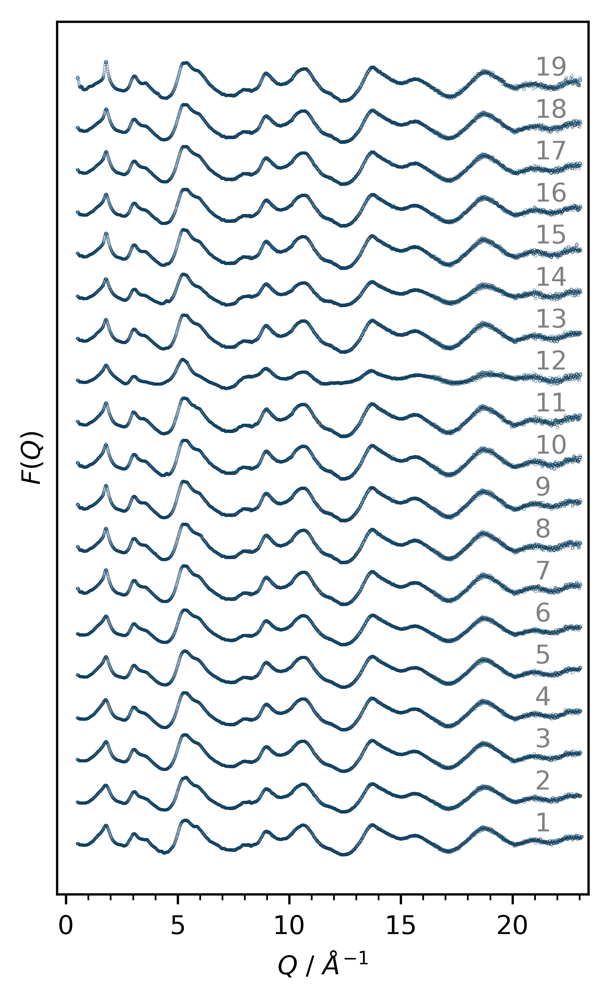

In [141]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\fq\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('01.fq', delimiter=' ', usecols=0, skip_header=26)
g01 = np.genfromtxt('01.fq', delimiter=' ', usecols=1, skip_header=26)
r02 = np.genfromtxt('02.fq', delimiter=' ', usecols=0, skip_header=26)
g02 = np.genfromtxt('02.fq', delimiter=' ', usecols=1, skip_header=26)
r03 = np.genfromtxt('03.fq', delimiter=' ', usecols=0, skip_header=26)
g03 = np.genfromtxt('03.fq', delimiter=' ', usecols=1, skip_header=26)
r04 = np.genfromtxt('04.fq', delimiter=' ', usecols=0, skip_header=26)
g04 = np.genfromtxt('04.fq', delimiter=' ', usecols=1, skip_header=26)
r05 = np.genfromtxt('05.fq', delimiter=' ', usecols=0, skip_header=26)
g05 = np.genfromtxt('05.fq', delimiter=' ', usecols=1, skip_header=26)
r06 = np.genfromtxt('06.fq', delimiter=' ', usecols=0, skip_header=26)
g06 = np.genfromtxt('06.fq', delimiter=' ', usecols=1, skip_header=26)
r07 = np.genfromtxt('07.fq', delimiter=' ', usecols=0, skip_header=26)
g07 = np.genfromtxt('07.fq', delimiter=' ', usecols=1, skip_header=26)
r08 = np.genfromtxt('08.fq', delimiter=' ', usecols=0, skip_header=26)
g08 = np.genfromtxt('08.fq', delimiter=' ', usecols=1, skip_header=26)
r09 = np.genfromtxt('09.fq', delimiter=' ', usecols=0, skip_header=26)
g09 = np.genfromtxt('09.fq', delimiter=' ', usecols=1, skip_header=26)
r10 = np.genfromtxt('10.fq', delimiter=' ', usecols=0, skip_header=26)
g10 = np.genfromtxt('10.fq', delimiter=' ', usecols=1, skip_header=26)
r11 = np.genfromtxt('11.fq', delimiter=' ', usecols=0, skip_header=26)
g11 = np.genfromtxt('11.fq', delimiter=' ', usecols=1, skip_header=26)
r12 = np.genfromtxt('12.fq', delimiter=' ', usecols=0, skip_header=26)
g12 = np.genfromtxt('12.fq', delimiter=' ', usecols=1, skip_header=26)
r13 = np.genfromtxt('13.fq', delimiter=' ', usecols=0, skip_header=26)
g13 = np.genfromtxt('13.fq', delimiter=' ', usecols=1, skip_header=26)
r14 = np.genfromtxt('14.fq', delimiter=' ', usecols=0, skip_header=26)
g14 = np.genfromtxt('14.fq', delimiter=' ', usecols=1, skip_header=26)
r15 = np.genfromtxt('15.fq', delimiter=' ', usecols=0, skip_header=26)
g15 = np.genfromtxt('15.fq', delimiter=' ', usecols=1, skip_header=26)
r16 = np.genfromtxt('16.fq', delimiter=' ', usecols=0, skip_header=26)
g16 = np.genfromtxt('16.fq', delimiter=' ', usecols=1, skip_header=26)
r17 = np.genfromtxt('17.fq', delimiter=' ', usecols=0, skip_header=26)
g17 = np.genfromtxt('17.fq', delimiter=' ', usecols=1, skip_header=26)
r18 = np.genfromtxt('18.fq', delimiter=' ', usecols=0, skip_header=26)
g18 = np.genfromtxt('18.fq', delimiter=' ', usecols=1, skip_header=26)
r19 = np.genfromtxt('19.fq', delimiter=' ', usecols=0, skip_header=26)
g19 = np.genfromtxt('19.fq', delimiter=' ', usecols=1, skip_header=26)



f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r01,g01,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r02,g02+0.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r03,g03+1,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r04,g04+1.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r05,g05+2,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r06,g06+2.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r07,g07+3,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r08,g08+3.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r09,g09+4,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r10,g10+4.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r11,g11+5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r12,g12+5.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r13,g13+6,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r14,g14+6.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r15,g15+7,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r16,g16+7.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r17,g17+8,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r18,g18+8.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r19,g19+9,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{F(Q)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-0.4,23.4)
#ax0.add_artist(AnchoredText(r"$\it{Raw}$ $\it{F(Q)}$", loc=2, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(21, 0.1, '1', fontsize=9, color='#808080')
ax0.text(21, 0.6, '2', fontsize=9, color='#808080')
ax0.text(21, 1.1, '3', fontsize=9, color='#808080')
ax0.text(21, 1.6, '4', fontsize=9, color='#808080')
ax0.text(21, 2.1, '5', fontsize=9, color='#808080')
ax0.text(21, 2.6, '6', fontsize=9, color='#808080')
ax0.text(21, 3.1, '7', fontsize=9, color='#808080')
ax0.text(21, 3.6, '8', fontsize=9, color='#808080')
ax0.text(21, 4.1, '9', fontsize=9, color='#808080')
ax0.text(21, 4.6, '10', fontsize=9, color='#808080')
ax0.text(21, 5.1, '11', fontsize=9, color='#808080')
ax0.text(21, 5.6, '12', fontsize=9, color='#808080')
ax0.text(21, 6.1, '13', fontsize=9, color='#808080')
ax0.text(21, 6.6, '14', fontsize=9, color='#808080')
ax0.text(21, 7.1, '15', fontsize=9, color='#808080')
ax0.text(21, 7.6, '16', fontsize=9, color='#808080')
ax0.text(21, 8.1, '17', fontsize=9, color='#808080')
ax0.text(21, 8.6, '18', fontsize=9, color='#808080')
ax0.text(21, 9.1, '19', fontsize=9, color='#808080')

f.tight_layout
plt.savefig('20200420_Dan_COF_Raw_F(Q).tif')
plt.show()

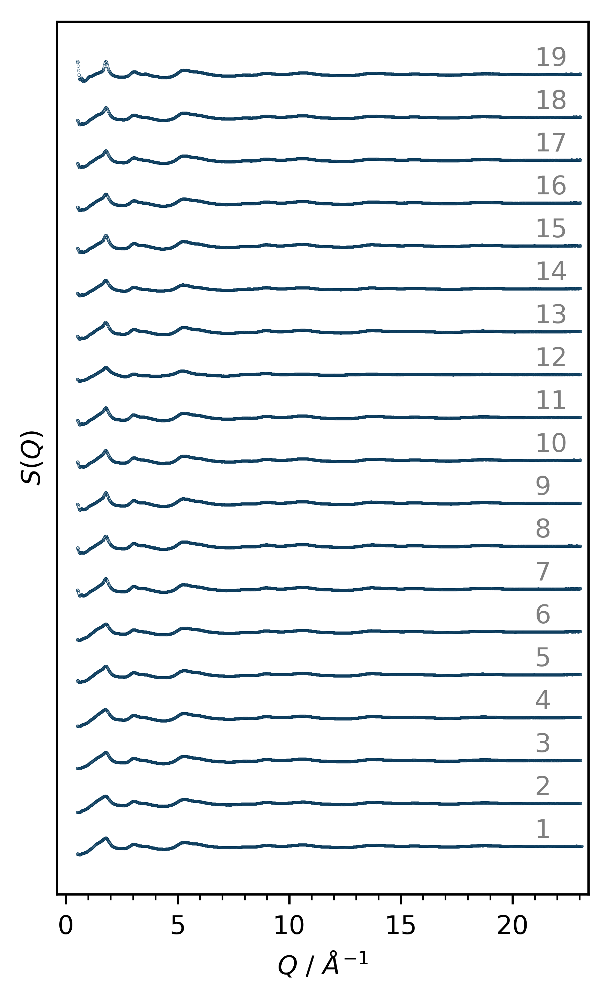

In [145]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\sq\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('01.sq', delimiter=' ', usecols=0, skip_header=26)
g01 = np.genfromtxt('01.sq', delimiter=' ', usecols=1, skip_header=26)
r02 = np.genfromtxt('02.sq', delimiter=' ', usecols=0, skip_header=26)
g02 = np.genfromtxt('02.sq', delimiter=' ', usecols=1, skip_header=26)
r03 = np.genfromtxt('03.sq', delimiter=' ', usecols=0, skip_header=26)
g03 = np.genfromtxt('03.sq', delimiter=' ', usecols=1, skip_header=26)
r04 = np.genfromtxt('04.sq', delimiter=' ', usecols=0, skip_header=26)
g04 = np.genfromtxt('04.sq', delimiter=' ', usecols=1, skip_header=26)
r05 = np.genfromtxt('05.sq', delimiter=' ', usecols=0, skip_header=26)
g05 = np.genfromtxt('05.sq', delimiter=' ', usecols=1, skip_header=26)
r06 = np.genfromtxt('06.sq', delimiter=' ', usecols=0, skip_header=26)
g06 = np.genfromtxt('06.sq', delimiter=' ', usecols=1, skip_header=26)
r07 = np.genfromtxt('07.sq', delimiter=' ', usecols=0, skip_header=26)
g07 = np.genfromtxt('07.sq', delimiter=' ', usecols=1, skip_header=26)
r08 = np.genfromtxt('08.sq', delimiter=' ', usecols=0, skip_header=26)
g08 = np.genfromtxt('08.sq', delimiter=' ', usecols=1, skip_header=26)
r09 = np.genfromtxt('09.sq', delimiter=' ', usecols=0, skip_header=26)
g09 = np.genfromtxt('09.sq', delimiter=' ', usecols=1, skip_header=26)
r10 = np.genfromtxt('10.sq', delimiter=' ', usecols=0, skip_header=26)
g10 = np.genfromtxt('10.sq', delimiter=' ', usecols=1, skip_header=26)
r11 = np.genfromtxt('11.sq', delimiter=' ', usecols=0, skip_header=26)
g11 = np.genfromtxt('11.sq', delimiter=' ', usecols=1, skip_header=26)
r12 = np.genfromtxt('12.sq', delimiter=' ', usecols=0, skip_header=26)
g12 = np.genfromtxt('12.sq', delimiter=' ', usecols=1, skip_header=26)
r13 = np.genfromtxt('13.sq', delimiter=' ', usecols=0, skip_header=26)
g13 = np.genfromtxt('13.sq', delimiter=' ', usecols=1, skip_header=26)
r14 = np.genfromtxt('14.sq', delimiter=' ', usecols=0, skip_header=26)
g14 = np.genfromtxt('14.sq', delimiter=' ', usecols=1, skip_header=26)
r15 = np.genfromtxt('15.sq', delimiter=' ', usecols=0, skip_header=26)
g15 = np.genfromtxt('15.sq', delimiter=' ', usecols=1, skip_header=26)
r16 = np.genfromtxt('16.sq', delimiter=' ', usecols=0, skip_header=26)
g16 = np.genfromtxt('16.sq', delimiter=' ', usecols=1, skip_header=26)
r17 = np.genfromtxt('17.sq', delimiter=' ', usecols=0, skip_header=26)
g17 = np.genfromtxt('17.sq', delimiter=' ', usecols=1, skip_header=26)
r18 = np.genfromtxt('18.sq', delimiter=' ', usecols=0, skip_header=26)
g18 = np.genfromtxt('18.sq', delimiter=' ', usecols=1, skip_header=26)
r19 = np.genfromtxt('19.sq', delimiter=' ', usecols=0, skip_header=26)
g19 = np.genfromtxt('19.sq', delimiter=' ', usecols=1, skip_header=26)


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r01,g01,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r02,g02+0.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r03,g03+1,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r04,g04+1.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r05,g05+2,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r06,g06+2.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r07,g07+3,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r08,g08+3.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r09,g09+4,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r10,g10+4.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r11,g11+5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r12,g12+5.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r13,g13+6,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r14,g14+6.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r15,g15+7,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r16,g16+7.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r17,g17+8,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r18,g18+8.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r19,g19+9,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{S(Q)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-0.4,23.4)
#ax0.add_artist(AnchoredText(r"$\it{Raw}$ $\it{F(Q)}$", loc=2, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(21, 1.1, '1', fontsize=9, color='#808080')
ax0.text(21, 1.6, '2', fontsize=9, color='#808080')
ax0.text(21, 2.1, '3', fontsize=9, color='#808080')
ax0.text(21, 2.6, '4', fontsize=9, color='#808080')
ax0.text(21, 3.1, '5', fontsize=9, color='#808080')
ax0.text(21, 3.6, '6', fontsize=9, color='#808080')
ax0.text(21, 4.1, '7', fontsize=9, color='#808080')
ax0.text(21, 4.6, '8', fontsize=9, color='#808080')
ax0.text(21, 5.1, '9', fontsize=9, color='#808080')
ax0.text(21, 5.6, '10', fontsize=9, color='#808080')
ax0.text(21, 6.1, '11', fontsize=9, color='#808080')
ax0.text(21, 6.6, '12', fontsize=9, color='#808080')
ax0.text(21, 7.1, '13', fontsize=9, color='#808080')
ax0.text(21, 7.6, '14', fontsize=9, color='#808080')
ax0.text(21, 8.1, '15', fontsize=9, color='#808080')
ax0.text(21, 8.6, '16', fontsize=9, color='#808080')
ax0.text(21, 9.1, '17', fontsize=9, color='#808080')
ax0.text(21, 9.6, '18', fontsize=9, color='#808080')
ax0.text(21, 10.1, '19', fontsize=9, color='#808080')

f.tight_layout
plt.savefig('20200420_Dan_COF_Raw_S(Q).tif')
plt.show()

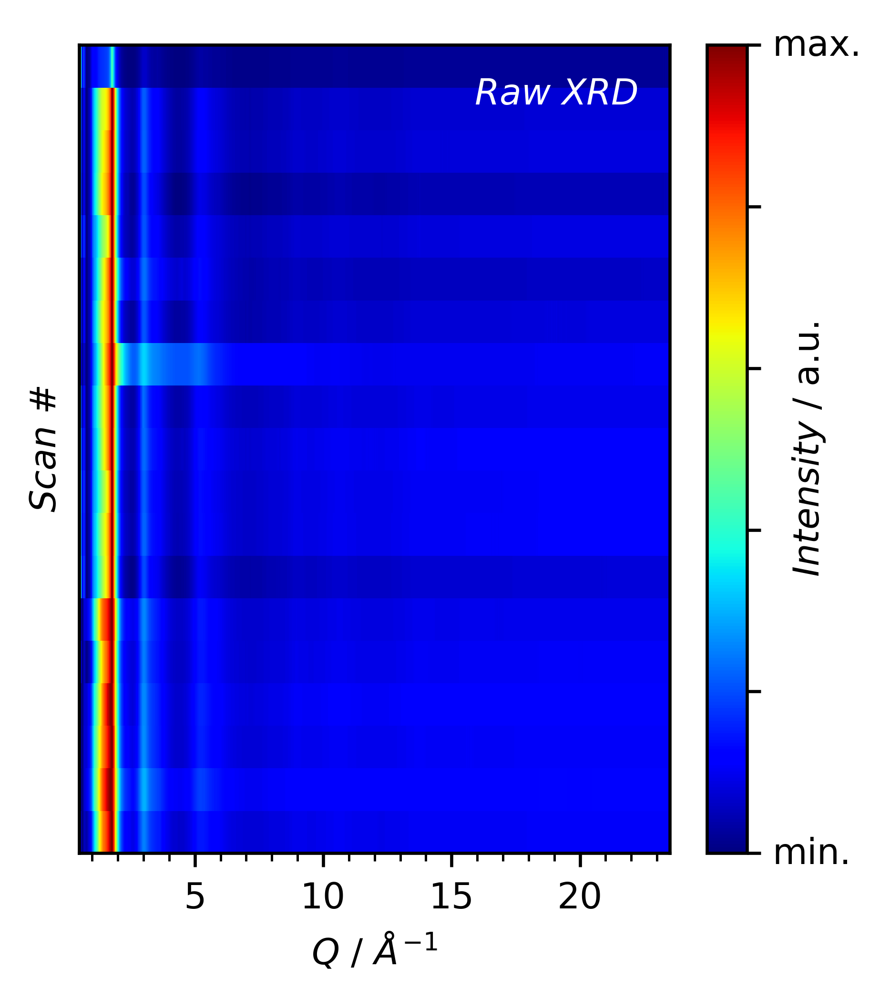

In [246]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.offsetbox import AnchoredText
import matplotlib.gridspec as gridspec
import pandas as pd
import os, sys, glob

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\iq\\'
os.chdir(path)

##############################
# Raw PDF and XRD ImagePlots #
##############################

XRD_files = glob.glob(path + "/*.iq")
Q = np.genfromtxt('01.iq', usecols=0, delimiter=' ', skip_header=int(26))
list0 = []
for filename in XRD_files:
    df = np.genfromtxt(filename, usecols=1, delimiter=' ', skip_header=int(26))
    list0.append(df)
XRD = pd.DataFrame(np.array(list0).T, index=['R{}'.format(i) for i in range(len(Q))])
nXRD = (XRD-XRD.min())/(XRD.max()-XRD.min())

Y = np.arange(0.5,20.5,1)


f = plt.figure(dpi=600)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1,1, figure=f, hspace=0.5)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 

ax1 = plt.subplot(G00[0,0])
d=ax1.pcolor(Q, Y, nXRD.T, cmap='jet')#, vmax=1)
cbar1 = plt.colorbar(d, ax=ax1, aspect=20, spacing='proportional', format='')
cbar1.set_label('$\it{Intensity}$ / a.u.', fontsize=9)
ax1.set_xlim(0.5,23.5)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.set_yticks(())
ax1.set_ylabel(r'$\it{Scan}$ #', fontsize=9)
ax1.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.add_artist(AnchoredText(r"$\it{Raw}$ $\it{XRD}$", loc=1, frameon=False, prop=dict(color='#ffffff', fontsize=9)))
ax1.text(27.5,0.25,'min.', fontsize=9)
ax1.text(27.5,19.25,'max.', fontsize=9)

f.tight_layout()
plt.savefig('20200420_Dan_COF_Raw_I(Q).tif')
plt.show()

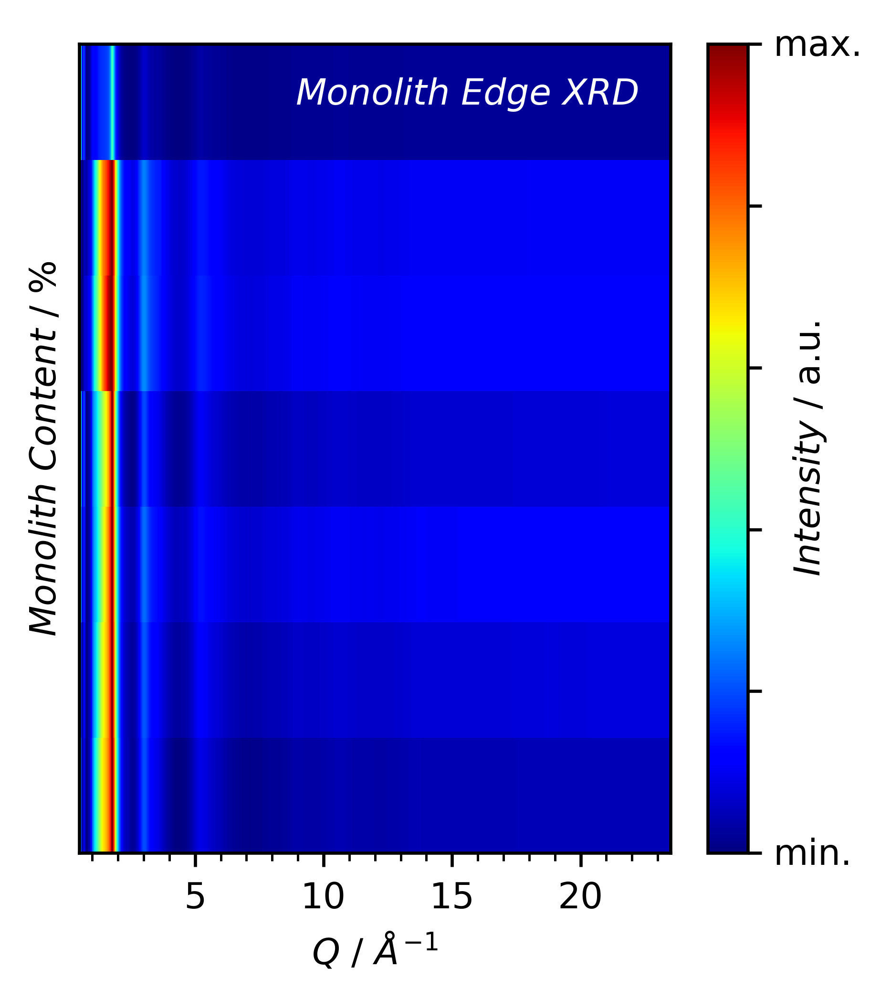

In [241]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.offsetbox import AnchoredText
import matplotlib.gridspec as gridspec
import pandas as pd
import os, sys, glob

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\iq\map1\\'
os.chdir(path)

##############################
# Raw PDF and XRD ImagePlots #
##############################

XRD_files = glob.glob(path + "/*.iq")
Q = np.genfromtxt('a_13.iq', usecols=0, delimiter=' ', skip_header=int(26))
list0 = []
for filename in XRD_files:
    df = np.genfromtxt(filename, usecols=1, delimiter=' ', skip_header=int(26))
    list0.append(df)
XRD = pd.DataFrame(np.array(list0).T, index=['R{}'.format(i) for i in range(len(Q))])
nXRD = (XRD-XRD.min())/(XRD.max()-XRD.min())

Y = np.arange(0.5,8.5,1)


f = plt.figure(dpi=600)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1,1, figure=f, hspace=0.5)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 

ax1 = plt.subplot(G00[0,0])
d=ax1.pcolor(Q, Y, nXRD.T, cmap='jet')#, vmax=1)
cbar1 = plt.colorbar(d, ax=ax1, aspect=20, spacing='proportional', format='')
cbar1.set_label('$\it{Intensity}$ / a.u.', fontsize=9)
ax1.set_xlim(0.5,23.5)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.set_yticks(())
ax1.set_ylabel(r'$\it{Monolith}$ ${Content}$ / %', fontsize=9)
ax1.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Edge}$ $\it{XRD}$", loc=1, frameon=False, prop=dict(color='#ffffff', fontsize=9)))
ax1.text(27.5,0.4,'min.', fontsize=9)
ax1.text(27.5,7.4,'max.', fontsize=9)

f.tight_layout()
plt.savefig('20200420_Dan_COF_Raw_I(Q)_Map1.tif')
plt.show()

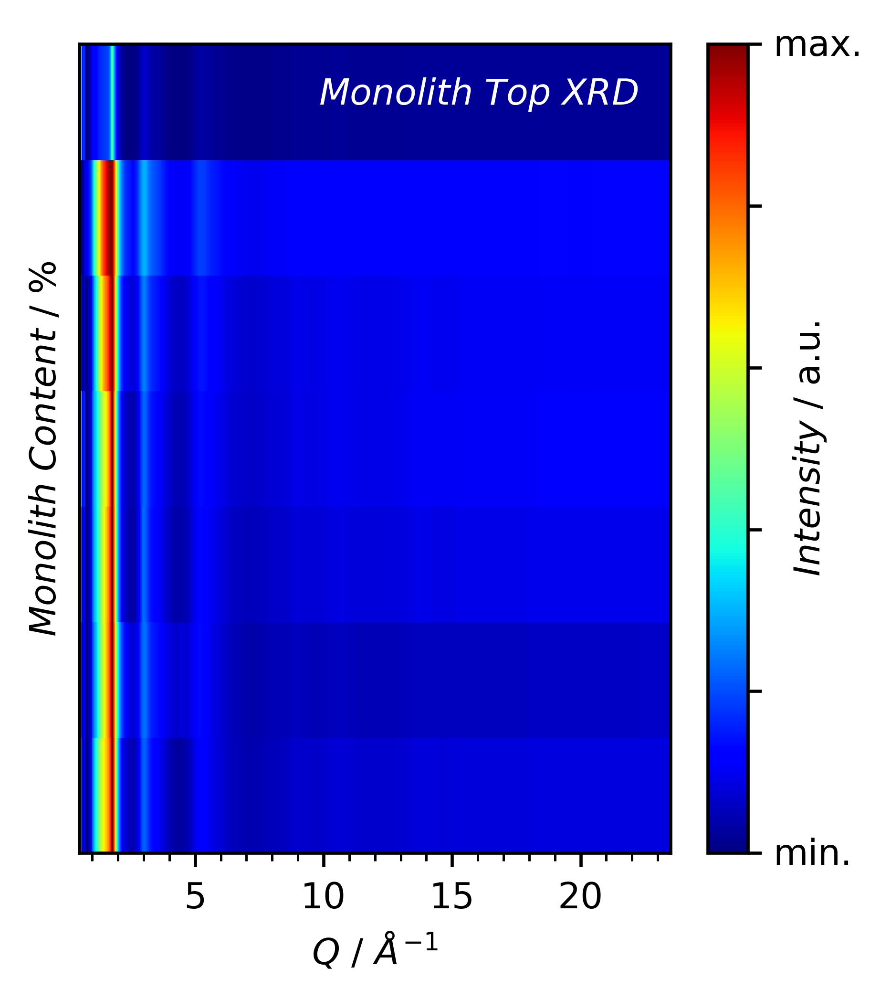

In [250]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.offsetbox import AnchoredText
import matplotlib.gridspec as gridspec
import pandas as pd
import os, sys, glob

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\iq\map2\\'
os.chdir(path)

##############################
# Raw PDF and XRD ImagePlots #
##############################

XRD_files = glob.glob(path + "/*.iq")
Q = np.genfromtxt('a_13.iq', usecols=0, delimiter=' ', skip_header=int(26))
list0 = []
for filename in XRD_files:
    df = np.genfromtxt(filename, usecols=1, delimiter=' ', skip_header=int(26))
    list0.append(df)
XRD = pd.DataFrame(np.array(list0).T, index=['R{}'.format(i) for i in range(len(Q))])
nXRD = (XRD-XRD.min())/(XRD.max()-XRD.min())

Y = np.arange(0.5,8.5,1)


f = plt.figure(dpi=600)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1,1, figure=f, hspace=0.5)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 

ax1 = plt.subplot(G00[0,0])
d=ax1.pcolor(Q, Y, nXRD.T, cmap='jet')#, vmax=1)
cbar1 = plt.colorbar(d, ax=ax1, aspect=20, spacing='proportional', format='')
cbar1.set_label('$\it{Intensity}$ / a.u.', fontsize=9)
ax1.set_xlim(0.5,23.5)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.set_yticks(())
ax1.set_ylabel(r'$\it{Monolith}$ ${Content}$ / %', fontsize=9)
ax1.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Top}$ $\it{XRD}$", loc=1, frameon=False, prop=dict(color='#ffffff', fontsize=9)))
ax1.text(27.5,0.4,'min.', fontsize=9)
ax1.text(27.5,7.4,'max.', fontsize=9)

f.tight_layout()
plt.savefig('20200420_Dan_COF_Raw_I(Q)_Map2.tif')
plt.show()

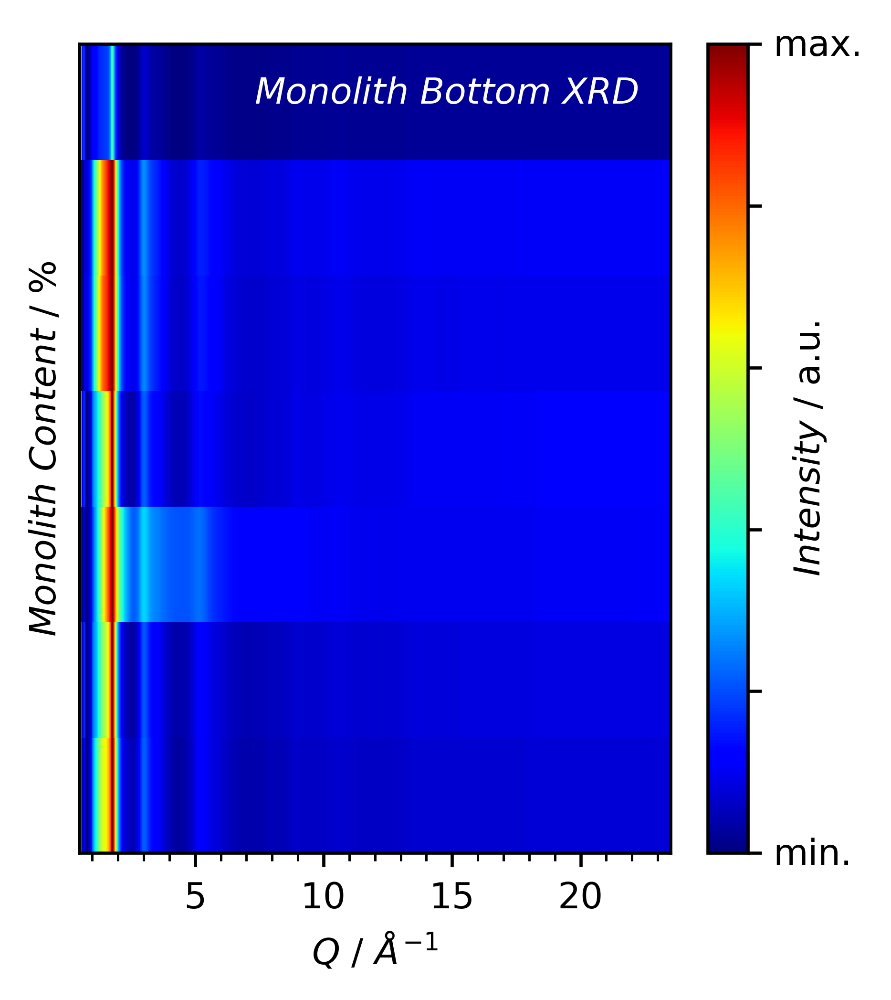

In [254]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.offsetbox import AnchoredText
import matplotlib.gridspec as gridspec
import pandas as pd
import os, sys, glob

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\iq\map3\\'
os.chdir(path)

##############################
# Raw PDF and XRD ImagePlots #
##############################

XRD_files = glob.glob(path + "/*.iq")
Q = np.genfromtxt('a_13.iq', usecols=0, delimiter=' ', skip_header=int(26))
list0 = []
for filename in XRD_files:
    df = np.genfromtxt(filename, usecols=1, delimiter=' ', skip_header=int(26))
    list0.append(df)
XRD = pd.DataFrame(np.array(list0).T, index=['R{}'.format(i) for i in range(len(Q))])
nXRD = (XRD-XRD.min())/(XRD.max()-XRD.min())

Y = np.arange(0.5,8.5,1)


f = plt.figure(dpi=600)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1,1, figure=f, hspace=0.5)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0.2) 

ax1 = plt.subplot(G00[0,0])
d=ax1.pcolor(Q, Y, nXRD.T, cmap='jet')#, vmax=1)
cbar1 = plt.colorbar(d, ax=ax1, aspect=20, spacing='proportional', format='')
cbar1.set_label('$\it{Intensity}$ / a.u.', fontsize=9)
ax1.set_xlim(0.5,23.5)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.set_yticks(())
ax1.set_ylabel(r'$\it{Monolith}$ ${Content}$ / %', fontsize=9)
ax1.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.tick_params(axis='x', labelsize=9)
ax1.tick_params(axis='y', labelsize=9)
ax1.minorticks_on()
ax1.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Bottom}$ $\it{XRD}$", loc=1, frameon=False, prop=dict(color='#ffffff', fontsize=9)))
ax1.text(27.5,0.4,'min.', fontsize=9)
ax1.text(27.5,7.4,'max.', fontsize=9)

f.tight_layout()
plt.savefig('20200420_Dan_COF_Raw_I(Q)_Map3.tif')
plt.show()

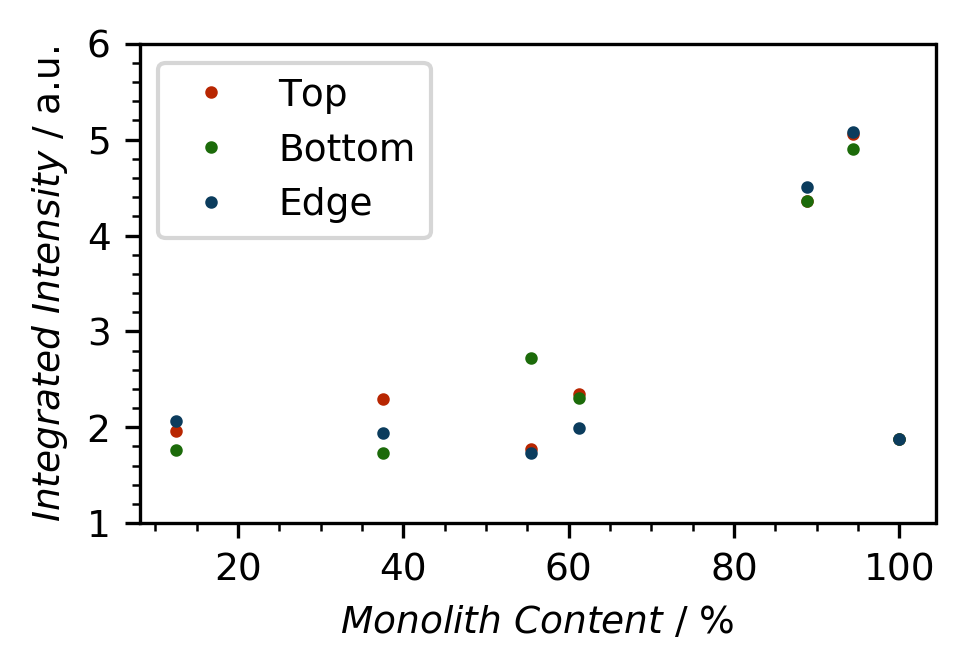

In [143]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\iq\\'
os.chdir(path)

H_ind = [12.5,37.5,55.5,61.2,88.8,94.4,100]

HA=[2.064833401,1.936087604,1.729359875,1.990634723,4.511176806,5.081636465,1.877473716] #edge
HB=[1.958118045,2.299983407,1.776649713,2.347054927,4.359369240,5.058515759,1.877473716] #top
HC=[1.768269214,1.735721400,2.725600550,2.304897499,4.358135115,4.899826015,1.877473716] #bottom


f = plt.figure(dpi=300)
f.set_figheight(1.87*1.25)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0)

ax0 = plt.subplot(G00[0,0])

ax0.plot(H_ind, HB, color='#B82601', marker='o', markersize=2, alpha=1, linewidth=0, label='Top')
ax0.plot(H_ind, HC, color='#1C6B0A', marker='o', markersize=2, alpha=1, linewidth=0, label='Bottom')
ax0.plot(H_ind, HA, color='#0B3C5D', marker='o', markersize=2, alpha=1, linewidth=0, label='Edge')
ax0.legend(loc=2, fontsize=9, frameon=True)
ax0.ticklabel_format(style='plain')
ax0.minorticks_on()
ax0.set_ylim(1,6)
ax0.set_xticks((20,40,60,80,100))
ax0.tick_params(axis='x', labelsize=9)
ax0.tick_params(axis='y', labelsize=9)

ax0.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %', fontsize=9)
ax0.set_ylabel(r'$\it{Integrated}$ ${Intensity}$ / a.u.', fontsize=9)

#ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

f.tight_layout()
plt.savefig('20200420_Dan_COF_XRD_IntegratedIntensities.tif')
plt.show()

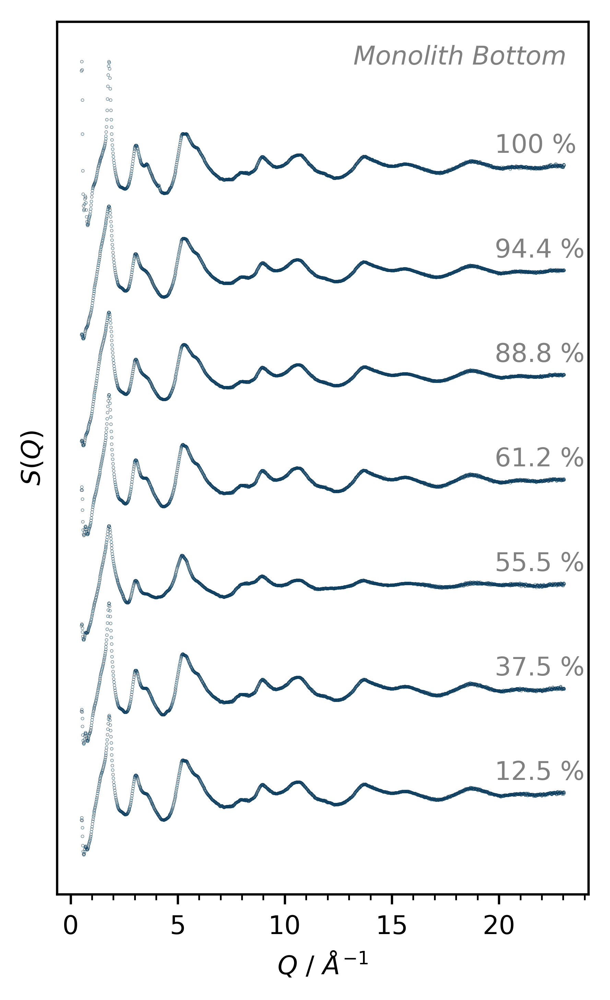

In [303]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\sq\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('01.sq', delimiter=' ', usecols=0, skip_header=26)
g01 = np.genfromtxt('01.sq', delimiter=' ', usecols=1, skip_header=26)
r02 = np.genfromtxt('02.sq', delimiter=' ', usecols=0, skip_header=26)
g02 = np.genfromtxt('02.sq', delimiter=' ', usecols=1, skip_header=26)
r03 = np.genfromtxt('03.sq', delimiter=' ', usecols=0, skip_header=26)
g03 = np.genfromtxt('03.sq', delimiter=' ', usecols=1, skip_header=26)
r04 = np.genfromtxt('04.sq', delimiter=' ', usecols=0, skip_header=26)
g04 = np.genfromtxt('04.sq', delimiter=' ', usecols=1, skip_header=26)
r05 = np.genfromtxt('05.sq', delimiter=' ', usecols=0, skip_header=26)
g05 = np.genfromtxt('05.sq', delimiter=' ', usecols=1, skip_header=26)
r06 = np.genfromtxt('06.sq', delimiter=' ', usecols=0, skip_header=26)
g06 = np.genfromtxt('06.sq', delimiter=' ', usecols=1, skip_header=26)
r07 = np.genfromtxt('07.sq', delimiter=' ', usecols=0, skip_header=26)
g07 = np.genfromtxt('07.sq', delimiter=' ', usecols=1, skip_header=26)
r08 = np.genfromtxt('08.sq', delimiter=' ', usecols=0, skip_header=26)
g08 = np.genfromtxt('08.sq', delimiter=' ', usecols=1, skip_header=26)
r09 = np.genfromtxt('09.sq', delimiter=' ', usecols=0, skip_header=26)
g09 = np.genfromtxt('09.sq', delimiter=' ', usecols=1, skip_header=26)
r10 = np.genfromtxt('10.sq', delimiter=' ', usecols=0, skip_header=26)
g10 = np.genfromtxt('10.sq', delimiter=' ', usecols=1, skip_header=26)
r11 = np.genfromtxt('11.sq', delimiter=' ', usecols=0, skip_header=26)
g11 = np.genfromtxt('11.sq', delimiter=' ', usecols=1, skip_header=26)
r12 = np.genfromtxt('12.sq', delimiter=' ', usecols=0, skip_header=26)
g12 = np.genfromtxt('12.sq', delimiter=' ', usecols=1, skip_header=26)
r13 = np.genfromtxt('13.sq', delimiter=' ', usecols=0, skip_header=26)
g13 = np.genfromtxt('13.sq', delimiter=' ', usecols=1, skip_header=26)
r14 = np.genfromtxt('14.sq', delimiter=' ', usecols=0, skip_header=26)
g14 = np.genfromtxt('14.sq', delimiter=' ', usecols=1, skip_header=26)
r15 = np.genfromtxt('15.sq', delimiter=' ', usecols=0, skip_header=26)
g15 = np.genfromtxt('15.sq', delimiter=' ', usecols=1, skip_header=26)
r16 = np.genfromtxt('16.sq', delimiter=' ', usecols=0, skip_header=26)
g16 = np.genfromtxt('16.sq', delimiter=' ', usecols=1, skip_header=26)
r17 = np.genfromtxt('17.sq', delimiter=' ', usecols=0, skip_header=26)
g17 = np.genfromtxt('17.sq', delimiter=' ', usecols=1, skip_header=26)
r18 = np.genfromtxt('18.sq', delimiter=' ', usecols=0, skip_header=26)
g18 = np.genfromtxt('18.sq', delimiter=' ', usecols=1, skip_header=26)
r19 = np.genfromtxt('19.sq', delimiter=' ', usecols=0, skip_header=26)
g19 = np.genfromtxt('19.sq', delimiter=' ', usecols=1, skip_header=26)


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3.16)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r03,g03+0.75,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#94
ax0.plot(r06,g06+0.60,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#89
ax0.plot(r09,g09+0.45,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#61
ax0.plot(r12,g12+0.30,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#56
ax0.plot(r15,g15+0.15,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#38
ax0.plot(r18,g18,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#13
ax0.plot(r19,g19+0.90,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#100

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{S(Q)}$', rotation='vertical', fontsize=9)
#ax0.set_xlim(-0.4,23.4)
ax0.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Bottom}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(19.8, 1.02, r'12.5 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.17, r'37.5 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.32, r'55.5 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.47, r'61.2 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.62, r'88.8 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.77, r'94.4 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.92, r'100 %', fontsize=9, color='#808080')

f.tight_layout
#plt.savefig('20200420_Dan_COF_S(Q)_Bottom.tif')
plt.show()

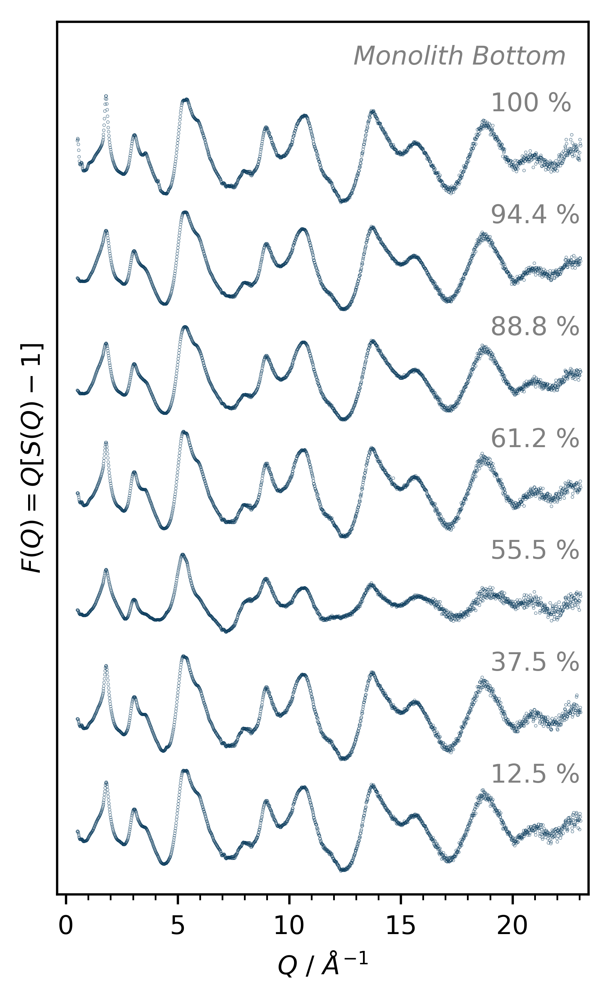

In [321]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\fq\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('01.fq', delimiter=' ', usecols=0, skip_header=26)
g01 = np.genfromtxt('01.fq', delimiter=' ', usecols=1, skip_header=26)
r02 = np.genfromtxt('02.fq', delimiter=' ', usecols=0, skip_header=26)
g02 = np.genfromtxt('02.fq', delimiter=' ', usecols=1, skip_header=26)
r03 = np.genfromtxt('03.fq', delimiter=' ', usecols=0, skip_header=26)
g03 = np.genfromtxt('03.fq', delimiter=' ', usecols=1, skip_header=26)
r04 = np.genfromtxt('04.fq', delimiter=' ', usecols=0, skip_header=26)
g04 = np.genfromtxt('04.fq', delimiter=' ', usecols=1, skip_header=26)
r05 = np.genfromtxt('05.fq', delimiter=' ', usecols=0, skip_header=26)
g05 = np.genfromtxt('05.fq', delimiter=' ', usecols=1, skip_header=26)
r06 = np.genfromtxt('06.fq', delimiter=' ', usecols=0, skip_header=26)
g06 = np.genfromtxt('06.fq', delimiter=' ', usecols=1, skip_header=26)
r07 = np.genfromtxt('07.fq', delimiter=' ', usecols=0, skip_header=26)
g07 = np.genfromtxt('07.fq', delimiter=' ', usecols=1, skip_header=26)
r08 = np.genfromtxt('08.fq', delimiter=' ', usecols=0, skip_header=26)
g08 = np.genfromtxt('08.fq', delimiter=' ', usecols=1, skip_header=26)
r09 = np.genfromtxt('09.fq', delimiter=' ', usecols=0, skip_header=26)
g09 = np.genfromtxt('09.fq', delimiter=' ', usecols=1, skip_header=26)
r10 = np.genfromtxt('10.fq', delimiter=' ', usecols=0, skip_header=26)
g10 = np.genfromtxt('10.fq', delimiter=' ', usecols=1, skip_header=26)
r11 = np.genfromtxt('11.fq', delimiter=' ', usecols=0, skip_header=26)
g11 = np.genfromtxt('11.fq', delimiter=' ', usecols=1, skip_header=26)
r12 = np.genfromtxt('12.fq', delimiter=' ', usecols=0, skip_header=26)
g12 = np.genfromtxt('12.fq', delimiter=' ', usecols=1, skip_header=26)
r13 = np.genfromtxt('13.fq', delimiter=' ', usecols=0, skip_header=26)
g13 = np.genfromtxt('13.fq', delimiter=' ', usecols=1, skip_header=26)
r14 = np.genfromtxt('14.fq', delimiter=' ', usecols=0, skip_header=26)
g14 = np.genfromtxt('14.fq', delimiter=' ', usecols=1, skip_header=26)
r15 = np.genfromtxt('15.fq', delimiter=' ', usecols=0, skip_header=26)
g15 = np.genfromtxt('15.fq', delimiter=' ', usecols=1, skip_header=26)
r16 = np.genfromtxt('16.fq', delimiter=' ', usecols=0, skip_header=26)
g16 = np.genfromtxt('16.fq', delimiter=' ', usecols=1, skip_header=26)
r17 = np.genfromtxt('17.fq', delimiter=' ', usecols=0, skip_header=26)
g17 = np.genfromtxt('17.fq', delimiter=' ', usecols=1, skip_header=26)
r18 = np.genfromtxt('18.fq', delimiter=' ', usecols=0, skip_header=26)
g18 = np.genfromtxt('18.fq', delimiter=' ', usecols=1, skip_header=26)
r19 = np.genfromtxt('19.fq', delimiter=' ', usecols=0, skip_header=26)
g19 = np.genfromtxt('19.fq', delimiter=' ', usecols=1, skip_header=26)



f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r03,g03+2.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r06,g06+2.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r09,g09+1.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r12,g12+1.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r15,g15+0.5,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r18,g18,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r19,g19+3,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{F(Q)=Q[S(Q)-1]}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-0.4,23.4)
ax0.set_ylim(-0.3,3.6)
ax0.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Bottom}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(19, 0.2, '12.5 %', fontsize=9, color='#808080')
ax0.text(19, 0.7, '37.5 %', fontsize=9, color='#808080')
ax0.text(19, 1.2, '55.5 %', fontsize=9, color='#808080')
ax0.text(19, 1.7, '61.2 %', fontsize=9, color='#808080')
ax0.text(19, 2.2, '88.8 %', fontsize=9, color='#808080')
ax0.text(19, 2.7, '94.4 %', fontsize=9, color='#808080')
ax0.text(19, 3.2, '100 %', fontsize=9, color='#808080')

f.tight_layout
plt.savefig('20200420_Dan_COF_F(Q)_Bottom.tif')
plt.show()

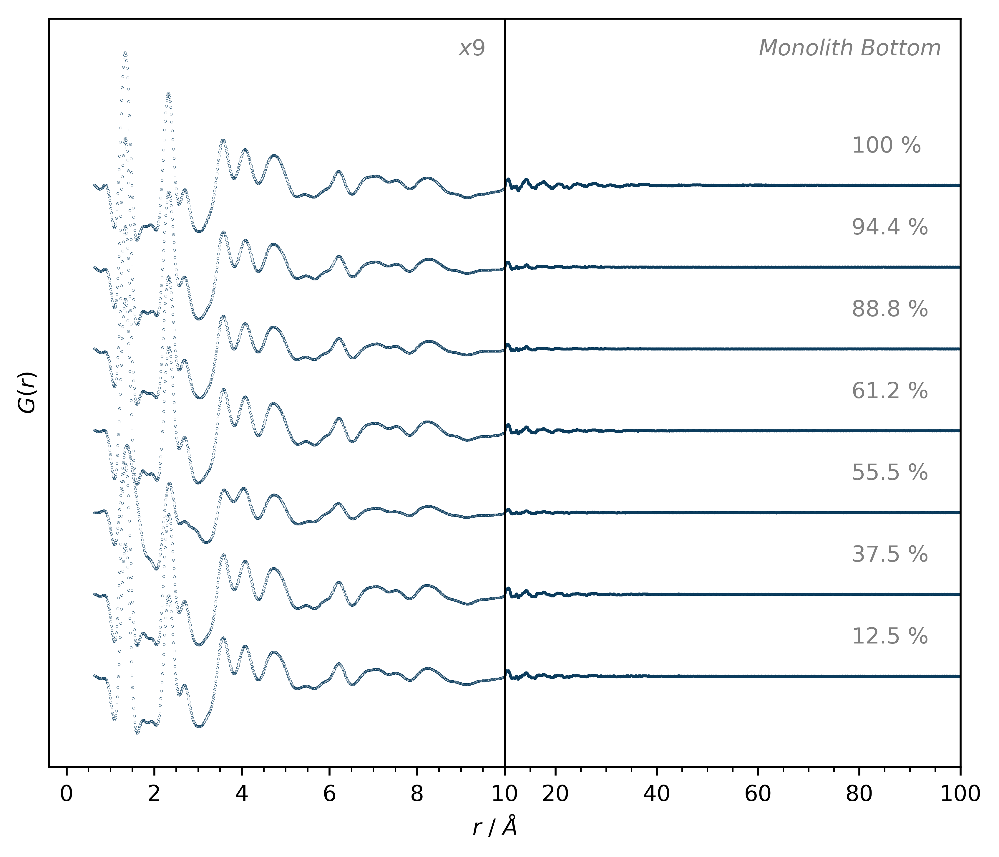

In [348]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\boxcarPDF+Iq\\'
os.chdir(path)

#PDF
r = np.genfromtxt('01.grboxcar.gr', delimiter=' ', usecols=0, skip_header=26)

g01 = np.genfromtxt('01.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g02 = np.genfromtxt('02.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g03 = np.genfromtxt('03.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g04 = np.genfromtxt('04.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g05 = np.genfromtxt('05.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g06 = np.genfromtxt('06.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g07 = np.genfromtxt('07.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g08 = np.genfromtxt('08.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g09 = np.genfromtxt('09.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g10 = np.genfromtxt('10.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g11 = np.genfromtxt('11.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g12 = np.genfromtxt('12.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g13 = np.genfromtxt('13.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g14 = np.genfromtxt('14.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g15 = np.genfromtxt('15.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g16 = np.genfromtxt('16.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g17 = np.genfromtxt('17.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g18 = np.genfromtxt('18.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g19 = np.genfromtxt('19.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,1])
ax1 = plt.subplot(G00[0,0])
ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r,g03+1.25,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g06+1.00,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g09+0.75,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g12+0.50,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g15+0.25,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g18,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r,g19+1.50,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")


ax0.set_xlim(10,100)
ax0.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Bottom}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(78.5, 0.1, '12.5 %', fontsize=9, color='#808080')
ax0.text(78.5, 0.35, '37.5 %', fontsize=9, color='#808080')
ax0.text(78.5, 0.6, '55.5 %', fontsize=9, color='#808080')
ax0.text(78.5, 0.85, '61.2 %', fontsize=9, color='#808080')
ax0.text(78.5, 1.1, '88.8 %', fontsize=9, color='#808080')
ax0.text(78.5, 1.35, '94.4 %', fontsize=9, color='#808080')
ax0.text(78.5, 1.6, '100 %', fontsize=9, color='#808080')

ax1.set_yticks(())
ax1.tick_params(axis='x', labelsize=9)
ax1.minorticks_on()
color='#0B3C5D'
ax1.plot(r,g03+1.25,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(r,g06+1.00,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(r,g09+0.75,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(r,g12+0.50,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(r,g15+0.25,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(r,g18,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(r,g19+1.50,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax1.set_xlabel(r'                                                              $\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax1.set_xlim(-0.4,10)
ax1.add_artist(AnchoredText(r"$\it{x9}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

f.tight_layout
plt.savefig('20200420_Dan_COF_PDF_Bottom.tif')
plt.show()

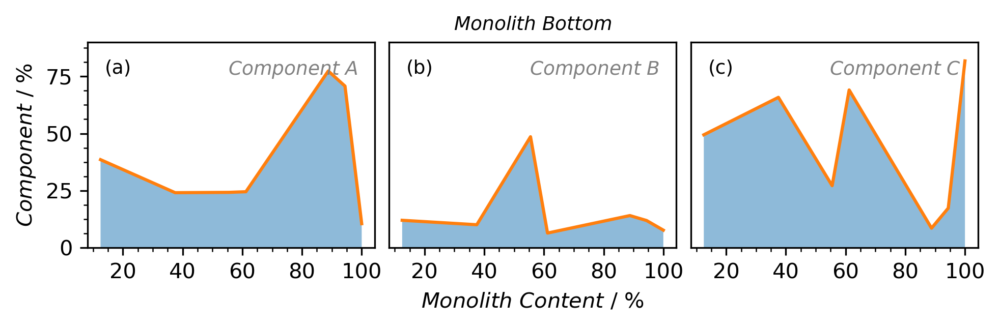

In [353]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\NMF\\'
os.chdir(path)

H_ind = [12.5,37.5,55.5,61.2,88.8,94.4,100]

HA=[38.550,	24.099,	24.244,	24.518,	77.351,	70.751,	10.536]
HB=[12.018,	10.073,	48.577,	6.431,	14.081,	11.909,	7.700]
HC=[49.431,	65.827,	27.179,	69.051,	8.568,	17.340,	81.764]


f = plt.figure(dpi=300)
f.set_figheight(1.87*1.2)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs0[0], hspace=0.2, wspace=0.05)

ax0 = plt.subplot(G00[0,0:1])
ax1 = plt.subplot(G00[0,1:2])
ax2 = plt.subplot(G00[0,2:3])
ax0.stackplot(H_ind, HA, alpha=0.5)
ax0.plot(H_ind, HA)
ax1.stackplot(H_ind, HB, alpha=0.5)
ax1.plot(H_ind, HB)
ax2.stackplot(H_ind, HC, alpha=0.5)
ax2.plot(H_ind, HC)

ax0.minorticks_on()
ax1.minorticks_on()
ax2.minorticks_on()

ax0.set_ylim(0,90)
ax1.set_ylim(0,90)
ax1.set_yticks(())
ax2.set_ylim(0,90)
ax2.set_yticks(())

ax0.set_xticks((20,40,60,80,100))
ax1.set_xticks((20,40,60,80,100))
ax2.set_xticks((20,40,60,80,100))


ax1.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %')
ax0.set_ylabel(r'$\it{Component}$ / %')

ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{Component}$ $\it{B}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{Component}$ $\it{C}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))

ax1.set_title(r'$\it{Monolith}$ $\it{Bottom}$', fontsize=9)

f.tight_layout()
plt.savefig('20200420_Dan_COF_Component_Weightings_Bottom.tif')
plt.show()

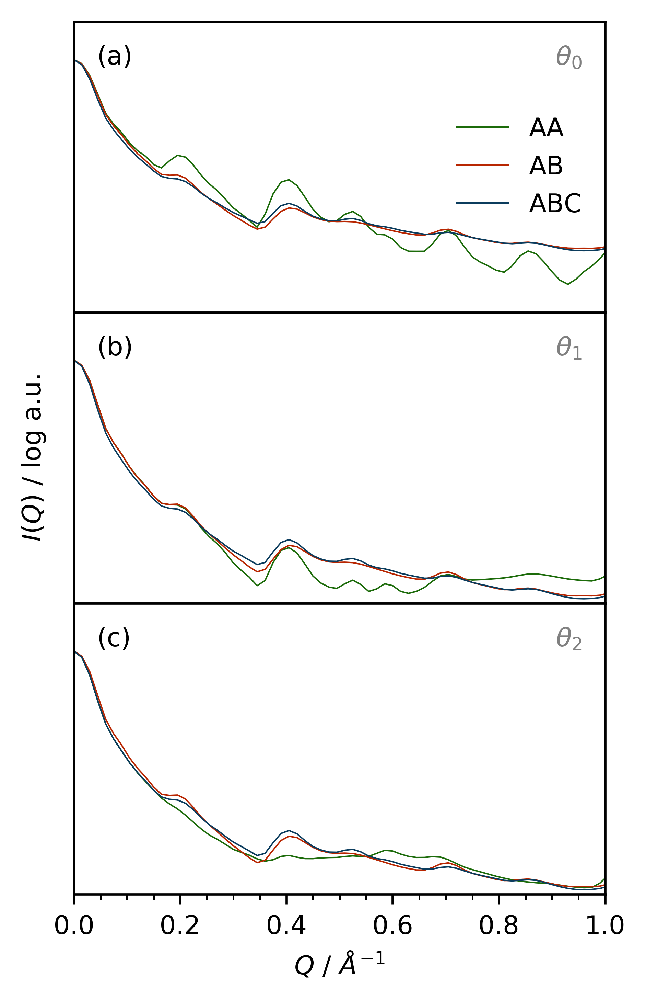

In [397]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\Calc CIF\calc_saxs\\'
os.chdir(path)

q = np.genfromtxt('AA_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='    ', usecols=0, skip_header=2)

aat0 = np.genfromtxt('AA_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
aat1 = np.genfromtxt('AB_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
aat2 = np.genfromtxt('ABC_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)

abt0 = np.genfromtxt('AB_turbostratic_COF_theta1_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abt1 = np.genfromtxt('AB_turbostratic_COF_theta1_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abt2 = np.genfromtxt('AB_turbostratic_COF_theta1_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)

abct0 = np.genfromtxt('ABC_turbostratic_COF_theta2_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abct1 = np.genfromtxt('ABC_turbostratic_COF_theta2_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abct2 = np.genfromtxt('ABC_turbostratic_COF_theta2_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(q,aat0,color='#1C6B0A', linewidth=0.5, label='AA')
ax0.plot(q,abt0,color='#B82601', linewidth=0.5, label='AB')
ax0.plot(q,abct0,color='#0B3C5D', linewidth=0.5, label='ABC')

ax1.plot(q,aat1,color='#1C6B0A', linewidth=0.5)
ax1.plot(q,abt1,color='#B82601', linewidth=0.5)
ax1.plot(q,abct1,color='#0B3C5D', linewidth=0.5)

ax2.plot(q,aat2,color='#1C6B0A', linewidth=0.5)
ax2.plot(q,abt2,color='#B82601', linewidth=0.5)
ax2.plot(q,abct2,color='#0B3C5D', linewidth=0.5)

ax2.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.set_ylabel(r'$\it{I(Q)}$ / log a.u.', rotation='vertical', fontsize=9)
ax0.set_xlim(0,1)
ax1.set_xlim(0,1)
ax2.set_xlim(0,1)
ax0.set_yscale("log")
ax1.set_yscale("log")
ax2.set_yscale("log")
ax0.set_ylim(1000,)
ax1.set_ylim(10000,)
ax2.set_ylim(10000,)
ax0.legend(loc=7, frameon=False, fontsize=9)

ax0.add_artist(AnchoredText(r"$\it{\theta_0}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{\theta_1}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{\theta_2}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))


ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax0.set_yticks([])
ax0.set_xticks([])
ax1.set_yticks([])
ax1.set_xticks([])
ax2.set_yticks([])
ax0.yaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')

f.tight_layout
plt.savefig('20200421_Dan_TurbostraticCOF_Calc_SAXS.tif')
plt.show()

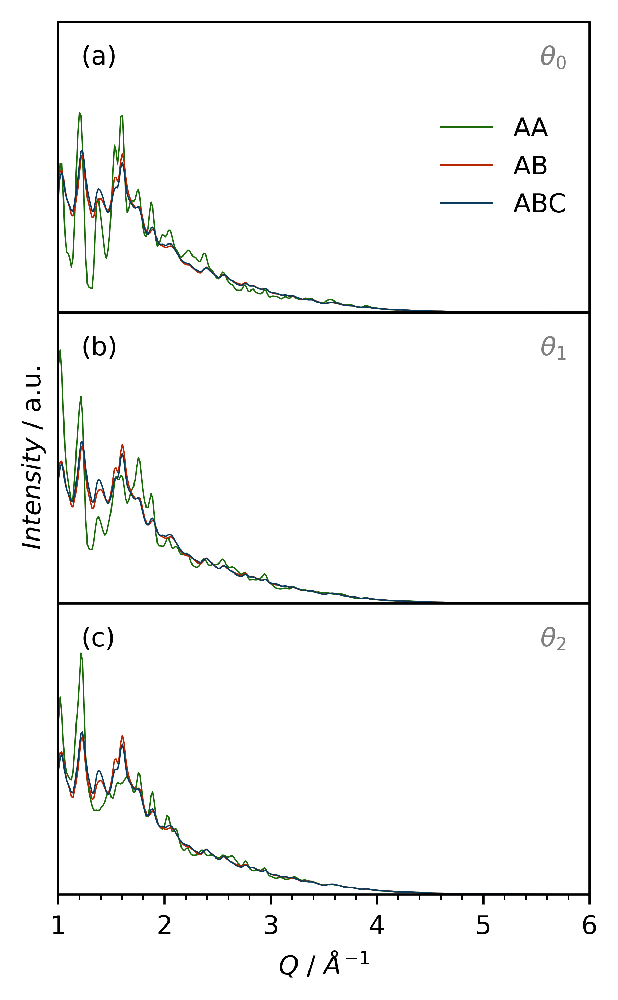

In [406]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_3_analysis\Monoliths_analysis\COFs\Calc CIF\calc_saxs\\'
os.chdir(path)

q = np.genfromtxt('AA_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='    ', usecols=0, skip_header=2)

aat0 = np.genfromtxt('AA_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
aat1 = np.genfromtxt('AB_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
aat2 = np.genfromtxt('ABC_turbostratic_COF_theta0_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)

abt0 = np.genfromtxt('AB_turbostratic_COF_theta1_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abt1 = np.genfromtxt('AB_turbostratic_COF_theta1_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abt2 = np.genfromtxt('AB_turbostratic_COF_theta1_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)

abct0 = np.genfromtxt('ABC_turbostratic_COF_theta2_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abct1 = np.genfromtxt('ABC_turbostratic_COF_theta2_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)
abct2 = np.genfromtxt('ABC_turbostratic_COF_theta2_4L-repeat_nosymm_saxs.dat', delimiter='   ', usecols=1, skip_header=2)

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(q,aat0,color='#1C6B0A', linewidth=0.5, label='AA')
ax0.plot(q,abt0,color='#B82601', linewidth=0.5, label='AB')
ax0.plot(q,abct0,color='#0B3C5D', linewidth=0.5, label='ABC')

ax1.plot(q,aat1,color='#1C6B0A', linewidth=0.5)
ax1.plot(q,abt1,color='#B82601', linewidth=0.5)
ax1.plot(q,abct1,color='#0B3C5D', linewidth=0.5)

ax2.plot(q,aat2,color='#1C6B0A', linewidth=0.5)
ax2.plot(q,abt2,color='#B82601', linewidth=0.5)
ax2.plot(q,abct2,color='#0B3C5D', linewidth=0.5)

ax2.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.set_ylabel(r'$\it{Intensity}$ / a.u.', rotation='vertical', fontsize=9)
ax0.set_xlim(1,6)
ax1.set_xlim(1,6)
ax2.set_xlim(1,6)
#ax0.set_yscale("log")
#ax1.set_yscale("log")
#ax2.set_yscale("log")
ax0.set_ylim(0,30000)
ax1.set_ylim(0,30000)
ax2.set_ylim(0,30000)
ax0.legend(loc=7, frameon=False, fontsize=9)

ax0.add_artist(AnchoredText(r"$\it{\theta_0}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{\theta_1}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{\theta_2}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))


ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax0.set_yticks([])
ax0.set_xticks([])
ax1.set_yticks([])
ax1.set_xticks([])
ax2.set_yticks([])
ax0.yaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')

f.tight_layout
plt.savefig('20200421_Dan_TurbostraticCOF_Calc_XRD.tif')
plt.show()

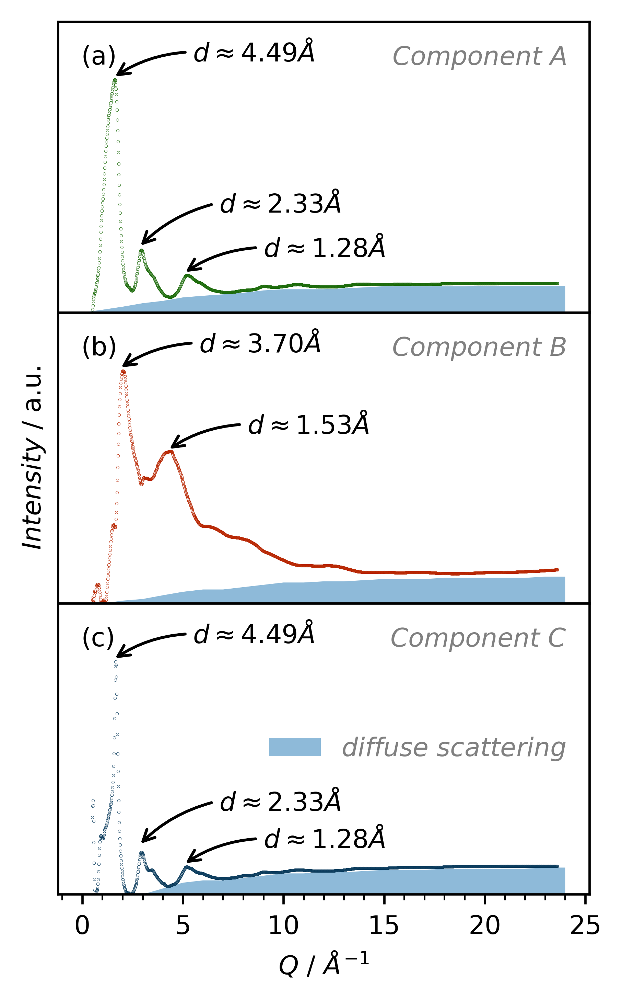

In [569]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

wavelength= 0.2115

xa = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentA.xye', delimiter='       ', usecols=0, skip_header=3)
qa = ((4*((np.pi))*(np.sin(np.deg2rad(xa/2))))/wavelength)
ya = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentA.xye', delimiter='       ', usecols=1, skip_header=3)
nya = (ya-ya.min())/(ya.max()-ya.min())

xb = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentB.xye', delimiter='       ', usecols=0, skip_header=3)
qb = ((4*((np.pi))*(np.sin(np.deg2rad(xb/2))))/wavelength)
yb = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentB.xye', delimiter='       ', usecols=1, skip_header=3)
nyb = (yb-yb.min())/(yb.max()-yb.min())

xc = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentC.xye', delimiter='       ', usecols=0, skip_header=3)
qc = ((4*((np.pi))*(np.sin(np.deg2rad(xc/2))))/wavelength)
yc = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentC.xye', delimiter='       ', usecols=1, skip_header=3)
nyc = (yc-yc.min())/(yc.max()-yc.min())

Hind = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
HC = [0.0,0.0,0.0,0.0,0.025,0.05,0.06,0.06,0.07,0.08,0.09,0.09,0.095,0.095,
      0.1,0.105,0.105,0.105,0.11,0.11,0.11,0.11,0.11, 0.115, 0.115]
HB = [0.0,0.0,0.012,0.019,0.035,0.05,0.06,0.06,0.07,0.08,0.09,0.09,0.095,0.095,
      0.1,0.105,0.105,0.105,0.11,0.11,0.11,0.11,0.11, 0.115, 0.115]

HA = [0.000,0.012,0.025,0.040,0.050,
      0.065,0.072,0.078,0.085,0.095,
      0.100,0.100,0.100,0.104,0.108,
      0.113,0.113,0.113,0.113,0.113,
      0.115,0.115,0.115,0.115,0.115]


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(qa,nya,color='#1C6B0A', marker='o', markersize=0.1, linewidth=0)#, label='A')
ax0.stackplot(Hind,HA, alpha=0.5)
ax1.plot(qb,nyb,color='#B82601', marker='o', markersize=0.1, linewidth=0)#, label='B')
ax1.stackplot(Hind,HB, alpha=0.5)
ax2.plot(qc,nyc,color='#0B3C5D', marker='o', markersize=0.1, linewidth=0)#, label='C')
ax2.stackplot(Hind,HC, alpha=0.5, labels=([r'$\it{diffuse}$ $\it{scattering}$']))

ax2.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.set_ylabel(r'$\it{Intensity}$ / a.u.', rotation='vertical', fontsize=9)
ax0.set_ylim(0,1.25)
ax1.set_ylim(0,1.25)
ax2.set_ylim(0,1.25)
l = ax2.legend(loc=7, frameon=False, fontsize=9)
for text in l.get_texts():
    text.set_color('#808080')

ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{Component}$ $\it{B}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{Component}$ $\it{C}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))


ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax0.set_yticks([])
ax0.set_xticks([])
ax1.set_yticks([])
ax1.set_xticks([])
ax2.set_yticks([])
ax0.yaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')

ax0.annotate('', xy=(1.4,1.0), xytext=(5.4,1.12),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax0.annotate('', xy=(2.7,0.27), xytext=(6.7,0.47),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax0.annotate('', xy=(4.9,0.16), xytext=(8.9,0.28),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax1.annotate('', xy=(1.7,1.0), xytext=(5.7,1.12),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax1.annotate('', xy=(4.1,0.65), xytext=(8.1,0.77),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax2.annotate('', xy=(1.4,1.0), xytext=(5.4,1.12),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax2.annotate('', xy=(2.7,0.20), xytext=(6.7,0.40),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))
ax2.annotate('', xy=(4.9,0.12), xytext=(8.9,0.24),arrowprops=(dict(arrowstyle="->",connectionstyle="arc3, rad=0.15")))


ax0.text(5.5,1.08,r'$\it{d\approx 4.49 \AA}$',fontsize=9)
ax0.text(6.8,0.43,r'$\it{d\approx 2.33 \AA}$',fontsize=9)
ax0.text(9.0,0.24,r'$\it{d\approx 1.28 \AA}$',fontsize=9)

ax1.text(5.8,1.08,r'$\it{d\approx 3.70 \AA}$',fontsize=9)
ax1.text(8.2,0.73,r'$\it{d\approx 1.53 \AA}$',fontsize=9)

ax2.text(5.5,1.08,r'$\it{d\approx 4.49 \AA}$',fontsize=9)
ax2.text(6.8,0.36,r'$\it{d\approx 2.33 \AA}$',fontsize=9)
ax2.text(9.0,0.20,r'$\it{d\approx 1.28 \AA}$',fontsize=9)

f.tight_layout
plt.savefig('20200421_Dan_COF_NMF-XRD_Components_Annotated.tif')
plt.show()

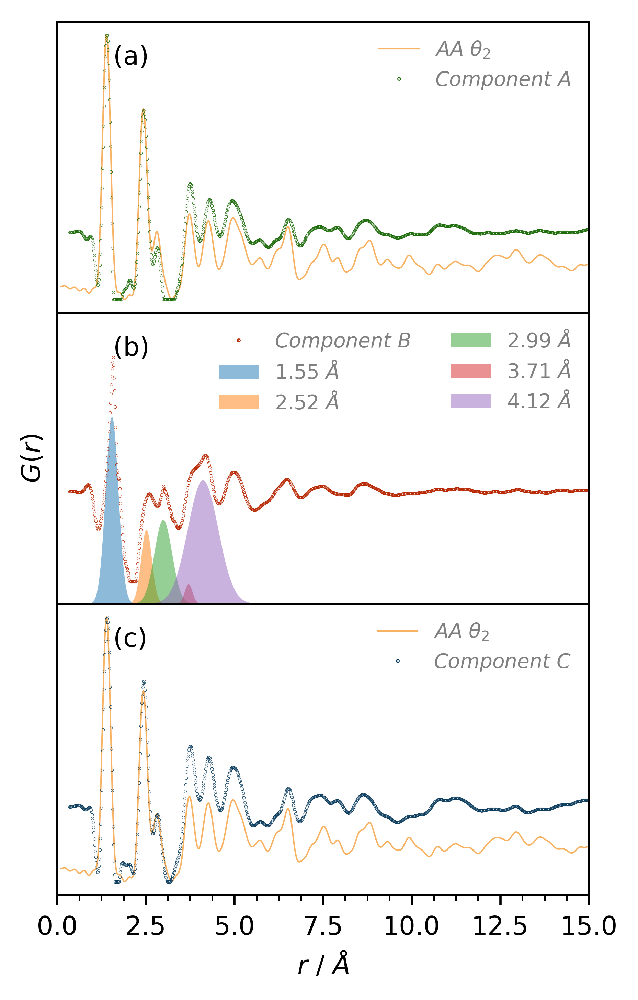

In [131]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

ar = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=0, skip_header=7)
nar = ar+((ar/0.26)*0.013)
ag = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=1, skip_header=7)
nag = (ag-ag.min())/(ag.max()-ag.min())
br = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=0, skip_header=7)
nbr = br+((br/0.26)*0.013)
bg = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=1, skip_header=7)
nbg = (bg-bg.min())/(bg.max()-bg.min())
cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())
tr = np.genfromtxt('turbostratic structures\calc_pdf\AA_theta2_4Layer.cgr', delimiter=' ', usecols=0, skip_header=9)
tg = np.genfromtxt('turbostratic structures\calc_pdf\AA_theta2_4Layer.cgr', delimiter=' ', usecols=1, skip_header=9)
ntg = (tg-tg.min())/(tg.max()-tg.min())


x1 = np.genfromtxt('0peaks.csv', usecols=0, delimiter=',')
x2 = np.genfromtxt('1peaks.csv', usecols=0, delimiter=',')
x3 = np.genfromtxt('2peaks.csv', usecols=0, delimiter=',')
x4 = np.genfromtxt('3peaks.csv', usecols=0, delimiter=',')
x5 = np.genfromtxt('4peaks.csv', usecols=0, delimiter=',')
f1 = np.genfromtxt('0peaks.csv', usecols=1, delimiter=',')
f2 = np.genfromtxt('1peaks.csv', usecols=1, delimiter=',')
f3 = np.genfromtxt('2peaks.csv', usecols=1, delimiter=',')
f4 = np.genfromtxt('3peaks.csv', usecols=1, delimiter=',')
f5 = np.genfromtxt('4peaks.csv', usecols=1, delimiter=',')


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(tr,ntg,color='#f7b263', linewidth=0.5, label=r'$\it{AA}$ $\it{\theta_{2}}$')
ax0.plot(nar,nag,color='#1C6B0A', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{A}$')
ax1.plot(nbr,nbg+0.1,color='#B82601', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{B}$')
ax1.stackplot(x3,f3,alpha=0.5,labels=([r'$\it{1.55}$ $\it{\AA}$']))
ax1.stackplot(x1,f1,alpha=0.5,labels=([r'$\it{2.52}$ $\it{\AA}$']))
ax1.stackplot(x2,f2,alpha=0.5,labels=([r'$\it{2.99}$ $\it{\AA}$']))
ax1.stackplot(x4,f4,alpha=0.5,labels=([r'$\it{3.71}$ $\it{\AA}$']))
ax1.stackplot(x5,f5,alpha=0.5,labels=([r'$\it{4.12}$ $\it{\AA}$']))
ax2.plot(tr,ntg,color='#f7b263', linewidth=0.5, label=r'$\it{AA}$ $\it{\theta_{2}}$')
ax2.plot(ncr,ncg,color='#0B3C5D', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{C}$')

ax2.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(0,15)
ax1.set_xlim(0,15)
ax1.set_ylim(0,1.3)
ax2.set_xlim(0,15)
l = ax2.legend(loc=1, frameon=False,markerscale=3, fontsize=7)
for text in l.get_texts():
    text.set_color('#808080')
k = ax1.legend(loc=1, frameon=False,markerscale=3, fontsize=7, ncol=2)
for text in k.get_texts():
    text.set_color('#808080')
j = ax0.legend(loc=1, frameon=False,markerscale=3, fontsize=7)
for text in j.get_texts():
    text.set_color('#808080')

ax0.add_artist(AnchoredText(r"    (a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText(r"    (b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText(r"    (c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax0.set_yticks([])
ax0.set_xticks([])
ax1.set_yticks([])
ax1.set_xticks([])
ax2.set_yticks([])
ax0.yaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')

f.tight_layout
plt.savefig('20200421_Dan_COF_NMF-PDF_Components_Annotated.tif')
plt.show()

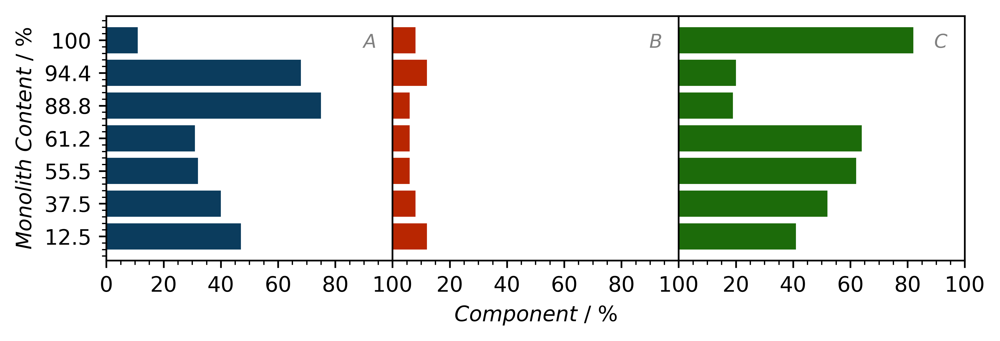

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\NMF\\'
os.chdir(path)


H_ind = ('12.5','37.5','55.5','61.2','88.8','94.4','100')
ind = np.arange(len(H_ind))

HA=[47,	40,	32,	31,	75,	68,	11]
HB=[12,	8,	6,	6,	6,	12,	8]
HC=[41,	52,	62,	64,	19,	20,	82]


f = plt.figure(dpi=600)
f.set_figheight(1.87*1.25)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs0[0], hspace=0, wspace=0)

ax0 = plt.subplot(G00[0,0:1])
ax1 = plt.subplot(G00[0,1:2])
ax2 = plt.subplot(G00[0,2:3])
#ax1 = plt.subplot(G00[0,1:2])
#ax2 = plt.subplot(G00[0,2:3])
#ax0.bar(H_ind, HC,HA,HB, alpha=0.5)
#ax0.plot(H_ind, HA)
#ax1.stackplot(H_ind, HB, alpha=0.5)
#ax1.plot(H_ind, HB)
#ax2.stackplot(H_ind, HC, alpha=0.5)
#ax2.plot(H_ind, HC)

ax0.barh(ind, HA, color='#0B3C5D', align='center')#, height=0.9)
#lefts = bars1
ax1.barh(ind, HB, color='#B82601', align='center')#, left=lefts, height=0.9)
#lefts = lefts + bars2
ax2.barh(ind, HC, color='#1C6B0A', align='center')#, left=lefts, height=0.9)


ax0.minorticks_on()
ax1.minorticks_on()
ax2.minorticks_on()

#ax0.set_ylim(0,8)
ax0.set_yticks(ind)
ax0.set_yticklabels(H_ind)
ax1.set_yticks([])
#ax2.set_ylim(0,90)
ax2.set_yticks([])

ax0.set_xticks((0,20,40,60,80,100))
ax1.set_xticks((20,40,60,80,100))
ax2.set_xticks((20,40,60,80,100))


ax0.set_ylabel(r'$\it{Monolith}$ $\it{Content}$ / %')
ax1.set_xlabel(r'$\it{Component}$ / %')

ax0.add_artist(AnchoredText(r"$\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{B}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax2.add_artist(AnchoredText(r"$\it{C}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

#ax0.add_artist(AnchoredText("(a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
#ax1.add_artist(AnchoredText("(b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
#ax2.add_artist(AnchoredText("(c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))

#ax1.set_title(r'$\it{Monolith}$ $\it{Bottom}$', fontsize=9)

f.tight_layout()
plt.savefig('20200420_Dan_COF_Component_Weightings_Barh.tif')
plt.show()

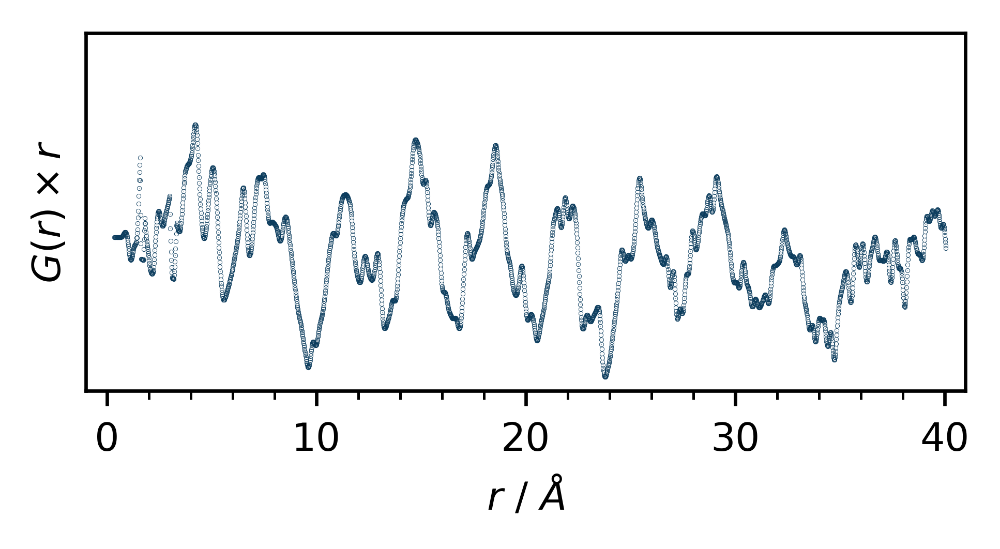

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Users\donolan\Dropbox\PDF_re-do\XRD_PDF Analysis\PDF\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('PDF_stacking_distances.csv', delimiter=',', usecols=0, skip_header=1)
g01 = np.genfromtxt('PDF_stacking_distances.csv', delimiter=',', usecols=1, skip_header=1)

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r01[0:3050],g01[0:3050],color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")


ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r) \times r}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-1,41)
ax0.set_ylim(-0.000045,0.00006)

#ax0.text(19, 0.2, '12.5 %', fontsize=9, color='#808080')


f.tight_layout()
plt.savefig('20200504_Dan_COF_dPDF_LayerStacks.tif')
plt.show()

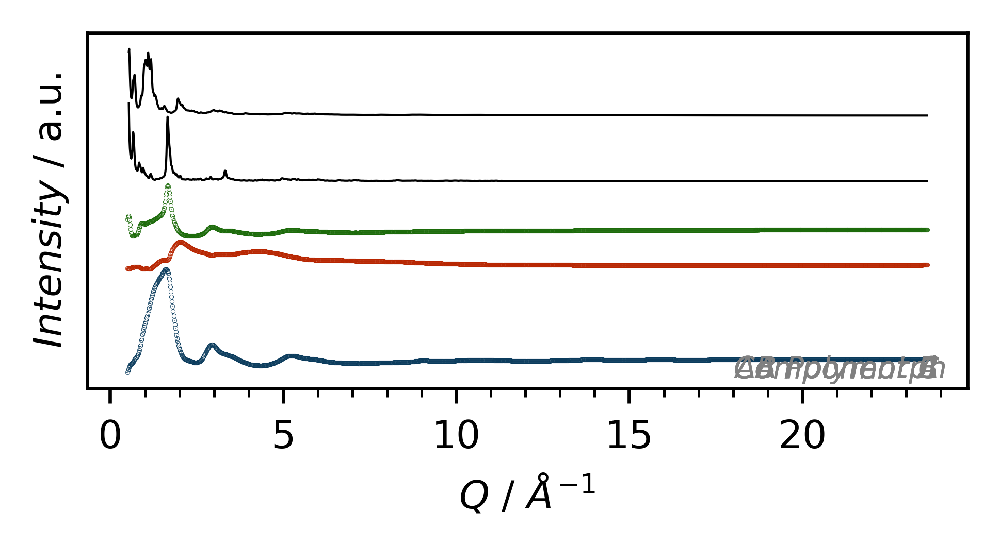

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

wavelength= 0.2115

xa = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentA.xye', delimiter='       ', usecols=0, skip_header=3)
qa = ((4*((np.pi))*(np.sin(np.deg2rad(xa/2))))/wavelength)
ya = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentA.xye', delimiter='       ', usecols=1, skip_header=3)
nya = (ya-ya.min())/(ya.max()-ya.min())

xb = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentB.xye', delimiter='       ', usecols=0, skip_header=3)
qb = ((4*((np.pi))*(np.sin(np.deg2rad(xb/2))))/wavelength)
yb = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentB.xye', delimiter='       ', usecols=1, skip_header=3)
nyb = (yb-yb.min())/(yb.max()-yb.min())

xc = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentC.xye', delimiter='       ', usecols=0, skip_header=3)
qc = ((4*((np.pi))*(np.sin(np.deg2rad(xc/2))))/wavelength)
yc = np.genfromtxt('XRD_PDF Analysis\XRD\ComponentC.xye', delimiter='       ', usecols=1, skip_header=3)
nyc = (yc-yc.min())/(yc.max()-yc.min())

xaa = np.genfromtxt('AA_TPB-DMTP-COF.xye', delimiter='   ', usecols=0, skip_header=3)
qaa = ((4*((np.pi))*(np.sin(np.deg2rad(xaa/2))))/wavelength)
yaa = np.genfromtxt('AA_TPB-DMTP-COF.xye', delimiter='   ', usecols=1, skip_header=3)
nyaa = (yaa-yaa.min())/(yaa.max()-yaa.min())

xab = np.genfromtxt('AB_TPB-DMTP-COF.xye', delimiter='   ', usecols=0, skip_header=3)
qab = ((4*((np.pi))*(np.sin(np.deg2rad(xab/2))))/wavelength)
yab = np.genfromtxt('AB_TPB-DMTP-COF.xye', delimiter='   ', usecols=1, skip_header=3)
nyab = (yab-yab.min())/(yab.max()-yab.min())

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(qa,ya,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(qb,yb+2000,color='#B82601', marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{B}$")
ax0.plot(qc,yc+2600,color='#1C6B0A', marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{C}$")
ax0.plot(qaa[45:-60],(yaa[45:-60]*3)+3600,color='k', linewidth=0.5, label=r"$\it{AA}$")
ax0.plot(qab[45:-60],(yab[45:-60])+4800,color='k', linewidth=0.5, label=r"$\it{AB}$")

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{Intensity}$ / a.u.', rotation='vertical', fontsize=9)

ax0.text(18, 4.6, r"$\it{AB}$ $\it{Polymorph}$", fontsize=7, color='#808080')
ax0.text(18, 3.5, r"$\it{AA}$ $\it{Polymorph}$", fontsize=7, color='#808080')
ax0.text(18, 2.55, r"$\it{Component}$ $\it{C}$", fontsize=7, color='#808080')
ax0.text(18, 1.5, r"$\it{Component}$ $\it{B}$", fontsize=7, color='#808080')
ax0.text(18, 0.35, r"$\it{Component}$ $\it{A}$", fontsize=7, color='#808080')


f.tight_layout()
#plt.savefig('20200504_Dan_COF_NMF-XRD.tif')
plt.show()

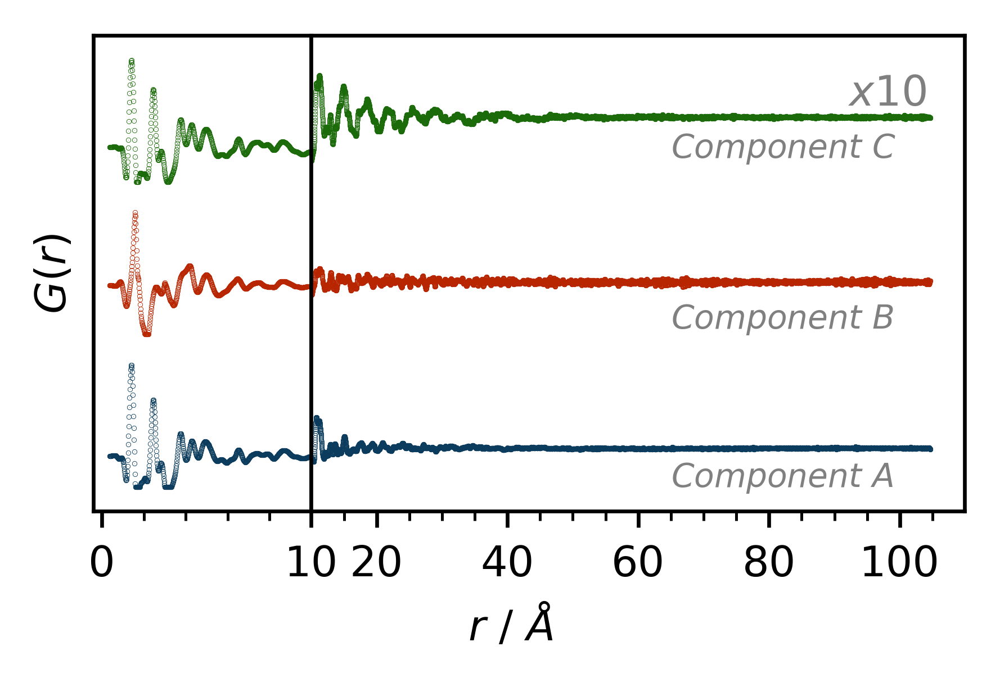

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys


path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

ar = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=0, skip_header=7)
nar = ar+((ar/0.26)*0.013)
ag = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=1, skip_header=7)
nag = (ag-ag.min())/(ag.max()-ag.min())
br = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=0, skip_header=7)
nbr = br+((br/0.26)*0.013)
bg = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=1, skip_header=7)
nbg = (bg-bg.min())/(bg.max()-bg.min())
cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())



f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=4, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0:1])
ax1 = plt.subplot(G00[0,1:4])

ax0.set_yticks(())
#ax0.set_xticks((0,4,8))
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

ax1.set_yticks(())
ax1.tick_params(axis='x', labelsize=9)
ax1.minorticks_on()

color='#0B3C5D'
ax0.plot(nar,(nag),color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nbr,(nbg)+1.25,color='#B82601', marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(ncr,(ncg)+2.5,color='#1C6B0A', marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax1.plot(nar,((nag)*10)-2.25,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(nbr,((nbg)*10)-2.35,color='#B82601', marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax1.plot(ncr,((ncg)*10)+0.2,color='#1C6B0A', marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.set_xlim(-0.4, 10)
ax1.set_xlim(10,)
ax0.set_ylim(-0.2,3.7)
ax1.set_ylim(-0.2,3.7)

ax1.set_xlabel(r'$\it{r}$ / $\AA$',color='w', fontsize=9)
ax1.text(34,-1.255,r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
#ax0.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Bottom}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.add_artist(AnchoredText(r"$\it{x10}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))
ax1.text(65,0,r"$\it{Component}$ $\it{A}$", color='#808080', fontsize=7)
ax1.text(65,1.3,r"$\it{Component}$ $\it{B}$", color='#808080', fontsize=7)
ax1.text(65,2.7,r"$\it{Component}$ $\it{C}$", color='#808080', fontsize=7)

f.tight_layout()
plt.savefig('20200504_Dan_COF_NMF-PDF.tif',bbox_inches='tight')
plt.show()

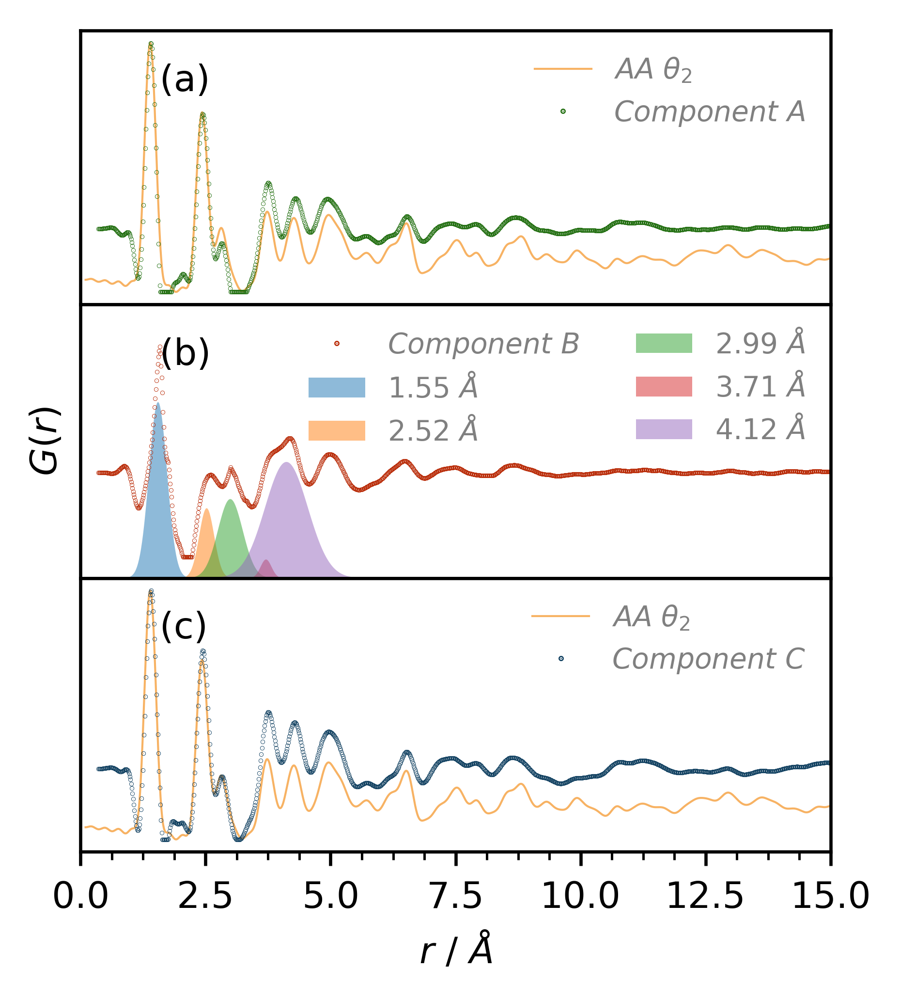

ValueError: operands could not be broadcast together with shapes (8010,) (4491,) 

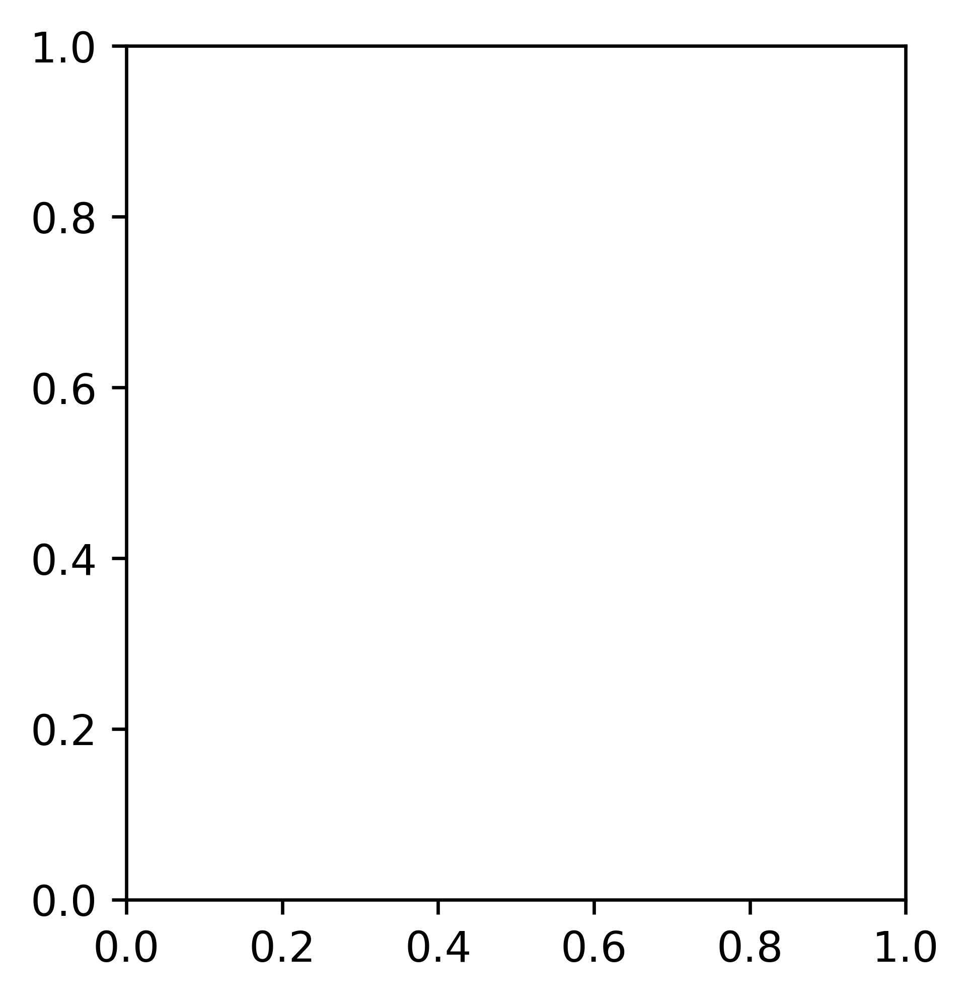

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

ar = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=0, skip_header=7)
nar = ar+((ar/0.26)*0.013)
ag = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=1, skip_header=7)
nag = (ag-ag.min())/(ag.max()-ag.min())
br = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=0, skip_header=7)
nbr = br+((br/0.26)*0.013)
bg = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=1, skip_header=7)
nbg = (bg-bg.min())/(bg.max()-bg.min())
cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())
tr = np.genfromtxt('turbostratic structures\calc_pdf\AA_theta2_4Layer.cgr', delimiter=' ', usecols=0, skip_header=9)
tg = np.genfromtxt('turbostratic structures\calc_pdf\AA_theta2_4Layer.cgr', delimiter=' ', usecols=1, skip_header=9)
ntg = (tg-tg.min())/(tg.max()-tg.min())


x1 = np.genfromtxt('0peaks.csv', usecols=0, delimiter=',')
x2 = np.genfromtxt('1peaks.csv', usecols=0, delimiter=',')
x3 = np.genfromtxt('2peaks.csv', usecols=0, delimiter=',')
x4 = np.genfromtxt('3peaks.csv', usecols=0, delimiter=',')
x5 = np.genfromtxt('4peaks.csv', usecols=0, delimiter=',')
f1 = np.genfromtxt('0peaks.csv', usecols=1, delimiter=',')
f2 = np.genfromtxt('1peaks.csv', usecols=1, delimiter=',')
f3 = np.genfromtxt('2peaks.csv', usecols=1, delimiter=',')
f4 = np.genfromtxt('3peaks.csv', usecols=1, delimiter=',')
f5 = np.genfromtxt('4peaks.csv', usecols=1, delimiter=',')


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(tr,ntg,color='#f7b263', linewidth=0.5, label=r'$\it{AA}$ $\it{\theta_{2}}$')
ax0.plot(nar,nag,color='#1C6B0A', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{A}$')
ax1.plot(nbr,nbg+0.1,color='#B82601', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{B}$')
ax1.stackplot(x3,f3,alpha=0.5,labels=([r'$\it{1.55}$ $\it{\AA}$']))
ax1.stackplot(x1,f1,alpha=0.5,labels=([r'$\it{2.52}$ $\it{\AA}$']))
ax1.stackplot(x2,f2,alpha=0.5,labels=([r'$\it{2.99}$ $\it{\AA}$']))
ax1.stackplot(x4,f4,alpha=0.5,labels=([r'$\it{3.71}$ $\it{\AA}$']))
ax1.stackplot(x5,f5,alpha=0.5,labels=([r'$\it{4.12}$ $\it{\AA}$']))
ax2.plot(tr,ntg,color='#f7b263', linewidth=0.5, label=r'$\it{AA}$ $\it{\theta_{2}}$')
ax2.plot(ncr,ncg,color='#0B3C5D', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{C}$')

ax2.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(0,15)
ax1.set_xlim(0,15)
ax1.set_ylim(0,1.3)
ax2.set_xlim(0,15)
l = ax2.legend(loc=1, frameon=False,markerscale=3, fontsize=7)
for text in l.get_texts():
    text.set_color('#808080')
k = ax1.legend(loc=1, frameon=False,markerscale=3, fontsize=7, ncol=2)
for text in k.get_texts():
    text.set_color('#808080')
j = ax0.legend(loc=1, frameon=False,markerscale=3, fontsize=7)
for text in j.get_texts():
    text.set_color('#808080')

ax0.add_artist(AnchoredText(r"    (a)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax1.add_artist(AnchoredText(r"    (b)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax2.add_artist(AnchoredText(r"    (c)", loc=2, frameon=False, prop=dict(color='k', fontsize=9)))
ax0.set_yticks([])
ax0.set_xticks([])
ax1.set_yticks([])
ax1.set_xticks([])
ax2.set_yticks([])
ax0.yaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')

f.tight_layout
plt.savefig('20200504_Dan_COF_NMF-PDF_Components_Annotated.tif')
plt.show()

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*2)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax0.plot(ncr, ncg-ntg)

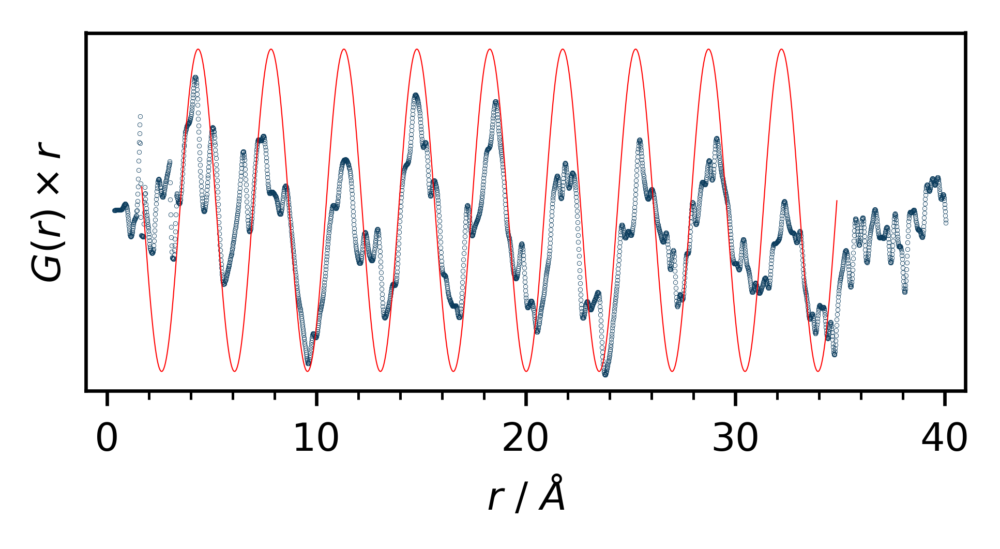

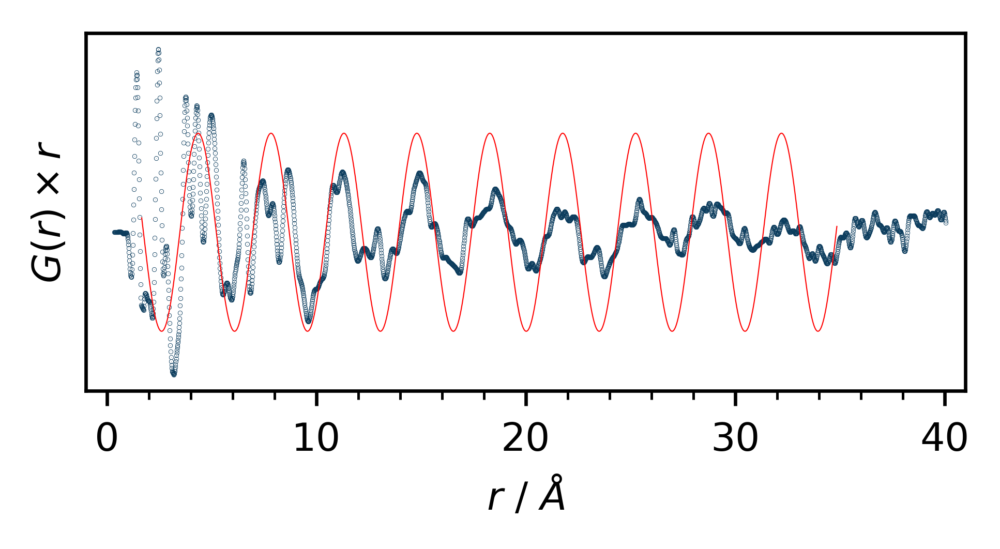

In [131]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Users\donolan\Dropbox\PDF_re-do\XRD_PDF Analysis\PDF\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('PDF_stacking_distances.csv', delimiter=',', usecols=0, skip_header=1)
g01 = np.genfromtxt('PDF_stacking_distances.csv', delimiter=',', usecols=1, skip_header=1)

x = 0.00004*(np.sin(2*np.pi*(3.517*6.28)*(r01*0.013)))

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r01[0:3050],g01[0:3050],color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r01[100:2650], x[100:2650],'r', linewidth=0.25)
ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r) \times r}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-1,41)
#ax0.set_ylim(-0.000045,0.00006)

#ax0.text(19, 0.2, '12.5 %', fontsize=9, color='#808080')


f.tight_layout()
plt.savefig('20200505_Dan_COF_dPDF_LayerStacks.tif')
plt.show()

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())
nncg = ncg-ncg[0]


x = 0.628*(np.sin(2*np.pi*(3.517*6.28)*(r01*0.013)))

f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(ncr[0:3050],(nncg[0:3050]*(ncr[0:3050])),color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(r01[100:2650], x[100:2650],'r', linewidth=0.25)
ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r) \times r}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-1,41)
#ax0.set_ylim(-0.000045,0.00006)

#ax0.text(19, 0.2, '12.5 %', fontsize=9, color='#808080')


f.tight_layout()
plt.savefig('20200505_Dan_COF_CompC_LayerStacks.tif')
plt.show()

C:\Users\donolan\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


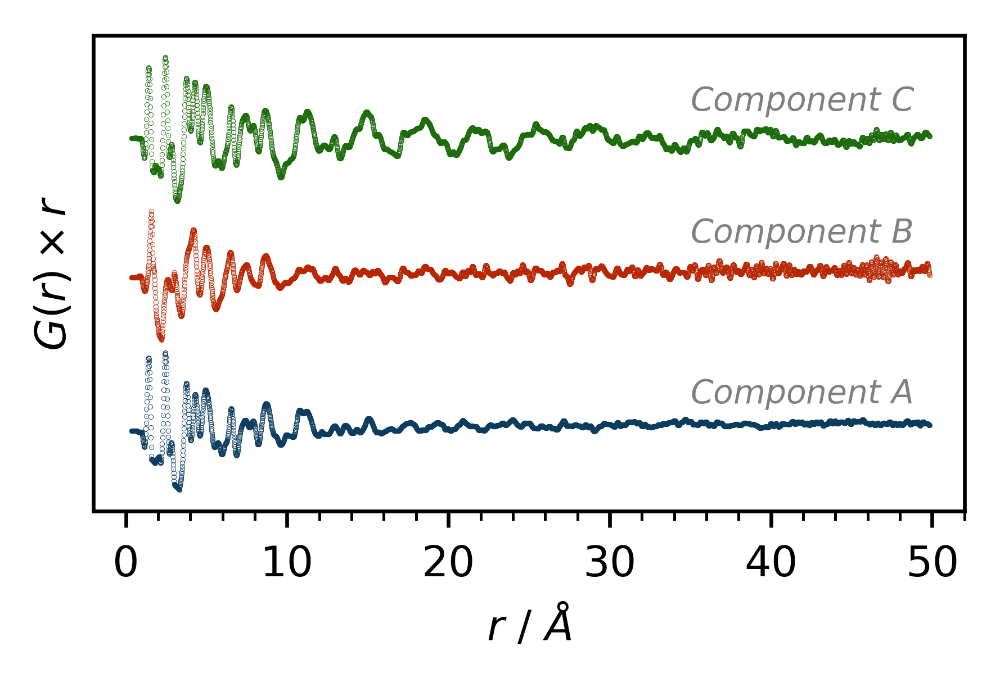

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys


path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

ar = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=0, skip_header=7)
nar = ar+((ar/0.26)*0.013)
ag = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=1, skip_header=7)
nag = (ag-ag.min())/(ag.max()-ag.min())
nnag = nag-nag[0]

br = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=0, skip_header=7)
nbr = br+((br/0.26)*0.013)
bg = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=1, skip_header=7)
nbg = (bg-bg.min())/(bg.max()-bg.min())
nnbg = nbg-nbg[0]

cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())
nncg = ncg-ncg[0]



f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()

color='#0B3C5D'
ax0.plot(nar[0:3800],(nnag[0:3800]*nar[0:3800]),color=color, 
         marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nbr[0:3800],(nnbg[0:3800]*nbr[0:3800])+2.2,color='#B82601', 
         marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(ncr[0:3800],(nncg[0:3800]*ncr[0:3800])+4.2,color='#1C6B0A', 
         marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.set_xlim(-2, 52)

ax0.set_ylabel(r'$\it{G(r) \times r}$', rotation='vertical', fontsize=9)
ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)

ax0.text(35,0.4,r"$\it{Component}$ $\it{A}$", color='#808080', fontsize=7)
ax0.text(35,2.7,r"$\it{Component}$ $\it{B}$", color='#808080', fontsize=7)
ax0.text(35,4.6,r"$\it{Component}$ $\it{C}$", color='#808080', fontsize=7)

f.tight_layout()
#plt.savefig('20200506_Dan_COF_NMF-PDF.tif',bbox_inches='tight')
plt.show()

data = {'r':nar[0:3800],
        'A':(nnag[0:3800]*nar[0:3800]),
        'B':(nnbg[0:3800]*nbr[0:3800]),
        'C':(nncg[0:3800]*ncr[0:3800])}
df = pd.DataFrame(data=data)
df.to_csv('G(r)xr_NMFComponents.csv')

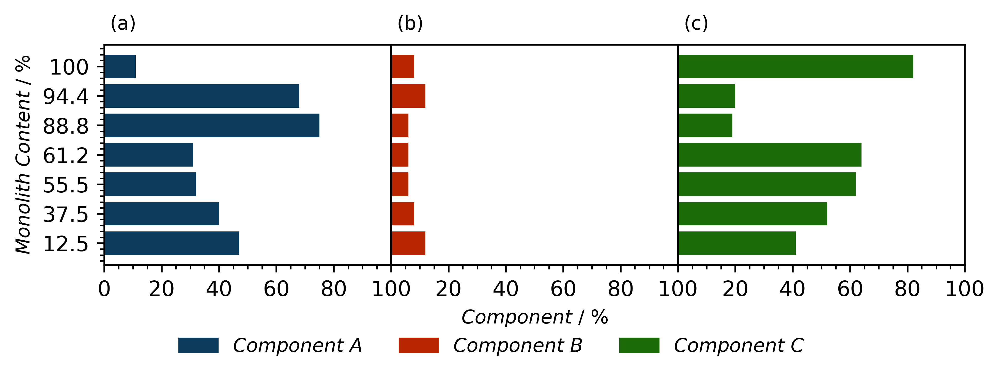

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\NMF\\'
os.chdir(path)

H_ind = ('12.5','37.5','55.5','61.2','88.8','94.4','100')
ind = np.arange(len(H_ind))
HA=[47,	40,	32,	31,	75,	68,	11]
HB=[12,	8,	6,	6,	6,	12,	8]
HC=[41,	52,	62,	64,	19,	20,	82]

f = plt.figure(dpi=600)
f.set_figheight(1.87*1.5)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs0[0], hspace=0, wspace=0)

ax0 = plt.subplot(G00[0,0:1])
ax1 = plt.subplot(G00[0,1:2])
ax2 = plt.subplot(G00[0,2:3])

ax0.barh(ind, HA, color='#0B3C5D', align='center', label=r'$\it{Component}$ $\it{A}$')
ax1.barh(ind, HB, color='#B82601', align='center', label=r'$\it{Component}$ $\it{B}$')
ax2.barh(ind, HC, color='#1C6B0A', align='center', label=r'$\it{Component}$ $\it{C}$')

ax0.minorticks_on()
ax1.minorticks_on()
ax2.minorticks_on()
ax0.set_yticks(ind)
ax0.set_yticklabels(H_ind)
ax1.set_yticks([])
ax2.set_yticks([])
ax0.set_xticks((0,20,40,60,80,100))
ax1.set_xticks((20,40,60,80,100))
ax2.set_xticks((20,40,60,80,100))

ax0.set_ylabel(r'$\it{Monolith}$ $\it{Content}$ / %', fontsize=9)
ax1.set_xlabel(r'$\it{Component}$ / %',fontsize=9)
ax0.text(2,7.25,r"(a)", fontsize=9)
ax1.text(2,7.25,r"(b)", fontsize=9)
ax2.text(2,7.25,r"(c)", fontsize=9)


blue_patch = mpatches.Patch(color='#0B3C5D', label=r'$\it{Component}$ $\it{A}$')
red_patch = mpatches.Patch(color='#B82601', label=r'$\it{Component}$ $\it{B}$')
green_patch = mpatches.Patch(color='#1C6B0A', label=r'$\it{Component}$ $\it{C}$')
plt.legend(handles=[blue_patch,red_patch,green_patch], ncol=3, bbox_to_anchor=(0.5, -0.25), 
           frameon=False, fontsize=9)


f.tight_layout()
plt.savefig('20200506_Dan_COF_Component_Weightings_Barh.svg')
plt.show()

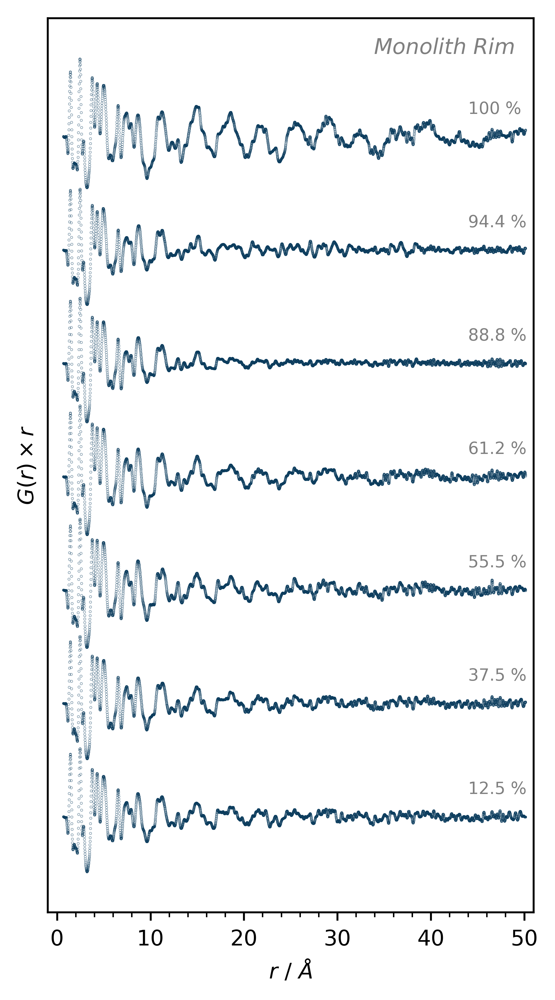

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\boxcarPDF+Iq\\'
os.chdir(path)

#PDF
r = np.genfromtxt('01.grboxcar.gr', delimiter=' ', usecols=0, skip_header=26)
nr = r+((r/0.26)*0.013)

g01 = np.genfromtxt('01.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g02 = np.genfromtxt('02.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g03 = np.genfromtxt('03.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g04 = np.genfromtxt('04.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g05 = np.genfromtxt('05.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g06 = np.genfromtxt('06.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g07 = np.genfromtxt('07.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g08 = np.genfromtxt('08.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g09 = np.genfromtxt('09.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g10 = np.genfromtxt('10.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g11 = np.genfromtxt('11.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g12 = np.genfromtxt('12.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g13 = np.genfromtxt('13.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g14 = np.genfromtxt('14.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g15 = np.genfromtxt('15.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g16 = np.genfromtxt('16.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g17 = np.genfromtxt('17.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g18 = np.genfromtxt('18.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)
g19 = np.genfromtxt('19.grboxcar.gr', delimiter=' ', usecols=1, skip_header=26)


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3.16)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])
ax0.set_yticks([])
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
ax0.set_xlim(-1,51)
color='#0B3C5D'
ax0.plot(nr[0:3800],(g01[0:3800]*nr[0:3800])+5.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nr[0:3800],(g04[0:3800]*nr[0:3800])+4.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nr[0:3800],(g07[0:3800]*nr[0:3800])+3.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nr[0:3800],(g10[0:3800]*nr[0:3800])+2.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nr[0:3800],(g13[0:3800]*nr[0:3800])+1.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nr[0:3800],(g16[0:3800]*nr[0:3800]),color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(nr[0:3800],(g19[0:3800]*nr[0:3800])+6.0,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")

ax0.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Rim}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(44, 0.2, '12.5 %', fontsize=7, color='#808080')
ax0.text(44, 1.2, '37.5 %', fontsize=7, color='#808080')
ax0.text(44, 2.2, '55.5 %', fontsize=7, color='#808080')
ax0.text(44, 3.2, '61.2 %', fontsize=7, color='#808080')
ax0.text(44, 4.2, '88.8 %', fontsize=7, color='#808080')
ax0.text(44, 5.2, '94.4 %', fontsize=7, color='#808080')
ax0.text(44, 6.2, '100 %', fontsize=7, color='#808080')

ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r) \times r}$', rotation='vertical', fontsize=9)


f.tight_layout()
#plt.savefig('20200515_Dan_COF_PDF_Edge.tif')
plt.show()

data = { 'r': nr[0:3800], 
        '12.5%':(g16[0:3800]*nr[0:3800]), '37.5%':(g13[0:3800]*nr[0:3800]), 
        '55.5%':(g10[0:3800]*nr[0:3800]),'61.2%':(g07[0:3800]*nr[0:3800]), 
        '88.8%':(g04[0:3800]*nr[0:3800]),'94.4%':(g01[0:3800]*nr[0:3800]),
        '100%':(g19[0:3800]*nr[0:3800])}
df = pd.DataFrame(data=data)
df.to_csv('G(r)xr.csv')

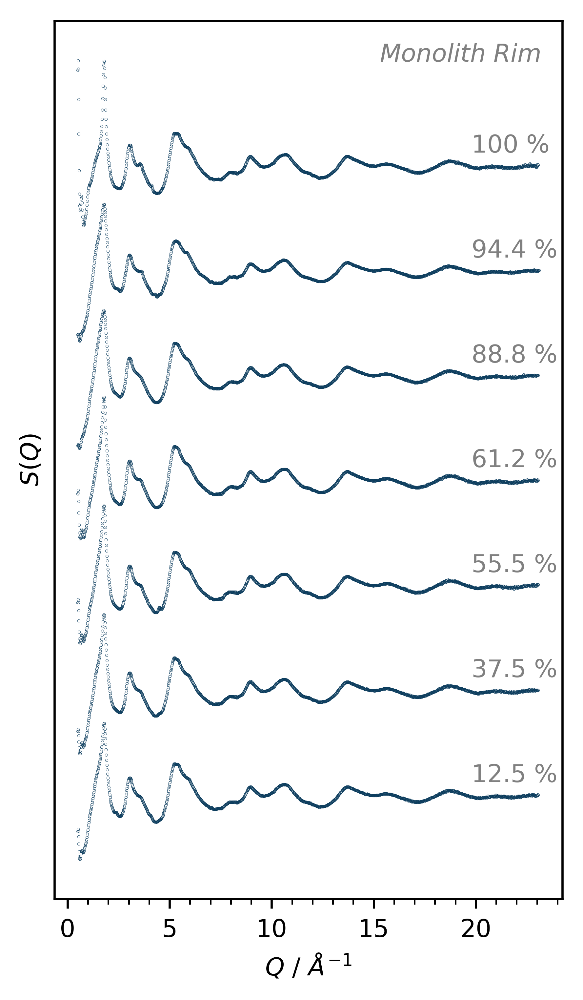

In [111]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\sq\\'
os.chdir(path)

#PDF
r01 = np.genfromtxt('01.sq', delimiter=' ', usecols=0, skip_header=26)
g01 = np.genfromtxt('01.sq', delimiter=' ', usecols=1, skip_header=26)
r02 = np.genfromtxt('02.sq', delimiter=' ', usecols=0, skip_header=26)
g02 = np.genfromtxt('02.sq', delimiter=' ', usecols=1, skip_header=26)
r03 = np.genfromtxt('03.sq', delimiter=' ', usecols=0, skip_header=26)
g03 = np.genfromtxt('03.sq', delimiter=' ', usecols=1, skip_header=26)
r04 = np.genfromtxt('04.sq', delimiter=' ', usecols=0, skip_header=26)
g04 = np.genfromtxt('04.sq', delimiter=' ', usecols=1, skip_header=26)
r05 = np.genfromtxt('05.sq', delimiter=' ', usecols=0, skip_header=26)
g05 = np.genfromtxt('05.sq', delimiter=' ', usecols=1, skip_header=26)
r06 = np.genfromtxt('06.sq', delimiter=' ', usecols=0, skip_header=26)
g06 = np.genfromtxt('06.sq', delimiter=' ', usecols=1, skip_header=26)
r07 = np.genfromtxt('07.sq', delimiter=' ', usecols=0, skip_header=26)
g07 = np.genfromtxt('07.sq', delimiter=' ', usecols=1, skip_header=26)
r08 = np.genfromtxt('08.sq', delimiter=' ', usecols=0, skip_header=26)
g08 = np.genfromtxt('08.sq', delimiter=' ', usecols=1, skip_header=26)
r09 = np.genfromtxt('09.sq', delimiter=' ', usecols=0, skip_header=26)
g09 = np.genfromtxt('09.sq', delimiter=' ', usecols=1, skip_header=26)
r10 = np.genfromtxt('10.sq', delimiter=' ', usecols=0, skip_header=26)
g10 = np.genfromtxt('10.sq', delimiter=' ', usecols=1, skip_header=26)
r11 = np.genfromtxt('11.sq', delimiter=' ', usecols=0, skip_header=26)
g11 = np.genfromtxt('11.sq', delimiter=' ', usecols=1, skip_header=26)
r12 = np.genfromtxt('12.sq', delimiter=' ', usecols=0, skip_header=26)
g12 = np.genfromtxt('12.sq', delimiter=' ', usecols=1, skip_header=26)
r13 = np.genfromtxt('13.sq', delimiter=' ', usecols=0, skip_header=26)
g13 = np.genfromtxt('13.sq', delimiter=' ', usecols=1, skip_header=26)
r14 = np.genfromtxt('14.sq', delimiter=' ', usecols=0, skip_header=26)
g14 = np.genfromtxt('14.sq', delimiter=' ', usecols=1, skip_header=26)
r15 = np.genfromtxt('15.sq', delimiter=' ', usecols=0, skip_header=26)
g15 = np.genfromtxt('15.sq', delimiter=' ', usecols=1, skip_header=26)
r16 = np.genfromtxt('16.sq', delimiter=' ', usecols=0, skip_header=26)
g16 = np.genfromtxt('16.sq', delimiter=' ', usecols=1, skip_header=26)
r17 = np.genfromtxt('17.sq', delimiter=' ', usecols=0, skip_header=26)
g17 = np.genfromtxt('17.sq', delimiter=' ', usecols=1, skip_header=26)
r18 = np.genfromtxt('18.sq', delimiter=' ', usecols=0, skip_header=26)
g18 = np.genfromtxt('18.sq', delimiter=' ', usecols=1, skip_header=26)
r19 = np.genfromtxt('19.sq', delimiter=' ', usecols=0, skip_header=26)
g19 = np.genfromtxt('19.sq', delimiter=' ', usecols=1, skip_header=26)


f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3.16)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0.2)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0.1) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(r01,g01+0.75,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#94
ax0.plot(r04,g04+0.60,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#89
ax0.plot(r07,g07+0.45,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#61
ax0.plot(r10,g10+0.30,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#56
ax0.plot(r13,g13+0.15,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#38
ax0.plot(r16,g16,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#13
ax0.plot(r19,g19+0.90,color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")#100

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{S(Q)}$', rotation='vertical', fontsize=9)
#ax0.set_xlim(-0.4,23.4)
ax0.add_artist(AnchoredText(r"$\it{Monolith}$ $\it{Rim}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

ax0.text(19.8, 1.02, r'12.5 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.17, r'37.5 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.32, r'55.5 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.47, r'61.2 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.62, r'88.8 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.77, r'94.4 %', fontsize=9, color='#808080')
ax0.text(19.8, 1.92, r'100 %', fontsize=9, color='#808080')

f.tight_layout()
plt.savefig('20200506_Dan_COF_S(Q)_Rim.tif',bbox_inches='tight')
plt.show()

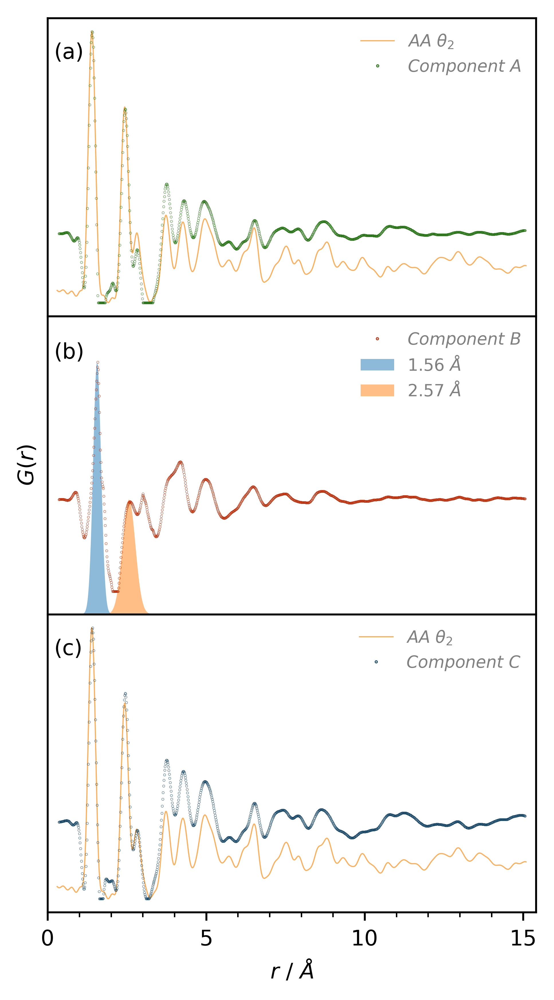

In [185]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

ar = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=0, skip_header=7)
nar = ar+((ar/0.26)*0.013)
ag = np.genfromtxt('NMF\ComponentA.gr', delimiter=' ', usecols=1, skip_header=7)
nag = (ag-ag.min())/(ag.max()-ag.min())
br = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=0, skip_header=7)
nbr = br+((br/0.26)*0.013)
bg = np.genfromtxt('NMF\ComponentB.gr', delimiter=' ', usecols=1, skip_header=7)
nbg = (bg-bg.min())/(bg.max()-bg.min())
cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())
tr = np.genfromtxt('turbostratic structures\calc_pdf\AA_theta2_4Layer.cgr', delimiter=' ', usecols=0, skip_header=9)
tg = np.genfromtxt('turbostratic structures\calc_pdf\AA_theta2_4Layer.cgr', delimiter=' ', usecols=1, skip_header=9)
ntg = (tg-tg.min())/(tg.max()-tg.min())


x1 = np.genfromtxt('0_2ndrun_peaks.csv', usecols=0, delimiter=',')
x2 = np.genfromtxt('1_2ndrun_peaks.csv', usecols=0, delimiter=',')

f1 = np.genfromtxt('0_2ndrun_peaks.csv', usecols=1, delimiter=',')
f2 = np.genfromtxt('1_2ndrun_peaks.csv', usecols=1, delimiter=',')




f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*3.16)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0], hspace=0, wspace=0) 
ax0 = plt.subplot(G00[0,0])
ax1 = plt.subplot(G00[1,0])
ax2 = plt.subplot(G00[2,0])
ax2.tick_params(axis='x', labelsize=9)
ax2.minorticks_on()

ax0.plot(tr[20:1500],ntg[20:1500],color='#f7b263', linewidth=0.5, label=r'$\it{AA}$ $\it{\theta_{2}}$')
ax0.plot(nar[0:1130],nag[0:1130],color='#1C6B0A', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{A}$')

ax1.plot(nbr[0:1130],(nbg[0:1130])+0.1,color='#B82601', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{B}$')
ax1.stackplot(x1,(f1/0.000129778)*1.1,alpha=0.5,labels=([r'$\it{1.56}$ $\it{\AA}$']))
ax1.stackplot(x2,(f2/0.0000582112)*0.5,alpha=0.5,labels=([r'$\it{2.57}$ $\it{\AA}$']))
#ax1.stackplot(x2,f2,alpha=0.5,labels=([r'$\it{2.99}$ $\it{\AA}$']))
#ax1.stackplot(x4,f4,alpha=0.5,labels=([r'$\it{3.71}$ $\it{\AA}$']))
#ax1.stackplot(x5,f5,alpha=0.5,labels=([r'$\it{4.12}$ $\it{\AA}$']))

ax2.plot(tr[20:1500],ntg[20:1500],color='#f7b263', linewidth=0.5, label=r'$\it{AA}$ $\it{\theta_{2}}$')
ax2.plot(ncr[0:1130],ncg[0:1130],color='#0B3C5D', marker='o', markersize=0.1, linewidth=0, label=r'$\it{Component}$ $\it{C}$')

ax2.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax1.set_ylabel(r'$\it{G(r)}$', rotation='vertical', fontsize=9)
ax0.set_xlim(0,15.4)
ax1.set_xlim(0,15.4)
ax1.set_ylim(0,1.3)
ax2.set_xlim(0,15.4)
l = ax2.legend(loc=1, frameon=False,markerscale=3, fontsize=7)
for text in l.get_texts():
    text.set_color('#808080')
k = ax1.legend(loc=1, frameon=False,markerscale=3, fontsize=7, ncol=1)
for text in k.get_texts():
    text.set_color('#808080')
j = ax0.legend(loc=1, frameon=False,markerscale=3, fontsize=7)
for text in j.get_texts():
    text.set_color('#808080')

ax0.text(0.2,0.9,r"(a)",fontsize=9)
ax1.text(0.2,1.115,r"(b)",fontsize=9)
ax2.text(0.2,0.9,r"(c)",fontsize=9)
ax0.set_yticks([])
ax0.set_xticks([])
ax1.set_yticks([])
ax1.set_xticks([])
ax2.set_yticks([])
ax2.set_xticks([0,5,10,15])
ax0.yaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')

f.tight_layout()
plt.savefig('20200507_Dan_COF_NMF-PDF_Components_Annotated.tif',bbox_inches='tight')
plt.show()

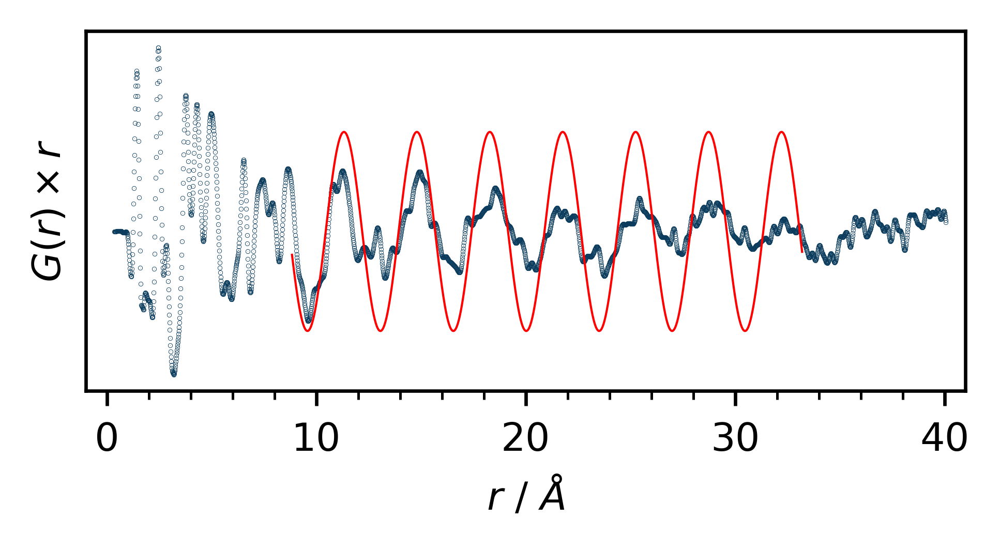

"data = {'r(1)':ncr[0:3050],'ComponentC_G(r)xr':(nncg[0:3050]*(ncr[0:3050]))} \ndata1 = {'r(2)':cr[685:2650], 'sin':x[685:2650]}\ndf = pd.DataFrame(data=data)\ndf.to_csv('ComponentC_Grxr.csv')\ndf1 = pd.DataFrame(data=data1)\ndf1.to_csv('ComponentC_Sin.csv')"

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
import pandas as pd
import os
import sys

#PDF



path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\\'
os.chdir(path)

cr = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=0, skip_header=7)
ncr = cr+((cr/0.26)*0.013)
cg = np.genfromtxt('NMF\ComponentC.gr', delimiter=' ', usecols=1, skip_header=7)
ncg = (cg-cg.min())/(cg.max()-cg.min())
nncg = ncg-ncg[0]
x = 0.628*(np.sin(2*np.pi*(3.517*6.28)*(cr*0.013)))



f = plt.figure(dpi=600, edgecolor=None)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs0[0], hspace=0, wspace=0) 

ax0 = plt.subplot(G00[0,0])

ax0.set_yticks(())
ax0.tick_params(axis='x', labelsize=9)
ax0.minorticks_on()
color='#0B3C5D'
ax0.plot(ncr[0:3050],(nncg[0:3050]*(ncr[0:3050])),color=color, marker='o', markersize=0.1, linewidth=0, label=r"$\it{Component}$ $\it{A}$")
ax0.plot(cr[685:2650], x[685:2650],'r', linewidth=0.5)
ax0.set_xlabel(r'$\it{r}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{G(r) \times r}$', rotation='vertical', fontsize=9)
ax0.set_xlim(-1,41)
#ax0.set_ylim(-0.000045,0.00006)

#ax0.text(19, 0.2, '12.5 %', fontsize=9, color='#808080')
f.tight_layout()
plt.savefig('20200515_Dan_COF_CompC_LayerStacks.svg')
plt.show()

'''data = {'r(1)':ncr[0:3050],'ComponentC_G(r)xr':(nncg[0:3050]*(ncr[0:3050]))} 
data1 = {'r(2)':cr[685:2650], 'sin':x[685:2650]}
df = pd.DataFrame(data=data)
df.to_csv('ComponentC_Grxr.csv')
df1 = pd.DataFrame(data=data1)
df1.to_csv('ComponentC_Sin.csv')'''

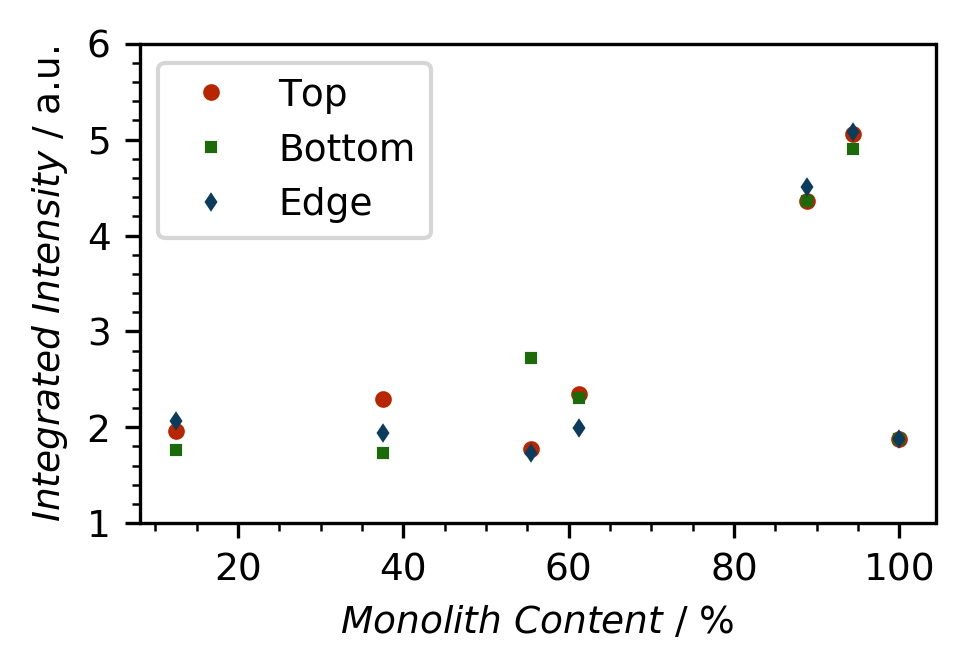

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'C:\Crystallography\_2_raw\201912_11-ID-B_Monoliths_mail-in_raw\PDF_re-do\iq\\'
os.chdir(path)

H_ind = [12.5,37.5,55.5,61.2,88.8,94.4,100]

HA=[2.064833401,1.936087604,1.729359875,1.990634723,4.511176806,5.081636465,1.877473716] #edge
HB=[1.958118045,2.299983407,1.776649713,2.347054927,4.359369240,5.058515759,1.877473716] #top
HC=[1.768269214,1.735721400,2.725600550,2.304897499,4.358135115,4.899826015,1.877473716] #bottom


f = plt.figure(dpi=300)
f.set_figheight(1.87*1.25)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0)

ax0 = plt.subplot(G00[0,0])

ax0.plot(H_ind, HB, color='#B82601', marker='o', markersize=3, alpha=1, linewidth=0, label='Top')
ax0.plot(H_ind, HC, color='#1C6B0A', marker='s', markersize=2, alpha=1, linewidth=0, label='Bottom')
ax0.plot(H_ind, HA, color='#0B3C5D', marker='d', markersize=2, alpha=1, linewidth=0, label='Edge')
ax0.legend(loc=2, fontsize=9, frameon=True)
ax0.ticklabel_format(style='plain')
ax0.minorticks_on()
ax0.set_ylim(1,6)
ax0.set_xticks((20,40,60,80,100))
ax0.tick_params(axis='x', labelsize=9)
ax0.tick_params(axis='y', labelsize=9)

ax0.set_xlabel(r'$\it{Monolith}$ $\it{Content}$ / %', fontsize=9)
ax0.set_ylabel(r'$\it{Integrated}$ ${Intensity}$ / a.u.', fontsize=9)

#ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

f.tight_layout()
plt.savefig('20200515_Dan_COF_XRD_IntegratedIntensities.tif')
plt.show()

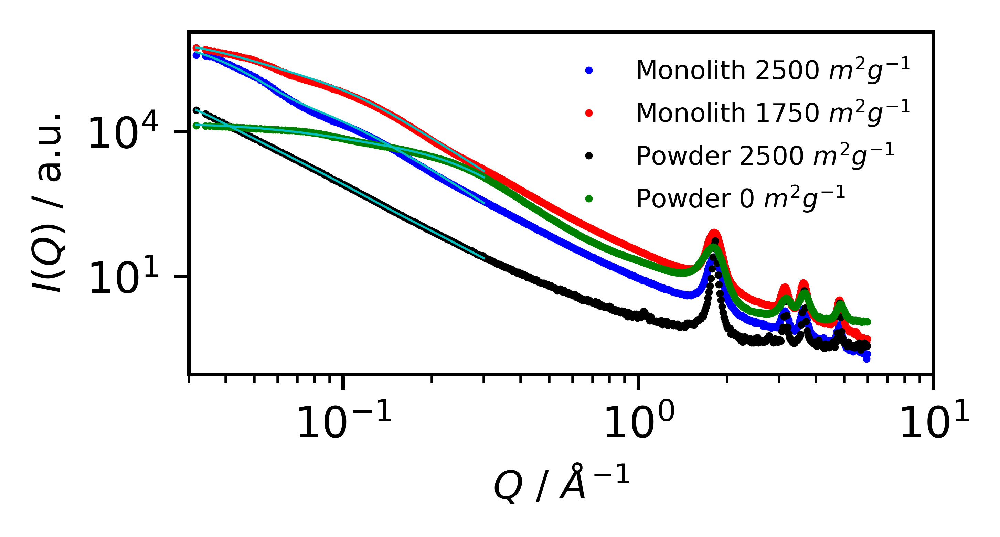

In [185]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'F:\2020_Chapman_ONolan_monoCOFs\SAXS\SAXS PSI\PSI_SAXS\PreparedSAXSfiles\\'
os.chdir(path)

Q1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)
Q2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)
Q3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)
Q4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)


f = plt.figure(dpi=900)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0)

ax0 = plt.subplot(G00[0,0])
ax0.plot(Q1,R1,'bo',markersize=0.75,label=r'Monolith 2500 $m^{2}g^{-1}$')
ax0.plot(Q2,R2,'ro',markersize=0.75,label=r'Monolith 1750 $m^{2}g^{-1}$')
ax0.plot(Q3,R3,'ko',markersize=0.75,label=r'Powder 2500 $m^{2}g^{-1}$')
ax0.plot(Q4,R4,'go',markersize=0.75,label=r'Powder 0 $m^{2}g^{-1}$')

ax0.plot(Q1[0:135],W1[0:135], linewidth=0.5, color='c')
ax0.plot(Q2[0:135],W2[0:135], linewidth=0.5, color='c')
ax0.plot(Q3[0:135],W3[0:135], linewidth=0.5, color='c')
ax0.plot(Q4[0:135],W4[0:135], linewidth=0.5, color='c')


plt.yscale('log')
plt.xscale('log')
ax0.minorticks_on()
ax0.legend(loc=1, fontsize=6, frameon=False)

ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax0.set_ylabel(r'$\it{I(Q)}$ / a.u.', fontsize=9)
ax0.set_xlim(0.03,10)
#ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

f.tight_layout()
plt.savefig('20200710_Dan_COF_SAXS_UnifiedFit.tif')
plt.show()

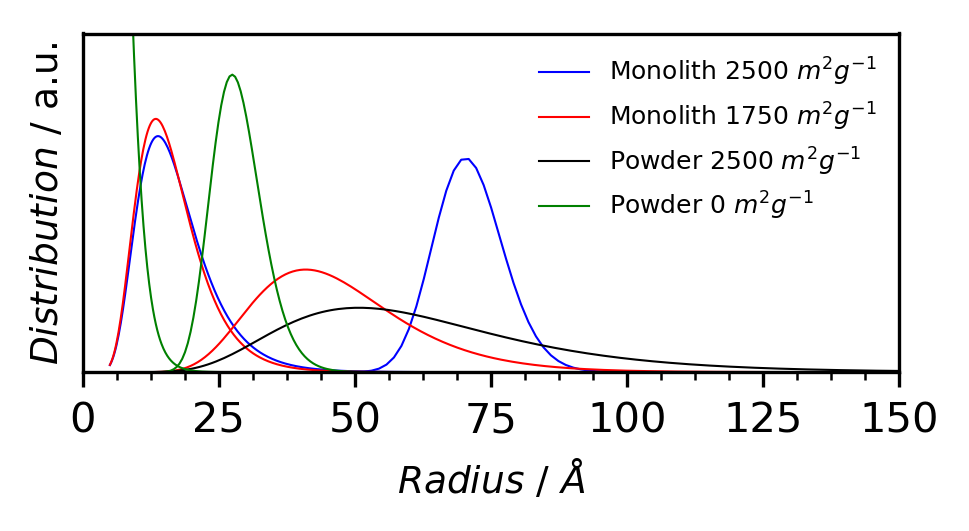

In [147]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText

path =r'F:\2020_Chapman_ONolan_monoCOFs\SAXS\SAXS PSI\PSI_SAXS\PreparedSAXSfiles\\'
os.chdir(path)

Q11 = np.genfromtxt('SizeDistributionSAXS_Sample1.csv',delimiter=',',skip_header=int(2), usecols=0)
R11 = np.genfromtxt('SizeDistributionSAXS_Sample1.csv',delimiter=',',skip_header=int(2), usecols=2)
Q12 = np.genfromtxt('SizeDistributionSAXS_Sample1.csv',delimiter=',',skip_header=int(2), usecols=4)
R12 = np.genfromtxt('SizeDistributionSAXS_Sample1.csv',delimiter=',',skip_header=int(2), usecols=6)

Q21 = np.genfromtxt('SizeDistributionSAXS_Sample2.csv',delimiter=',',skip_header=int(2), usecols=0)
R21 = np.genfromtxt('SizeDistributionSAXS_Sample2.csv',delimiter=',',skip_header=int(2), usecols=2)
Q22 = np.genfromtxt('SizeDistributionSAXS_Sample2.csv',delimiter=',',skip_header=int(2), usecols=4)
R22 = np.genfromtxt('SizeDistributionSAXS_Sample2.csv',delimiter=',',skip_header=int(2), usecols=6)

Q31 = np.genfromtxt('SizeDistributionSAXS_Sample3.csv',delimiter=',',skip_header=int(2), usecols=0)
R31 = np.genfromtxt('SizeDistributionSAXS_Sample3.csv',delimiter=',',skip_header=int(2), usecols=2)

Q41 = np.genfromtxt('SizeDistributionSAXS_Sample4.csv',delimiter=',',skip_header=int(2), usecols=0)
R41 = np.genfromtxt('SizeDistributionSAXS_Sample4.csv',delimiter=',',skip_header=int(2), usecols=2)
Q42 = np.genfromtxt('SizeDistributionSAXS_Sample4.csv',delimiter=',',skip_header=int(2), usecols=4)
R42 = np.genfromtxt('SizeDistributionSAXS_Sample4.csv',delimiter=',',skip_header=int(2), usecols=6)


f = plt.figure(dpi=300)
f.set_figheight(1.87*1)
f.set_figwidth(3.33*1)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[0], hspace=0, wspace=0)

ax0 = plt.subplot(G00[0,0])
ax0.plot(Q11,R11,'b',linewidth=0.5,label=r'Monolith 2500 $m^{2}g^{-1}$')
ax0.plot(Q12,R12,'b',linewidth=0.5)

ax0.plot(Q21,R21,'r',linewidth=0.5,label=r'Monolith 1750 $m^{2}g^{-1}$')
ax0.plot(Q22,R22,'r',linewidth=0.5)

ax0.plot(Q31,R31,'k',linewidth=0.5,label=r'Powder 2500 $m^{2}g^{-1}$')

ax0.plot(Q41,R41,'g',linewidth=0.5,label=r'Powder 0 $m^{2}g^{-1}$')
ax0.plot(Q42,R42,'g',linewidth=0.5)

ax0.legend(loc=1, fontsize=6, frameon=False)
ax0.minorticks_on()
ax0.set_ylim(0,0.01)
ax0.set_yticks(())
ax0.set_xlim(0,150)
ax0.set_xlabel(r'$\it{Radius}$ / $\AA$', fontsize=9)
ax0.set_ylabel(r'$\it{Distribution}$ / a.u.', fontsize=9)

#ax0.add_artist(AnchoredText(r"$\it{Component}$ $\it{A}$", loc=1, frameon=False, prop=dict(color='#808080', fontsize=9)))

f.tight_layout()
plt.savefig('20200710_Dan_COF_SAXS_SizeDistribution.tif')
plt.show()

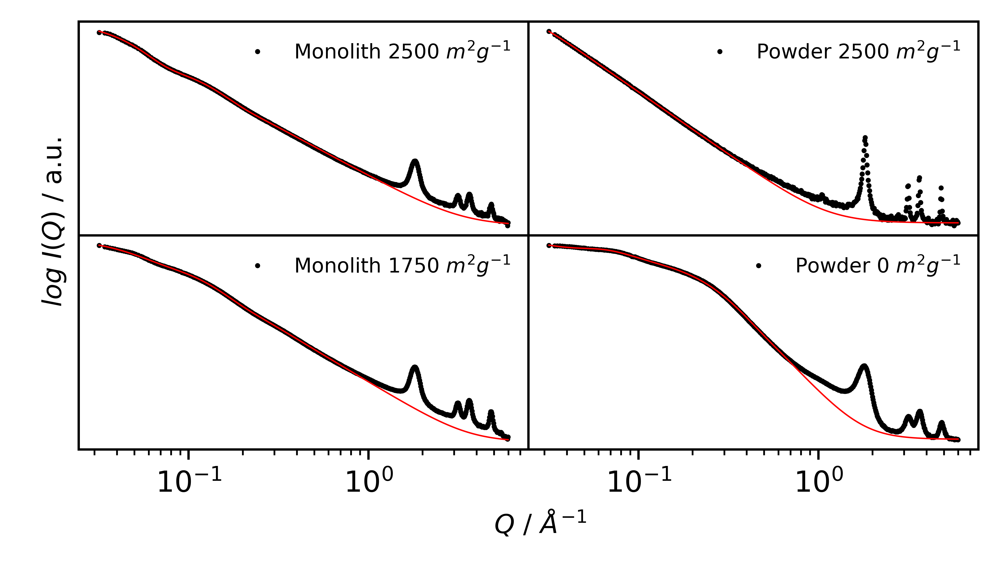

In [221]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText
####################################################################################################
path =r'F:\2020_Chapman_ONolan_monoCOFs\SAXS\SAXS PSI\PSI_SAXS\\'
os.chdir(path)
####################################################################################################
Q1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W1 = np.genfromtxt('Sample1_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)
Q2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W2 = np.genfromtxt('Sample2_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)
Q3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(39), usecols=0)
R3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(39), usecols=1)
S3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(39), usecols=2)
W3 = np.genfromtxt('Sample3_SAXS_SAS_model.txt',delimiter='	',skip_header=int(39), usecols=3)
Q4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=0)
R4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=1)
S4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=2)
W4 = np.genfromtxt('Sample4_SAXS_SAS_model.txt',delimiter='	',skip_header=int(60), usecols=3)
####################################################################################################
f = plt.figure(dpi=900)
f.set_figheight(1.87*1.5)
f.set_figwidth(3.33*1.5)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs0[0], hspace=0, wspace=0)
####################################################################################################
ax0 = plt.subplot(G00[0:1,0:1])
ax0.plot(Q1,R1,'ko',markersize=0.75,label=r'Monolith 2500 $m^{2}g^{-1}$')
ax0.plot(Q1,W1, linewidth=0.5, color='r')
ax0.set_xscale("log")
ax0.set_yscale("log")
ax0.set_yticks(())
####################################################################################################
ax1 = plt.subplot(G00[1:2,0:1])
ax1.plot(Q2,R2,'ko',markersize=0.75,label=r'Monolith 1750 $m^{2}g^{-1}$')
ax1.plot(Q2,W2, linewidth=0.5, color='r')
ax1.set_xscale("log")
ax1.set_yscale("log")
ax1.set_yticks(())
####################################################################################################
ax2 = plt.subplot(G00[0:1,1:2])
ax2.plot(Q3,R3,'ko',markersize=0.75,label=r'Powder 2500 $m^{2}g^{-1}$')
ax2.plot(Q3,W3, linewidth=0.5, color='r')
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_yticks(())
####################################################################################################
ax3 = plt.subplot(G00[1:2,1:2])
ax3.plot(Q4,R4,'ko',markersize=0.75,label=r'Powder 0 $m^{2}g^{-1}$')
ax3.plot(Q4,W4, linewidth=0.5, color='r')
ax3.set_xscale("log")
ax3.set_yscale("log")
ax3.set_yticks(())
####################################################################################################
ax0.legend(loc=1, fontsize=7, frameon=False)
ax1.legend(loc=1, fontsize=7, frameon=False)
ax2.legend(loc=1, fontsize=7, frameon=False)
ax3.legend(loc=1, fontsize=7, frameon=False)
ax1.set_xlabel(r'                                                         $\it{Q}$ / $\AA^{-1}$', fontsize=9)
ax1.set_ylabel(r'                             $\it{log}$ $\it{I(Q)}$ / a.u.', fontsize=9)
####################################################################################################
f.tight_layout()
plt.savefig('20200711_Dan_COF_SAXS_UnifiedFit.tif')
plt.show()

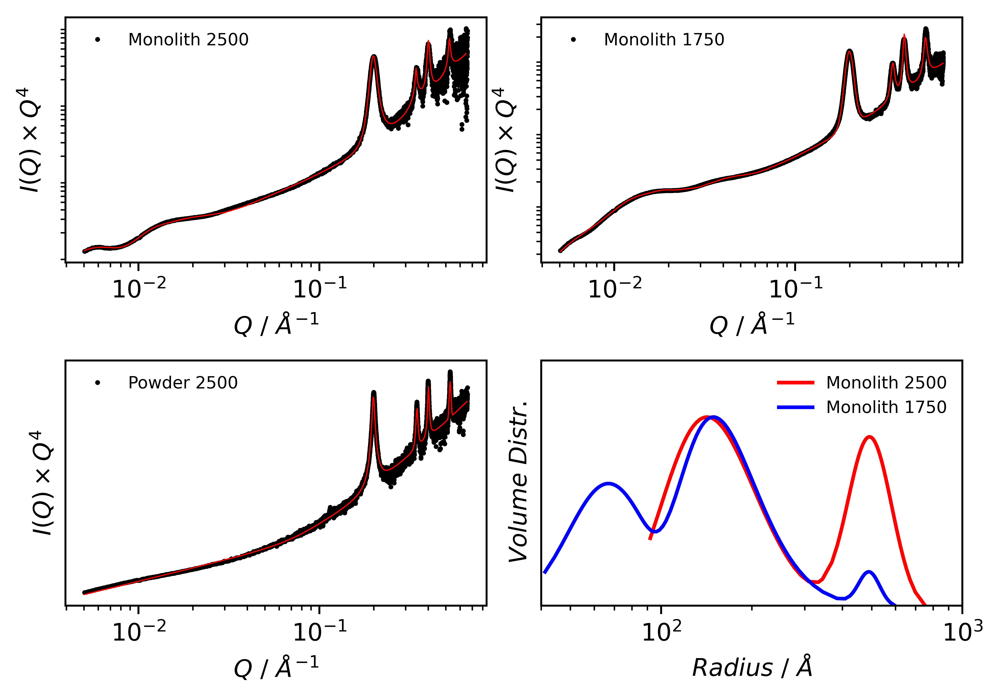

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import os
import sys
from matplotlib.offsetbox import AnchoredText
####################################################################################################
path =r'D:\2020_Chapman_ONolan_monoCOFs\SAXS\SAXS PSI\PSI_SAXS\\'
os.chdir(path)
####################################################################################################
Q_model_1 = np.genfromtxt('CorrectedQ_Sample1_Model.csv', delimiter=',', usecols=0)
I_model_1 = np.genfromtxt('CorrectedQ_Sample1_Model.csv', delimiter=',', usecols=1)
Q_data_1 = np.genfromtxt('Sample1_SAXS_Q.txt', delimiter=' ', usecols=1,skip_header=int(14))
I_data_1 = np.genfromtxt('Sample1_SAXS_Q.txt', delimiter=' ', usecols=2,skip_header=int(14))
R_SizeDistro_1 = np.genfromtxt('CorrectedQ_Sample1_SizeDistro.csv',delimiter=',',usecols=0,skip_header=int(1))
V_SizeDistro_1 = np.genfromtxt('CorrectedQ_Sample1_SizeDistro.csv',delimiter=',',usecols=1,skip_header=int(1))
V_SizeDistro_1 = (V_SizeDistro_1-V_SizeDistro_1.min())/(V_SizeDistro_1.max()-V_SizeDistro_1.min())
####################################################################################################
Q_model_2 = np.genfromtxt('CorrectedQ_Sample2_Model.csv', delimiter=',', usecols=0)
I_model_2 = np.genfromtxt('CorrectedQ_Sample2_Model.csv', delimiter=',', usecols=1)
Q_data_2 = np.genfromtxt('Sample2_SAXS_Q.txt', delimiter=' ', usecols=1,skip_header=int(14))
I_data_2 = np.genfromtxt('Sample2_SAXS_Q.txt', delimiter=' ', usecols=2,skip_header=int(14))
R_SizeDistro_2 = np.genfromtxt('CorrectedQ_Sample2_SizeDistro.csv',delimiter=',',usecols=0,skip_header=int(1))
V_SizeDistro_2 = np.genfromtxt('CorrectedQ_Sample2_SizeDistro.csv',delimiter=',',usecols=1,skip_header=int(1))
V_SizeDistro_2 = (V_SizeDistro_2-V_SizeDistro_2.min())/(V_SizeDistro_2.max()-V_SizeDistro_2.min())
####################################################################################################
Q_model_3 = np.genfromtxt('CorrectedQ_Sample3_Model.csv', delimiter=',', usecols=0)
I_model_3 = np.genfromtxt('CorrectedQ_Sample3_Model.csv', delimiter=',', usecols=1)
Q_data_3 = np.genfromtxt('Sample3_SAXS_Q.txt', delimiter=' ', usecols=1,skip_header=int(14))
I_data_3 = np.genfromtxt('Sample3_SAXS_Q.txt', delimiter=' ', usecols=2,skip_header=int(14))
####################################################################################################
f = plt.figure(dpi=900)
f.set_figheight(1.87*2.4)
f.set_figwidth(3.33*2)
gs0 = gridspec.GridSpec(1, 1, figure=f, wspace=0)
G00 = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs0[0], hspace=0.4, wspace=0.13)
####################################################################################################
ax0 = plt.subplot(G00[0:1,0:1])
ax0.plot(Q_data_1,(I_data_1)*((Q_data_1)**4),'ko',markersize=1, label='Monolith 2500')
ax0.plot(Q_model_1,(I_model_1)*((Q_model_1)**4),color='r', linewidth=0.5)

ax0.legend(loc=2, fontsize=7, frameon=False)
ax0.set_xscale("log")
ax0.set_yscale("log")
ax0.set_yticks(())
ax0.set_ylabel(r'$\it{I(Q) \times Q^{4}}$')
ax0.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$')
####################################################################################################
ax2 = plt.subplot(G00[0:1,1:2])
ax2.plot(Q_data_2,(I_data_2)*((Q_data_2)**4),'ko',markersize=1, label='Monolith 1750')
ax2.plot(Q_model_2,(I_model_2)*((Q_model_2)**4),color='r', linewidth=0.5)
ax2.legend(loc=2, fontsize=7, frameon=False)
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_yticks(())
ax2.set_ylabel(r'$\it{I(Q) \times Q^{4}}$')
ax2.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$')
####################################################################################################
ax4 = plt.subplot(G00[1:2,0:1])
ax4.plot(Q_data_3,(I_data_3)*((Q_data_3)**4),'ko',markersize=1, label='Powder 2500')
ax4.plot(Q_model_3,(I_model_3)*((Q_model_3)**4),color='r', linewidth=0.5)
ax4.legend(loc=2, fontsize=7, frameon=False)
ax4.set_xscale("log")
ax4.set_yscale("log")
ax4.set_yticks(())
ax4.set_ylabel(r'$\it{I(Q) \times Q^{4}}$')
ax4.set_xlabel(r'$\it{Q}$ / $\AA^{-1}$')
####################################################################################################
ax5 = plt.subplot(G00[1:2,1:2])
ax5.plot(R_SizeDistro_1, V_SizeDistro_1, 'r', label='Monolith 2500')
ax5.plot(R_SizeDistro_2, V_SizeDistro_2, 'b', label='Monolith 1750')
ax5.legend(loc=1, fontsize=7, frameon=False)
ax5.set_yticks(())
ax5.set_ylabel(r'$\it{Volume}$ $\it{Distr.}$')
ax5.set_xlabel(r'$\it{Radius}$ / $\AA$')
ax5.set_xlim(40,1000)
ax5.set_ylim(0,1.3)
ax5.set_xscale("log")
####################################################################################################
plt.savefig('20200813_Dan_COF_SAXS.svg', bbox_inches='tight')
plt.show()